In [1]:
import pylab as pl
from glob import glob
import warnings
warnings.filterwarnings('ignore')
try:
    get_ipython().magic("matplotlib inline")
except:
    pl.ion()
import numpy as np
import csv
import os
import datetime
import pandas as pd
import shapefile as shp
import matplotlib
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
from matplotlib import ticker
import netCDF4 as nc4
from datetime import date,timedelta
import plotly.graph_objs as go
import matplotlib.lines as mlines
import seaborn as sns
import shapely as shp
from shapely.geometry import Point
from geopandas.tools import sjoin
import importlib
import geopandas as gpd
from matplotlib.patches import Rectangle
from collections import Counter
import time
import _pickle as pickle
from mpl_toolkits.axes_grid1 import make_axes_locatable
import cartopy.crs as ccrs 
#import external functions (need pip install ipynb)
import ipynb.fs.full.HaileventsFunctions as HF

# 3) OT CHARACTERIZATION and FILT-UNFILT OTs COMPARISON

## 3.0) - Preamble: load data folder, shapefiles, lat-lon domain, define days of interest, load OT filt-unfilt data

In [2]:
#Define preliminar parameters: files folder, shapefiles, lat-lon domain
fold, sf_geo, sfg_land, sf_sp, lonmin, lonmax, latmin, latmax, x_lim, y_lim, hhmin, hhmax = HF.HF_preamble()

In [3]:
plt_fold = '/home/ciccuz/phd/KIT/scripts/plots_2016-2020_FULL/OTdistrCharact'

In [4]:
#Read SPHERA data (10km grid) and couple box number to coordinate locations:
sfg_sp = gpd.read_file(fold + "data/lampinet/mask/grid_10_49N.shp", encoding='latin-1')
grid = sfg_sp

In [5]:
#DEFINE LIST OF DAYS WITH JULIAN DAY AND DATETIME FORMAT:

#days in 2016: 214 days (actually 211 because the following days are missing: 2016185,2016186,2016201 )
days_2016 = [2016092,2016093,2016094,2016095,2016096,2016097,2016098,2016099,2016100,2016101,2016102,2016103,2016104,
        2016105,2016106,2016107,2016108,2016109,2016110,2016111,2016112,2016113,2016114,2016115,2016116,2016117,
        2016118,2016119,2016120,2016121,2016122,2016123,2016124,2016125,2016126,2016127,2016128,2016129,2016130,
        2016131,2016132,2016133,2016134,2016135,2016136,2016137,2016138,2016139,2016140,2016141,2016142,2016143,
        2016144,2016145,2016146,2016147,2016148,2016149,2016150,2016151,2016152,2016153,2016154,2016155,2016156,
        2016157,2016158,2016159,2016160,2016161,2016162,2016163,2016164,2016165,2016166,2016167,2016168,2016169,
        2016170,2016171,2016172,2016173,2016174,2016175,2016176,2016177,2016178,2016179,2016180,2016181,2016182,
        2016183,2016184,2016185,2016186,2016187,2016188,2016189,2016190,2016191,2016192,2016193,2016194,2016195,
        2016196,2016197,2016198,2016199,2016200,2016201,2016202,2016203,2016204,2016205,2016206,2016207,2016208,
        2016209,2016210,2016211,2016212,2016213,2016214,2016215,2016216,2016217,2016218,2016219,2016220,2016221,
        2016222,2016223,2016224,2016225,2016226,2016227,2016228,2016229,2016230,2016231,2016232,2016233,2016234,
        2016235,2016236,2016237,2016238,2016239,2016240,2016241,2016242,2016243,2016244,2016245,2016246,2016247,
        2016248,2016249,2016250,2016251,2016252,2016253,2016254,2016255,2016256,2016257,2016258,2016259,2016260,
        2016261,2016262,2016263,2016264,2016265,2016266,2016267,2016268,2016269,2016270,2016271,2016272,2016273,
        2016274,2016275,2016276,2016277,2016278,2016279,2016280,2016281,2016282,2016283,2016284,2016285,2016286,
        2016287,2016288,2016289,2016290,2016291,2016292,2016293,2016294,2016295,2016296,2016297,2016298,2016299,
        2016300,2016301,2016302,2016303,2016304,2016305]

#days in 2017: missing 1 april (2017091), 213 days
days_2017 = [2017091,2017092,2017093,2017094,2017095,2017096,2017097,2017098,2017099,2017100,2017101,2017102,2017103,2017104,
        2017105,2017106,2017107,2017108,2017109,2017110,2017111,2017112,2017113,2017114,2017115,2017116,2017117,
        2017118,2017119,2017120,2017121,2017122,2017123,2017124,2017125,2017126,2017127,2017128,2017129,2017130,
        2017131,2017132,2017133,2017134,2017135,2017136,2017137,2017138,2017139,2017140,2017141,2017142,2017143,
        2017144,2017145,2017146,2017147,2017148,2017149,2017150,2017151,2017152,2017153,2017154,2017155,2017156,
        2017157,2017158,2017159,2017160,2017161,2017162,2017163,2017164,2017165,2017166,2017167,2017168,2017169,
        2017170,2017171,2017172,2017173,2017174,2017175,2017176,2017177,2017178,2017179,2017180,2017181,2017182,
        2017183,2017184,2017185,2017186,2017187,2017188,2017189,2017190,2017191,2017192,2017193,2017194,2017195,
        2017196,2017197,2017198,2017199,2017200,2017201,2017202,2017203,2017204,2017205,2017206,2017207,2017208,
        2017209,2017210,2017211,2017212,2017213,2017214,2017215,2017216,2017217,2017218,2017219,2017220,2017221,
        2017222,2017223,2017224,2017225,2017226,2017227,2017228,2017229,2017230,2017231,2017232,2017233,2017234,
        2017235,2017236,2017237,2017238,2017239,2017240,2017241,2017242,2017243,2017244,2017245,2017246,2017247,
        2017248,2017249,2017250,2017251,2017252,2017253,2017254,2017255,2017256,2017257,2017258,2017259,2017260,
        2017261,2017262,2017263,2017264,2017265,2017266,2017267,2017268,2017269,2017270,2017271,2017272,2017273,
        2017274,2017275,2017276,2017277,2017278,2017279,2017280,2017281,2017282,2017283,2017284,2017285,2017286,
        2017287,2017288,2017289,2017290,2017291,2017292,2017293,2017294,2017295,2017296,2017297,2017298,2017299,
        2017300,2017301,2017302,2017303,2017304]

#days in 2018: missing 1 april (2018091) and 17 june (2018168), 212 days
days_2018 = [2018091,2018092,2018093,2018094,2018095,2018096,2018097,2018098,2018099,2018100,2018101,2018102,2018103,2018104,
        2018105,2018106,2018107,2018108,2018109,2018110,2018111,2018112,2018113,2018114,2018115,2018116,2018117,
        2018118,2018119,2018120,2018121,2018122,2018123,2018124,2018125,2018126,2018127,2018128,2018129,2018130,
        2018131,2018132,2018133,2018134,2018135,2018136,2018137,2018138,2018139,2018140,2018141,2018142,2018143,
        2018144,2018145,2018146,2018147,2018148,2018149,2018150,2018151,2018152,2018153,2018154,2018155,2018156,
        2018157,2018158,2018159,2018160,2018161,2018162,2018163,2018164,2018165,2018166,2018167,2018168,2018169,
        2018170,2018171,2018172,2018173,2018174,2018175,2018176,2018177,2018178,2018179,2018180,2018181,2018182,
        2018183,2018184,2018185,2018186,2018187,2018188,2018189,2018190,2018191,2018192,2018193,2018194,2018195,
        2018196,2018197,2018198,2018199,2018200,2018201,2018202,2018203,2018204,2018205,2018206,2018207,2018208,
        2018209,2018210,2018211,2018212,2018213,2018214,2018215,2018216,2018217,2018218,2018219,2018220,2018221,
        2018222,2018223,2018224,2018225,2018226,2018227,2018228,2018229,2018230,2018231,2018232,2018233,2018234,
        2018235,2018236,2018237,2018238,2018239,2018240,2018241,2018242,2018243,2018244,2018245,2018246,2018247,
        2018248,2018249,2018250,2018251,2018252,2018253,2018254,2018255,2018256,2018257,2018258,2018259,2018260,
        2018261,2018262,2018263,2018264,2018265,2018266,2018267,2018268,2018269,2018270,2018271,2018272,2018273,
        2018274,2018275,2018276,2018277,2018278,2018279,2018280,2018281,2018282,2018283,2018284,2018285,2018286,
        2018287,2018288,2018289,2018290,2018291,2018292,2018293,2018294,2018295,2018296,2018297,2018298,2018299,
        2018300,2018301,2018302,2018303,2018304]

days_2019 = [2019091,2019092,2019093,2019094,2019095,2019096,2019097,2019098,2019099,2019100,2019101,2019102,2019103,2019104,
        2019105,2019106,2019107,2019108,2019109,2019110,2019111,2019112,2019113,2019114,2019115,2019116,2019117,
        2019118,2019119,2019120,2019121,2019122,2019123,2019124,2019125,2019126,2019127,2019128,2019129,2019130,
        2019131,2019132,2019133,2019134,2019135,2019136,2019137,2019138,2019139,2019140,2019141,2019142,2019143,
        2019144,2019145,2019146,2019147,2019148,2019149,2019150,2019151,2019152,2019153,2019154,2019155,2019156,
        2019157,2019158,2019159,2019160,2019161,2019162,2019163,2019164,2019165,2019166,2019167,2019168,2019169,
        2019170,2019171,2019172,2019173,2019174,2019175,2019176,2019177,2019178,2019179,2019180,2019181,2019182,
        2019183,2019184,2019185,2019186,2019187,2019188,2019189,2019190,2019191,2019192,2019193,2019194,2019195,
        2019196,2019197,2019198,2019199,2019200,2019201,2019202,2019203,2019204,2019205,2019206,2019207,2019208,
        2019209,2019210,2019211,2019212,2019213,2019214,2019215,2019216,2019217,2019218,2019219,2019220,2019221,
        2019222,2019223,2019224,2019225,2019226,2019227,2019228,2019229,2019230,2019231,2019232,2019233,2019234,
        2019235,2019236,2019237,2019238,2019239,2019240,2019241,2019242,2019243,2019244,2019245,2019246,2019247,
        2019248,2019249,2019250,2019251,2019252,2019253,2019254,2019255,2019256,2019257,2019258,2019259,2019260,
        2019261,2019262,2019263,2019264,2019265,2019266,2019267,2019268,2019269,2019270,2019271,2019272,2019273,
        2019274,2019275,2019276,2019277,2019278,2019279,2019280,2019281,2019282,2019283,2019284,2019285,2019286,
        2019287,2019288,2019289,2019290,2019291,2019292,2019293,2019294,2019295,2019296,2019297,2019298,2019299,
        2019300,2019301,2019302,2019303,2019304]

days_2020 = [2020092,2020093,2020094,2020095,2020096,2020097,2020098,2020099,2020100,2020101,2020102,2020103,2020104,
        2020105,2020106,2020107,2020108,2020109,2020110,2020111,2020112,2020113,2020114,2020115,2020116,2020117,
        2020118,2020119,2020120,2020121,2020122,2020123,2020124,2020125,2020126,2020127,2020128,2020129,2020130,
        2020131,2020132,2020133,2020134,2020135,2020136,2020137,2020138,2020139,2020140,2020141,2020142,2020143,
        2020144,2020145,2020146,2020147,2020148,2020149,2020150,2020151,2020152,2020153,2020154,2020155,2020156,
        2020157,2020158,2020159,2020160,2020161,2020162,2020163,2020164,2020165,2020166,2020167,2020168,2020169,
        2020170,2020171,2020172,2020173,2020174,2020175,2020176,2020177,2020178,2020179,2020180,2020181,2020182,
        2020183,2020184,2020185,2020186,2020187,2020188,2020189,2020190,2020191,2020192,2020193,2020194,2020195,
        2020196,2020197,2020198,2020199,2020200,2020201,2020202,2020203,2020204,2020205,2020206,2020207,2020208,
        2020209,2020210,2020211,2020212,2020213,2020214,2020215,2020216,2020217,2020218,2020219,2020220,2020221,
        2020222,2020223,2020224,2020225,2020226,2020227,2020228,2020229,2020230,2020231,2020232,2020233,2020234,
        2020235,2020236,2020237,2020238,2020239,2020240,2020241,2020242,2020243,2020244,2020245,2020246,2020247,
        2020248,2020249,2020250,2020251,2020252,2020253,2020254,2020255,2020256,2020257,2020258,2020259,2020260,
        2020261,2020262,2020263,2020264,2020265,2020266,2020267,2020268,2020269,2020270,2020271,2020272,2020273,
        2020274,2020275,2020276,2020277,2020278,2020279,2020280,2020281,2020282,2020283,2020284,2020285,2020286,
        2020287,2020288,2020289,2020290,2020291,2020292,2020293,2020294,2020295,2020296,2020297,2020298,2020299,
        2020300,2020301,2020302,2020303,2020304,2020305]

In [6]:
#write dataframes storing julian days and datetimes of OT days:

days_2016_df =pd.DataFrame(index=np.arange(0,len(days_2016),1), columns=['day','dtime'])
days_2017_df =pd.DataFrame(index=np.arange(0,len(days_2017),1), columns=['day','dtime'])
days_2018_df =pd.DataFrame(index=np.arange(0,len(days_2018),1), columns=['day','dtime'])
days_2019_df =pd.DataFrame(index=np.arange(0,len(days_2019),1), columns=['day','dtime'])
days_2020_df =pd.DataFrame(index=np.arange(0,len(days_2020),1), columns=['day','dtime'])

for day,ind in zip(days_2016,np.arange(0,len(days_2016),1)):
    
    dtime = datetime.datetime.strptime('2016-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2016_df.iloc[ind]['day'] = day
    days_2016_df.iloc[ind]['dtime'] = dtime    

for day,ind in zip(days_2017,np.arange(0,len(days_2017),1)):
    
    dtime = datetime.datetime.strptime('2017-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2017_df.iloc[ind]['day'] = day
    days_2017_df.iloc[ind]['dtime'] = dtime    
    
for day,ind in zip(days_2018,np.arange(0,len(days_2018),1)):
    
    dtime = datetime.datetime.strptime('2018-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2018_df.iloc[ind]['day'] = day
    days_2018_df.iloc[ind]['dtime'] = dtime
    
for day,ind in zip(days_2019,np.arange(0,len(days_2019),1)):
    
    dtime = datetime.datetime.strptime('2019-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2019_df.iloc[ind]['day'] = day
    days_2019_df.iloc[ind]['dtime'] = dtime   
    
for day,ind in zip(days_2020,np.arange(0,len(days_2020),1)):
    
    dtime = datetime.datetime.strptime('2020-04-01','%Y-%m-%d') + timedelta(days=int(ind)) 
    
    days_2020_df.iloc[ind]['day'] = day
    days_2020_df.iloc[ind]['dtime'] = dtime   

days_2016_df.dtime = pd.to_datetime(days_2016_df.dtime)
days_2017_df.dtime = pd.to_datetime(days_2017_df.dtime)
days_2018_df.dtime = pd.to_datetime(days_2018_df.dtime)
days_2019_df.dtime = pd.to_datetime(days_2019_df.dtime)
days_2020_df.dtime = pd.to_datetime(days_2020_df.dtime)


#REMOVE MISSING DAYS (after creating dataframes otherwise day and dtime are shifted and wrong!!!)

#-2016: 2016185,2016186,2016201
days_2016_df = days_2016_df[(days_2016_df.day !=2016185) & (days_2016_df.day !=2016186) & 
                            (days_2016_df.day !=2016201)]
#-2017: 2017091 
days_2017_df = days_2017_df[days_2017_df.day != 2017091]

#-2018: 2018091, 2018168
days_2018_df = days_2018_df[(days_2018_df.day != 2018091) & (days_2018_df.day != 2018168)]

#-2019:

#-2020:
days_2020_df = days_2020_df[(days_2020_df.day != 2020092) & (days_2020_df.dtime.dt.month != 10)]

In [ ]:
#read OT dictionary from external file
"""   
OT_2016 = dict()

for d_ind in days_2016_df.index:
    
    day = days_2016_df['day'][d_ind]
    dtime = days_2016_df['dtime'][d_ind]
    
    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2016[day] = OT_dict
 
OT_2017 = dict()

for d_ind in days_2017_df.index:
    
    day = days_2017_df['day'][d_ind]
    dtime = days_2017_df['dtime'][d_ind]
    
    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2017[day] = OT_dict

"""  
OT_2018 = dict()

for d_ind in days_2018_df.index:
    
    day = days_2018_df['day'][d_ind]
    dtime = days_2018_df['dtime'][d_ind]

    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2018[day] = OT_dict 

"""
OT_2019 = dict()

for d_ind in days_2019_df.index:
    
    day = days_2019_df['day'][d_ind]
    dtime = days_2019_df['dtime'][d_ind]
    
    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2019[day] = OT_dict
    
OT_2020 = dict()

for d_ind in days_2020_df.index:
    
    day = days_2020_df['day'][d_ind]
    dtime = days_2020_df['dtime'][d_ind]

    with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/{dtime.year}/OTfilt_{day}.txt', "rb") as file:  
         OT_dict = pickle.load(file)
            
    OT_2020[day] = OT_dict 
    
"""

In [ ]:
OT_year = OT_2018

In [9]:
#extract the full sets of all OTs and filtered OTs considering the whole sample of events
all_OTset = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_K = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_LI = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_DLS = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_H0 = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_CAPE = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])
filt_OTset_FULL = gpd.GeoDataFrame(columns=['lon', 'lat', 'time', 'otpmax', 'geometry'])

for d_ind in days_2018_df.index:
    
    day = days_2018_df['day'][d_ind]
    OTday_hours = OT_year[day]['FILTERED_OTs_Kindex'].keys()
    
    for hour in OTday_hours:
        all_OTset = all_OTset.append(OT_year[day]['ORIGINAL_OTs'][hour].reset_index(drop=True))
        filt_OTset_K = filt_OTset_K.append(OT_year[day]['FILTERED_OTs_Kindex'][hour].reset_index(drop=True))
        filt_OTset_LI = filt_OTset_LI.append(OT_year[day]['FILTERED_OTs_LI'][hour].reset_index(drop=True))
        filt_OTset_DLS = filt_OTset_DLS.append(OT_year[day]['FILTERED_OTs_DLS'][hour].reset_index(drop=True))
        filt_OTset_H0 = filt_OTset_H0.append(OT_year[day]['FILTERED_OTs_H0'][hour].reset_index(drop=True))
        filt_OTset_CAPE = filt_OTset_CAPE.append(OT_year[day]['FILTERED_OTs_CAPE'][hour].reset_index(drop=True))
        filt_OTset_FULL = filt_OTset_FULL.append(OT_year[day]['FULLFILTER_OTs'][hour].reset_index(drop=True))

#Reset index
all_OTset = all_OTset.reset_index(drop=True) 
filt_OTset_K = filt_OTset_K.reset_index(drop=True) 
filt_OTset_DLS = filt_OTset_DLS.reset_index(drop=True) 
filt_OTset_LI = filt_OTset_LI.reset_index(drop=True) 
filt_OTset_H0 = filt_OTset_H0.reset_index(drop=True) 
filt_OTset_CAPE = filt_OTset_CAPE.reset_index(drop=True) 
filt_OTset_FULL = filt_OTset_FULL.reset_index(drop=True) 

#Convert time variable in datetime
all_OTset['time'] = pd.to_datetime(all_OTset['time'])
filt_OTset_K['time'] = pd.to_datetime(filt_OTset_K['time'])
filt_OTset_DLS['time'] = pd.to_datetime(filt_OTset_DLS['time'])
filt_OTset_LI['time'] = pd.to_datetime(filt_OTset_LI['time'])
filt_OTset_H0['time'] = pd.to_datetime(filt_OTset_H0['time'])
filt_OTset_CAPE['time'] = pd.to_datetime(filt_OTset_CAPE['time'])
filt_OTset_FULL['time'] = pd.to_datetime(filt_OTset_FULL['time'])

In [10]:
#Write re-organized data in geodataframes for every filter in external dictionary
OT_gdf_2018_dict = dict()
OT_gdf_2018_dict['all_OTset_2018'] = all_OTset
OT_gdf_2018_dict['filt_OTset_2018_K'] = filt_OTset_K
OT_gdf_2018_dict['filt_OTset_2018_DLS'] = filt_OTset_DLS
OT_gdf_2018_dict['filt_OTset_2018_LI'] = filt_OTset_LI
OT_gdf_2018_dict['filt_OTset_2018_H0'] = filt_OTset_H0
OT_gdf_2018_dict['filt_OTset_2018_CAPE'] = filt_OTset_CAPE
OT_gdf_2018_dict['filt_OTset_2018_FULL'] = filt_OTset_FULL

with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/OT_gdf_2018_dict.txt', 'wb') as file:
         pickle.dump(OT_gdf_2018_dict,file)

#### - Load dictionaries of original and filtered OT sets for whole years

In [8]:
with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/OT_gdf_2016_dict.txt', "rb") as file:  
         OT_gdf_2016_dict = pickle.load(file)

with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/OT_gdf_2017_dict.txt', "rb") as file:  
         OT_gdf_2017_dict = pickle.load(file)    
        
with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/OT_gdf_2018_dict.txt', "rb") as file:  
         OT_gdf_2018_dict = pickle.load(file)    

with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/OT_gdf_2019_dict.txt', "rb") as file:  
         OT_gdf_2019_dict = pickle.load(file)

with open(fold + f'data/OT_filtered_data/tempAgg_3h_5-95pThresh_newFULL_2016-2020/OT_gdf_2020_dict.txt', "rb") as file:  
         OT_gdf_2020_dict = pickle.load(file)
        
#FOR 2020: Drop all data in October 2020!!! (SPHERA problem)
for OTset in OT_gdf_2020_dict.keys():
    OT_gdf_2020_dict[OTset] = OT_gdf_2020_dict[OTset][OT_gdf_2020_dict[OTset]['time'].dt.month!=10]

In [8]:
all_OTset_2016_land = gpd.clip(OT_gdf_2016_dict['all_OTset_2016'], sfg_land).sort_index()
filt_OTset_2016_land = gpd.clip(OT_gdf_2016_dict['filt_OTset_2016_FULL'], sfg_land).sort_index()

In [ ]:
all_OTset_2017_land = gpd.clip(OT_gdf_2017_dict['all_OTset_2017'], sfg_land).sort_index()
filt_OTset_2017_land = gpd.clip(OT_gdf_2017_dict['filt_OTset_2017_FULL'], sfg_land).sort_index()

In [ ]:
all_OTset_2018_land = gpd.clip(OT_gdf_2018_dict['all_OTset_2018'], sfg_land).sort_index()
filt_OTset_2018_land = gpd.clip(OT_gdf_2018_dict['filt_OTset_2018_FULL'], sfg_land).sort_index()

In [ ]:
all_OTset_2019_land = gpd.clip(OT_gdf_2019_dict['all_OTset_2019'], sfg_land).sort_index()
filt_OTset_2019_land = gpd.clip(OT_gdf_2019_dict['filt_OTset_2019_FULL'], sfg_land).sort_index()

In [ ]:
all_OTset_2020_land = gpd.clip(OT_gdf_2020_dict['all_OTset_2020'], sfg_land).sort_index()
filt_OTset_2020_land = gpd.clip(OT_gdf_2020_dict['filt_OTset_2020_FULL'], sfg_land).sort_index()

## NEW THRESHOLDS (SAMPLE 2016-2020):

### - 2016:
In 2016 211 days (in Apr-Oct) were considered. 

A total of **171.947** OTs (with p>=50%) were detected, (over **LAND**: **106.094**, i.e. 61.7% of the total)

After filtering **132.962** OTs were retained (**77.3%**), (over **LAND**: **80.775**, i.e. 76.1% of the total over LAND), meaning that overall **38.985** were removed (22.7%)


### - 2017:
In 2017 213 days (in Apr-Oct) were considered. 

A total of **189.613** OTs (with p>=50%) were detected, (over **LAND**: **133.634**, i.e. 61.7% of the total)

After filtering **148.439** OTs were retained (**78.3%**), (over **LAND**: **104.981**, i.e. 78.6% of the total over LAND), meaning that overall **41.174** were removed (21.7%)

### - 2018:
In 201 213 days (in Apr-Oct) were considered. 

A total of **271.581** OTs (with p>=50%) were detected, (over **LAND**: **152.173**, i.e. 56.0% of the total)

After filtering **214.092** OTs were retained (**78.8%**), (over **LAND**: **117.264**, i.e. 77.6% of the total over LAND), meaning that overall **57.489** were removed (21.2%)

### - 2019:
In 2019 (Apr-Oct) 214 days were considered, and at least 1 OT was found in 182 days.

A total of **208.859** OTs (with p>=.5) were detected, (over **LAND: 112.661** i.e. 54%)

After filtering **137.828** OTs were retained (**66%**), (over **LAND: 75.147** i.e. 66.7% of the total over LAND), meaning that overall **71.031** were removed (34%)

### - 2020:
In 2020 (Apr-Sept) 183 days were considered (**NO OCTOBER!!**), and at least 1 OT was found in 147 days.

A total of **149.042** OTs (with p>=.5) were detected, (over **LAND: 92.985** i.e. 62%)

After filtering **89.821** OTs were retained (**60.2%**), (over **LAND: 55.695** i.e. 60% of the total over LAND), meaning that overall **59.221** were removed (40%)

#### - Concat all the years together

In [10]:
all_OTset_2016_2020 = pd.concat([OT_gdf_2016_dict['all_OTset_2016'],
                                 OT_gdf_2017_dict['all_OTset_2017'],
                                 OT_gdf_2018_dict['all_OTset_2018'],
                                 OT_gdf_2019_dict['all_OTset_2019'], 
                                 OT_gdf_2020_dict['all_OTset_2020']])

filt_OTset_2016_2020_FULL = pd.concat([OT_gdf_2016_dict['filt_OTset_2016_FULL'],
                                       OT_gdf_2017_dict['filt_OTset_2017_FULL'],
                                       OT_gdf_2018_dict['filt_OTset_2018_FULL'],
                                       OT_gdf_2019_dict['filt_OTset_2019_FULL'], 
                                       OT_gdf_2020_dict['filt_OTset_2020_FULL']])

In [9]:
all_OTset_2016_2020_land = gpd.clip(all_OTset_2016_2020, sfg_land).sort_index()
filt_OTset_2016_2020_FULL_land = gpd.clip(filt_OTset_2016_2020_FULL, sfg_land).sort_index()

all_OTset_2016_2020_land = pd.concat([all_OTset_2016_land,
                                 all_OTset_2017_land,
                                 all_OTset_2018_land,
                                 all_OTset_2019_land, 
                                 all_OTset_2020_land])

filt_OTset_2016_2020_FULL_land = pd.concat([filt_OTset_2016_land,
                                           filt_OTset_2017_land,
                                           filt_OTset_2018_land,
                                           filt_OTset_2019_land,
                                           filt_OTset_2020_land])

## 3.1) OTs Spatial Distributions

In [10]:
#add columns of 1s to be summed in the spatial join with grid:
all_OTset_2016_2020['N_OT'] = 1
filt_OTset_2016_2020_FULL['N_OT'] = 1

points_allOT = all_OTset_2016_2020
points_filtOT = filt_OTset_2016_2020_FULL

#spatial join between points and grid
pointInPolys_allOT = sjoin(points_allOT, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT = sjoin(points_filtOT, grid, how='left').drop(['index_right'],axis=1)

#sum points in each grid cell
pointSumByPoly_allOT = pointInPolys_allOT.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT = pointInPolys_filtOT.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
allOT_countOnGrid = sfg_sp.copy()
filtOT_countOnGrid = sfg_sp.copy()

allOT_countOnGrid['N_OT'] = pointSumByPoly_allOT['sum']
filtOT_countOnGrid['N_OT'] = pointSumByPoly_filtOT['sum']

#Calc percentage of filtered OTs per box
perc_filtOT_countOnGrid = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid['FID'] = allOT_countOnGrid['FID']
perc_filtOT_countOnGrid['geometry'] = allOT_countOnGrid['geometry']
perc_filtOT_countOnGrid['perc_OT'] = 1 - (filtOT_countOnGrid['N_OT']/allOT_countOnGrid['N_OT'])

### 3.1.1) - Full spatial distributions

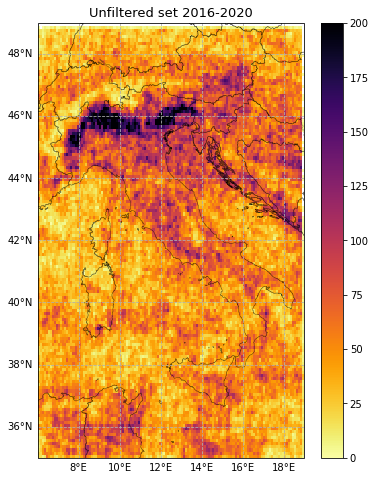

In [51]:
fig, ax = plt.subplots(1, 1, figsize=(6,8), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid.plot(column='N_OT', ax=ax, cmap='inferno_r', kind='geo', vmin=0, vmax=200, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Unfiltered set 2016-2020', fontsize=13);

#pl.savefig(plt_fold + f"/N_OTs_10km_2019-2020_UNFILT_inferno.pdf",dpi=200, bbox_inches='tight')

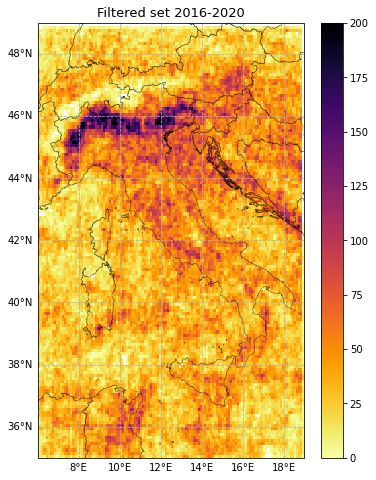

In [50]:
fig, ax = plt.subplots(1, 1, figsize=(6,8), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid.plot(column='N_OT', ax=ax, cmap='inferno_r', kind='geo', vmin=0, vmax=200, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Filtered set 2016-2020', fontsize=13);

#pl.savefig(plt_fold + f"/N_OTs_10km_2016-2020_FILT_inferno.pdf",dpi=200, bbox_inches='tight')

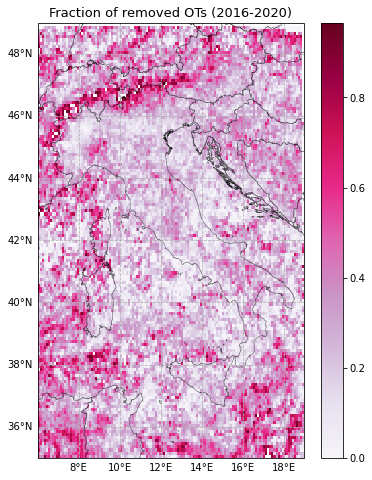

In [54]:
fig, ax = plt.subplots(1, 1, figsize=(6,8), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid.plot(column='perc_OT', ax=ax, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Fraction of removed OTs (2016-2020)', fontsize=13);

#pl.savefig(plt_fold + f"/percOTs_10km_2016-2020_fullFILT.pdf",dpi=200, bbox_inches='tight')

### 3.1.2) Yearly spatial distributions (Inter-annual variability)

In [16]:
#divide N OTs per year
pointInPolys_allOT_2016 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2016]
pointInPolys_allOT_2017 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2017]
pointInPolys_allOT_2018 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2018]
pointInPolys_allOT_2019 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2019]
pointInPolys_allOT_2020 = pointInPolys_allOT[pointInPolys_allOT['time'].dt.year == 2020]

pointInPolys_filtOT_2016 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2016]
pointInPolys_filtOT_2017 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2017]
pointInPolys_filtOT_2018 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2018]
pointInPolys_filtOT_2019 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2019]
pointInPolys_filtOT_2020 = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.year == 2020]

#sum points in each grid cell
pointSumByPoly_allOT_2016 = pointInPolys_allOT_2016.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_2017 = pointInPolys_allOT_2017.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_2018 = pointInPolys_allOT_2018.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_2019 = pointInPolys_allOT_2019.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_2020 = pointInPolys_allOT_2020.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_filtOT_2016 = pointInPolys_filtOT_2016.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_2017 = pointInPolys_filtOT_2017.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_2018 = pointInPolys_filtOT_2018.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_2019 = pointInPolys_filtOT_2019.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_2020 = pointInPolys_filtOT_2020.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
allOT_countOnGrid_2016 = sfg_sp.copy()
allOT_countOnGrid_2017 = sfg_sp.copy()
allOT_countOnGrid_2018 = sfg_sp.copy()
allOT_countOnGrid_2019 = sfg_sp.copy()
allOT_countOnGrid_2020 = sfg_sp.copy()

filtOT_countOnGrid_2016 = sfg_sp.copy()
filtOT_countOnGrid_2017 = sfg_sp.copy()
filtOT_countOnGrid_2018 = sfg_sp.copy()
filtOT_countOnGrid_2019 = sfg_sp.copy()
filtOT_countOnGrid_2020 = sfg_sp.copy()

allOT_countOnGrid_2016['N_OT'] = pointSumByPoly_allOT_2016['sum']
allOT_countOnGrid_2017['N_OT'] = pointSumByPoly_allOT_2017['sum']
allOT_countOnGrid_2018['N_OT'] = pointSumByPoly_allOT_2018['sum']
allOT_countOnGrid_2019['N_OT'] = pointSumByPoly_allOT_2019['sum']
allOT_countOnGrid_2020['N_OT'] = pointSumByPoly_allOT_2020['sum']

filtOT_countOnGrid_2016['N_OT'] = pointSumByPoly_filtOT_2016['sum']
filtOT_countOnGrid_2017['N_OT'] = pointSumByPoly_filtOT_2017['sum']
filtOT_countOnGrid_2018['N_OT'] = pointSumByPoly_filtOT_2018['sum']
filtOT_countOnGrid_2019['N_OT'] = pointSumByPoly_filtOT_2019['sum']
filtOT_countOnGrid_2020['N_OT'] = pointSumByPoly_filtOT_2020['sum']

#Calc percentage of filtered OTs per box
perc_filtOT_countOnGrid_2016 = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_2016['FID'] = allOT_countOnGrid_2016['FID']
perc_filtOT_countOnGrid_2016['geometry'] = allOT_countOnGrid_2016['geometry']
perc_filtOT_countOnGrid_2016['perc_OT'] = 1 - (filtOT_countOnGrid_2016['N_OT']/allOT_countOnGrid_2016['N_OT'])

perc_filtOT_countOnGrid_2017 = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_2017['FID'] = allOT_countOnGrid_2017['FID']
perc_filtOT_countOnGrid_2017['geometry'] = allOT_countOnGrid_2017['geometry']
perc_filtOT_countOnGrid_2017['perc_OT'] = 1 - (filtOT_countOnGrid_2017['N_OT']/allOT_countOnGrid_2017['N_OT'])

perc_filtOT_countOnGrid_2018 = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_2018['FID'] = allOT_countOnGrid_2018['FID']
perc_filtOT_countOnGrid_2018['geometry'] = allOT_countOnGrid_2018['geometry']
perc_filtOT_countOnGrid_2018['perc_OT'] = 1 - (filtOT_countOnGrid_2018['N_OT']/allOT_countOnGrid_2018['N_OT'])

perc_filtOT_countOnGrid_2019 = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_2019['FID'] = allOT_countOnGrid_2019['FID']
perc_filtOT_countOnGrid_2019['geometry'] = allOT_countOnGrid_2019['geometry']
perc_filtOT_countOnGrid_2019['perc_OT'] = 1 - (filtOT_countOnGrid_2019['N_OT']/allOT_countOnGrid_2019['N_OT'])

perc_filtOT_countOnGrid_2020 = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_2020['FID'] = allOT_countOnGrid_2020['FID']
perc_filtOT_countOnGrid_2020['geometry'] = allOT_countOnGrid_2020['geometry']
perc_filtOT_countOnGrid_2020['perc_OT'] = 1 - (filtOT_countOnGrid_2020['N_OT']/allOT_countOnGrid_2020['N_OT'])

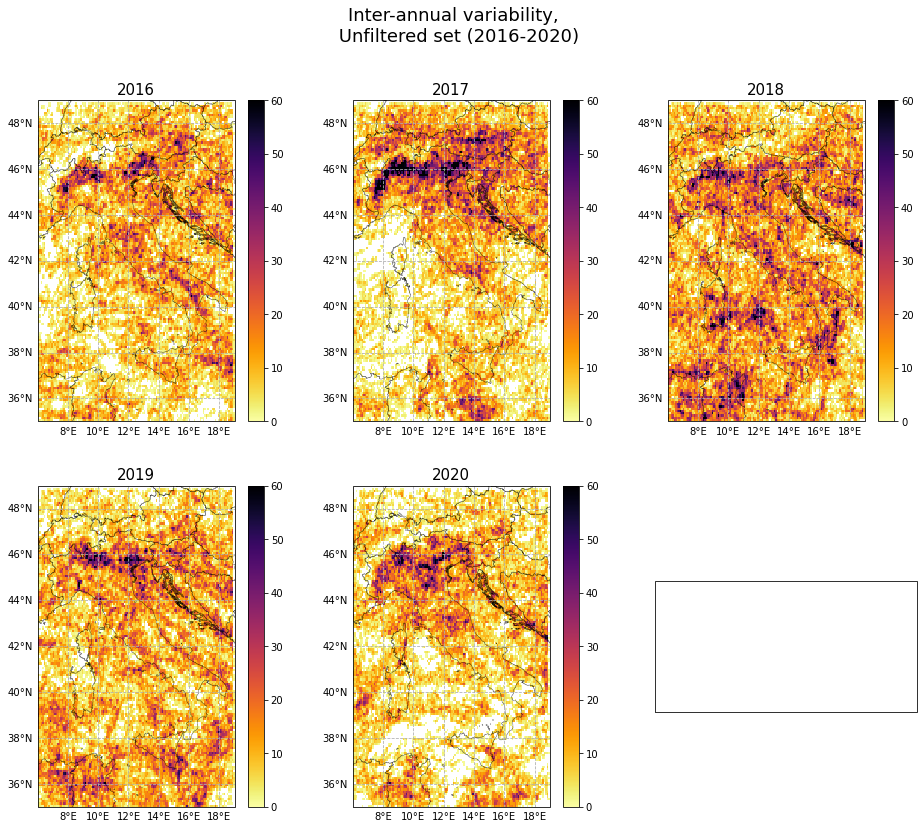

In [64]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16,13), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid_2016.plot(column='N_OT', ax=ax1, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('2016', fontsize=15);

allOT_countOnGrid_2017.plot(column='N_OT', ax=ax2, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('2017', fontsize=15);

allOT_countOnGrid_2018.plot(column='N_OT', ax=ax3, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('2018', fontsize=15);

allOT_countOnGrid_2019.plot(column='N_OT', ax=ax4, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('2019', fontsize=15);

allOT_countOnGrid_2020.plot(column='N_OT', ax=ax5, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('2020', fontsize=15);

fig.suptitle('Inter-annual variability, \n Unfiltered set (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/Inter-annualVar_N_OTs_10km_UNFILT_2016-2020_inferno.pdf",dpi=200, bbox_inches='tight')

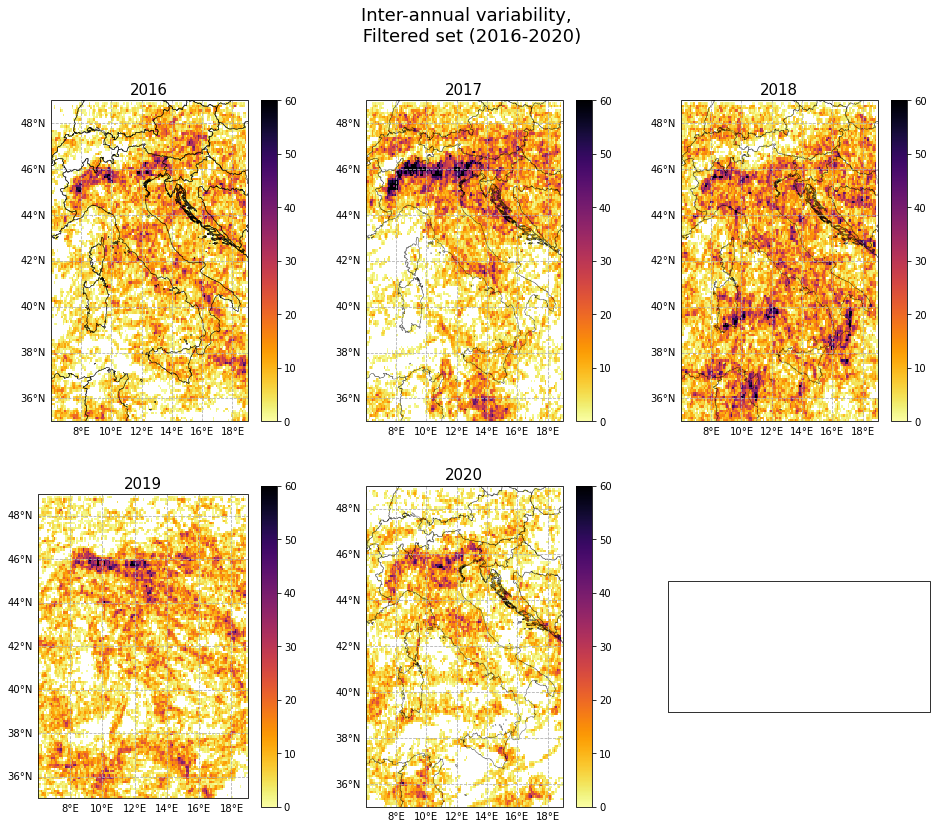

In [69]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16,13), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid_2016.plot(column='N_OT', ax=ax1, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('2016', fontsize=15);

filtOT_countOnGrid_2017.plot(column='N_OT', ax=ax2, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('2017', fontsize=15);

filtOT_countOnGrid_2018.plot(column='N_OT', ax=ax3, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('2018', fontsize=15);

filtOT_countOnGrid_2019.plot(column='N_OT', ax=ax4, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('2019', fontsize=15);

filtOT_countOnGrid_2020.plot(column='N_OT', ax=ax5, cmap='inferno_r', kind='geo', vmin=0, vmax=60, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('2020', fontsize=15);

fig.suptitle('Inter-annual variability, \n Filtered set (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/Inter-annualVar_N_OTs_10km_FILT_2016-2020_inferno.jpg",dpi=150, bbox_inches='tight')

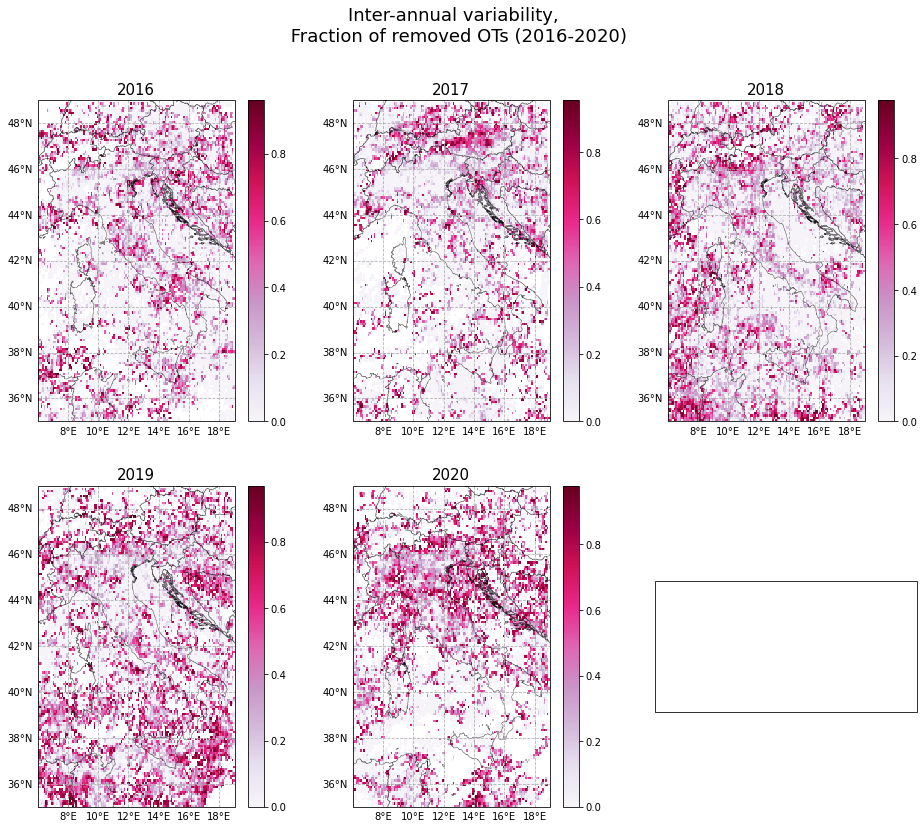

In [71]:
fig, ((ax1, ax2, ax3), (ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(16,13), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_2016.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('2016', fontsize=15);

perc_filtOT_countOnGrid_2017.plot(column='perc_OT', ax=ax2, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('2017', fontsize=15);

perc_filtOT_countOnGrid_2018.plot(column='perc_OT', ax=ax3, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('2018', fontsize=15);

perc_filtOT_countOnGrid_2019.plot(column='perc_OT', ax=ax4, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('2019', fontsize=15);

perc_filtOT_countOnGrid_2020.plot(column='perc_OT', ax=ax5, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('2020', fontsize=15);

fig.suptitle('Inter-annual variability, \n Fraction of removed OTs (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/Inter-annualVar_percOTs_10km_fullFILT_2019-2020_inferno.pdf",dpi=150, bbox_inches='tight')

### 3.1.3) Monthly spatial distributions (Intra-annual variability)

In [ ]:
#divide N OTs per MONTH
pointInPolys_allOT_Apr = pointInPolys_allOT[pointInPolys_allOT['time'].dt.month == 4]
pointInPolys_allOT_May = pointInPolys_allOT[pointInPolys_allOT['time'].dt.month == 5]
pointInPolys_allOT_Jun = pointInPolys_allOT[pointInPolys_allOT['time'].dt.month == 6]
pointInPolys_allOT_Jul = pointInPolys_allOT[pointInPolys_allOT['time'].dt.month == 7]
pointInPolys_allOT_Aug = pointInPolys_allOT[pointInPolys_allOT['time'].dt.month == 8]
pointInPolys_allOT_Sep = pointInPolys_allOT[pointInPolys_allOT['time'].dt.month == 9]
pointInPolys_allOT_Oct = pointInPolys_allOT[pointInPolys_allOT['time'].dt.month == 10]

pointInPolys_filtOT_Apr = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.month == 4]
pointInPolys_filtOT_May = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.month == 5]
pointInPolys_filtOT_Jun = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.month == 6]
pointInPolys_filtOT_Jul = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.month == 7]
pointInPolys_filtOT_Aug = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.month == 8]
pointInPolys_filtOT_Sep = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.month == 9]
pointInPolys_filtOT_Oct = pointInPolys_filtOT[pointInPolys_filtOT['time'].dt.month == 10]

#sum points in each grid cell
pointSumByPoly_allOT_Apr = pointInPolys_allOT_Apr.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_May = pointInPolys_allOT_May.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Jun = pointInPolys_allOT_Jun.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Jul = pointInPolys_allOT_Jul.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Aug = pointInPolys_allOT_Aug.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Sep = pointInPolys_allOT_Sep.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_Oct = pointInPolys_allOT_Oct.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_filtOT_Apr = pointInPolys_filtOT_Apr.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_May = pointInPolys_filtOT_May.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Jun = pointInPolys_filtOT_Jun.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Jul = pointInPolys_filtOT_Jul.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Aug = pointInPolys_filtOT_Aug.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Sep = pointInPolys_filtOT_Sep.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_Oct = pointInPolys_filtOT_Oct.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
allOT_countOnGrid_Apr = sfg_sp.copy()
allOT_countOnGrid_May = sfg_sp.copy()
allOT_countOnGrid_Jun = sfg_sp.copy()
allOT_countOnGrid_Jul = sfg_sp.copy()
allOT_countOnGrid_Aug = sfg_sp.copy()
allOT_countOnGrid_Sep = sfg_sp.copy()
allOT_countOnGrid_Oct = sfg_sp.copy()

filtOT_countOnGrid_Apr = sfg_sp.copy()
filtOT_countOnGrid_May = sfg_sp.copy()
filtOT_countOnGrid_Jun = sfg_sp.copy()
filtOT_countOnGrid_Jul = sfg_sp.copy()
filtOT_countOnGrid_Aug = sfg_sp.copy()
filtOT_countOnGrid_Sep = sfg_sp.copy()
filtOT_countOnGrid_Oct = sfg_sp.copy()

allOT_countOnGrid_Apr['N_OT'] = pointSumByPoly_allOT_Apr['sum']
allOT_countOnGrid_May['N_OT'] = pointSumByPoly_allOT_May['sum']
allOT_countOnGrid_Jun['N_OT'] = pointSumByPoly_allOT_Jun['sum']
allOT_countOnGrid_Jul['N_OT'] = pointSumByPoly_allOT_Jul['sum']
allOT_countOnGrid_Aug['N_OT'] = pointSumByPoly_allOT_Aug['sum']
allOT_countOnGrid_Sep['N_OT'] = pointSumByPoly_allOT_Sep['sum']
allOT_countOnGrid_Oct['N_OT'] = pointSumByPoly_allOT_Oct['sum']

filtOT_countOnGrid_Apr['N_OT'] = pointSumByPoly_filtOT_Apr['sum']
filtOT_countOnGrid_May['N_OT'] = pointSumByPoly_filtOT_May['sum']
filtOT_countOnGrid_Jun['N_OT'] = pointSumByPoly_filtOT_Jun['sum']
filtOT_countOnGrid_Jul['N_OT'] = pointSumByPoly_filtOT_Jul['sum']
filtOT_countOnGrid_Aug['N_OT'] = pointSumByPoly_filtOT_Aug['sum']
filtOT_countOnGrid_Sep['N_OT'] = pointSumByPoly_filtOT_Sep['sum']
filtOT_countOnGrid_Oct['N_OT'] = pointSumByPoly_filtOT_Oct['sum']

#Calc percentage of filtered OTs per box
perc_filtOT_countOnGrid_Apr = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_Apr['FID'] = allOT_countOnGrid_Apr['FID']
perc_filtOT_countOnGrid_Apr['geometry'] = allOT_countOnGrid_Apr['geometry']
perc_filtOT_countOnGrid_Apr['perc_OT'] = 1 - (filtOT_countOnGrid_Apr['N_OT']/allOT_countOnGrid_Apr['N_OT'])

perc_filtOT_countOnGrid_May = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_May['FID'] = allOT_countOnGrid_May['FID']
perc_filtOT_countOnGrid_May['geometry'] = allOT_countOnGrid_May['geometry']
perc_filtOT_countOnGrid_May['perc_OT'] = 1 - (filtOT_countOnGrid_May['N_OT']/allOT_countOnGrid_May['N_OT'])

perc_filtOT_countOnGrid_Jun = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_Jun['FID'] = allOT_countOnGrid_Jun['FID']
perc_filtOT_countOnGrid_Jun['geometry'] = allOT_countOnGrid_Jun['geometry']
perc_filtOT_countOnGrid_Jun['perc_OT'] = 1 - (filtOT_countOnGrid_Jun['N_OT']/allOT_countOnGrid_Jun['N_OT'])

perc_filtOT_countOnGrid_Jul = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_Jul['FID'] = allOT_countOnGrid_Jul['FID']
perc_filtOT_countOnGrid_Jul['geometry'] = allOT_countOnGrid_Jul['geometry']
perc_filtOT_countOnGrid_Jul['perc_OT'] = 1 - (filtOT_countOnGrid_Jul['N_OT']/allOT_countOnGrid_Jul['N_OT'])

perc_filtOT_countOnGrid_Aug = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_Aug['FID'] = allOT_countOnGrid_Aug['FID']
perc_filtOT_countOnGrid_Aug['geometry'] = allOT_countOnGrid_Aug['geometry']
perc_filtOT_countOnGrid_Aug['perc_OT'] = 1 - (filtOT_countOnGrid_Aug['N_OT']/allOT_countOnGrid_Aug['N_OT'])

perc_filtOT_countOnGrid_Sep = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_Sep['FID'] = allOT_countOnGrid_Sep['FID']
perc_filtOT_countOnGrid_Sep['geometry'] = allOT_countOnGrid_Sep['geometry']
perc_filtOT_countOnGrid_Sep['perc_OT'] = 1 - (filtOT_countOnGrid_Sep['N_OT']/allOT_countOnGrid_Sep['N_OT'])

perc_filtOT_countOnGrid_Oct = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_Oct['FID'] = allOT_countOnGrid_Oct['FID']
perc_filtOT_countOnGrid_Oct['geometry'] = allOT_countOnGrid_Oct['geometry']
perc_filtOT_countOnGrid_Oct['perc_OT'] = 1 - (filtOT_countOnGrid_Oct['N_OT']/allOT_countOnGrid_Oct['N_OT'])

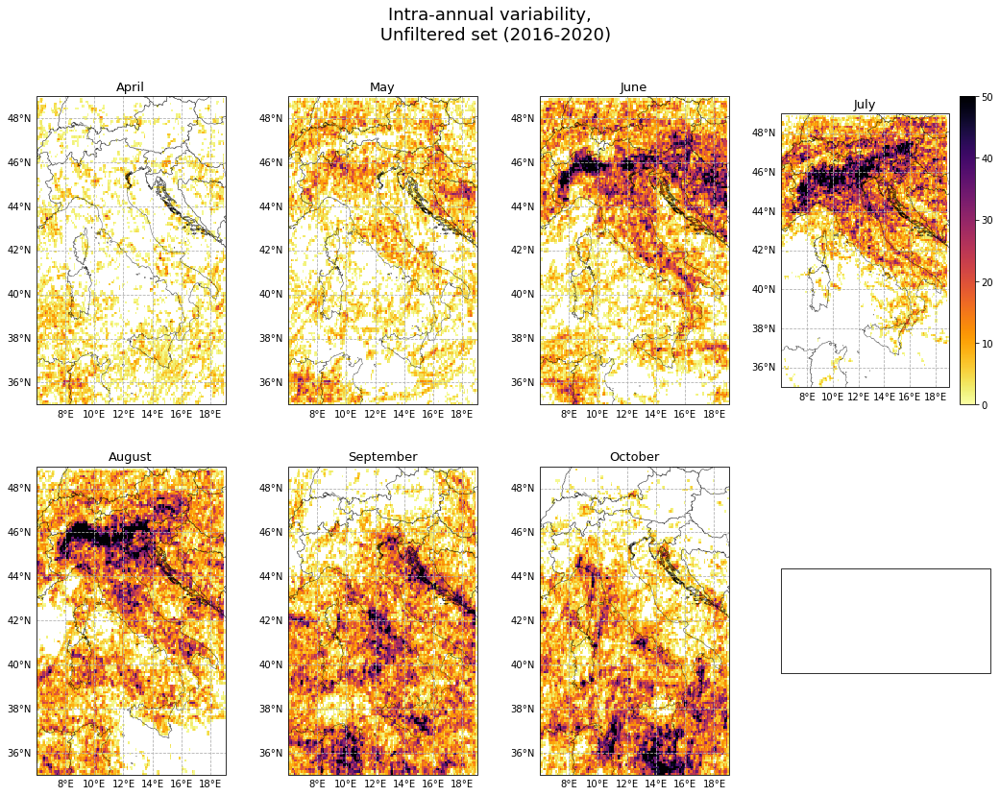

In [22]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(18,13), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid_Apr.plot(column='N_OT', ax=ax1, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('April', fontsize=13);

allOT_countOnGrid_May.plot(column='N_OT', ax=ax2, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('May', fontsize=13);

allOT_countOnGrid_Jun.plot(column='N_OT', ax=ax3, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('June', fontsize=13);

allOT_countOnGrid_Jul.plot(column='N_OT', ax=ax4, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('July', fontsize=13);

allOT_countOnGrid_Aug.plot(column='N_OT', ax=ax5, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('August', fontsize=13);

allOT_countOnGrid_Sep.plot(column='N_OT', ax=ax6, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
ax6.set_title('September', fontsize=13);

allOT_countOnGrid_Oct.plot(column='N_OT', ax=ax7, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax7, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax7.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax7.set_xlim(x_lim)
ax7.set_ylim(y_lim)
ax7.set_title('October', fontsize=13);

fig.suptitle('Intra-annual variability, \n Unfiltered set (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/Intra-annualVar_N_OTs_10km_UNFILT_2016-2020_inferno.jpg",dpi=150, bbox_inches='tight')

In [ ]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(18,13), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid_Apr.plot(column='N_OT', ax=ax1, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1)#, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('April', fontsize=13);

filtOT_countOnGrid_May.plot(column='N_OT', ax=ax2, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1)#, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('May', fontsize=13);

filtOT_countOnGrid_Jun.plot(column='N_OT', ax=ax3, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1)#, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('June', fontsize=13);

filtOT_countOnGrid_Jul.plot(column='N_OT', ax=ax4, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('July', fontsize=13);

filtOT_countOnGrid_Aug.plot(column='N_OT', ax=ax5, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1)#, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('August', fontsize=13);

filtOT_countOnGrid_Sep.plot(column='N_OT', ax=ax6, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1)#, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
ax6.set_title('September', fontsize=13);

filtOT_countOnGrid_Oct.plot(column='N_OT', ax=ax7, cmap='inferno_r', kind='geo', vmin=0, vmax=50, zorder=1)#, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax7, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax7.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax7.set_xlim(x_lim)
ax7.set_ylim(y_lim)
ax7.set_title('October', fontsize=13);

fig.suptitle('Intra-annual variability, \n Filtered set (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/Intra-annualVar_N_OTs_10km_FILTERED_2016-2020_inferno.pdf",dpi=150, bbox_inches='tight')

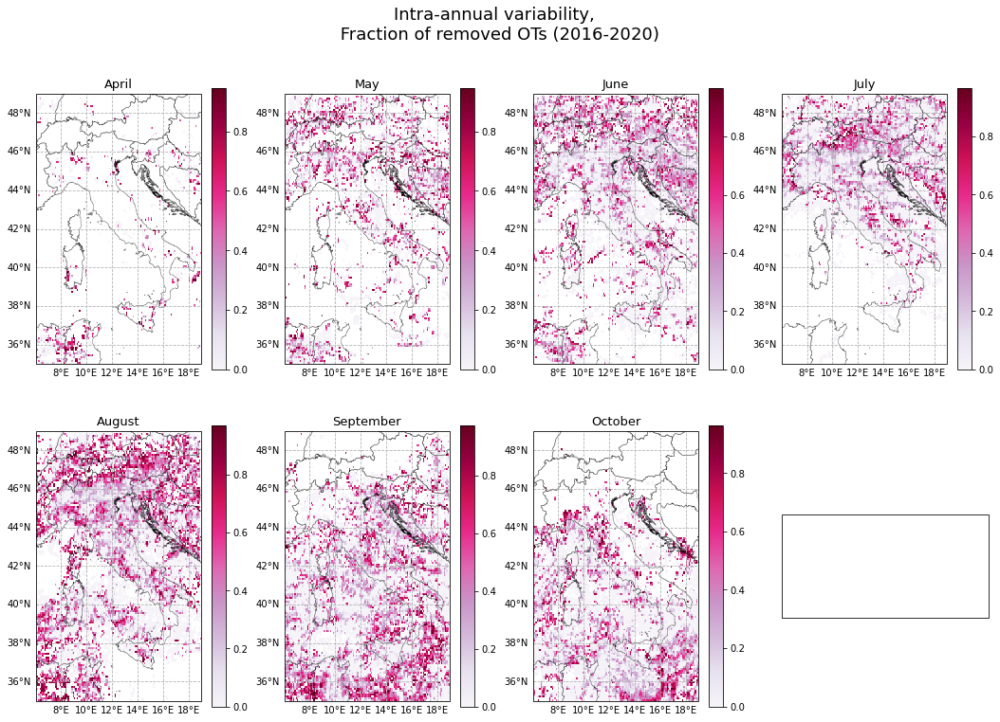

In [25]:
fig, ((ax1, ax2, ax3, ax4), (ax5, ax6, ax7, ax8)) = plt.subplots(2, 4, figsize=(18,12), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_Apr.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('April', fontsize=13);

perc_filtOT_countOnGrid_May.plot(column='perc_OT', ax=ax2, cmap='PuRd', kind='geo',zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('May', fontsize=13);

perc_filtOT_countOnGrid_Jun.plot(column='perc_OT', ax=ax3, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax3, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax3.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax3.set_xlim(x_lim)
ax3.set_ylim(y_lim)
ax3.set_title('June', fontsize=13);

perc_filtOT_countOnGrid_Jul.plot(column='perc_OT', ax=ax4, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax4, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax4.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax4.set_xlim(x_lim)
ax4.set_ylim(y_lim)
ax4.set_title('July', fontsize=13);

perc_filtOT_countOnGrid_Aug.plot(column='perc_OT', ax=ax5, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax5, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax5.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax5.set_xlim(x_lim)
ax5.set_ylim(y_lim)
ax5.set_title('August', fontsize=13);

perc_filtOT_countOnGrid_Sep.plot(column='perc_OT', ax=ax6, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax6, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax6.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax6.set_xlim(x_lim)
ax6.set_ylim(y_lim)
ax6.set_title('September', fontsize=13);

perc_filtOT_countOnGrid_Oct.plot(column='perc_OT', ax=ax7, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax7, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax7.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax7.set_xlim(x_lim)
ax7.set_ylim(y_lim)
ax7.set_title('October', fontsize=13);

fig.suptitle('Intra-annual variability, \n Fraction of removed OTs (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/Intra-annualVar_percOTs_10km_fullFILT_2016-2020.pdf",dpi=100, bbox_inches='tight')

### 3.1.4) Day-night separation

In [10]:
day_all_OTset_2016_2020 = all_OTset_2016_2020[(all_OTset_2016_2020['time'].dt.hour >= 8) &
                                                       (all_OTset_2016_2020['time'].dt.hour < 20)]
night_all_OTset_2016_2020 = pd.concat([all_OTset_2016_2020[(all_OTset_2016_2020['time'].dt.hour < 8)],
                                           all_OTset_2016_2020[(all_OTset_2016_2020['time'].dt.hour >=20)]])

day_filt_OTset_2016_2020 = filt_OTset_2016_2020_FULL[(filt_OTset_2016_2020_FULL['time'].dt.hour >= 8) &
                                                       (filt_OTset_2016_2020_FULL['time'].dt.hour < 20)]
night_filt_OTset_2016_2020 = pd.concat([filt_OTset_2016_2020_FULL[(filt_OTset_2016_2020_FULL['time'].dt.hour < 8)],
                                           filt_OTset_2016_2020_FULL[(filt_OTset_2016_2020_FULL['time'].dt.hour >=20)]])

In [ ]:
#Calculate N OTs on 10km grid per month:
points_allOT_day = day_all_OTset_2016_2020
points_allOT_night = night_all_OTset_2016_2020

points_filtOT_day = day_filt_OTset_2016_2020
points_filtOT_night = night_filt_OTset_2016_2020

#spatial join between points and grid
pointInPolys_allOT_day = sjoin(points_allOT_day, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_allOT_night = sjoin(points_allOT_night, grid, how='left').drop(['index_right'],axis=1)

pointInPolys_filtOT_day = sjoin(points_filtOT_day, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_night = sjoin(points_filtOT_night, grid, how='left').drop(['index_right'],axis=1)

#sum points in each grid cell
pointSumByPoly_allOT_day = pointInPolys_allOT_day.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_allOT_night = pointInPolys_allOT_night.groupby('FID')['N_OT'].agg(['sum'])

pointSumByPoly_filtOT_day = pointInPolys_filtOT_day.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_night = pointInPolys_filtOT_night.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
allOT_countOnGrid_day = sfg_sp.copy()
allOT_countOnGrid_night= sfg_sp.copy()

filtOT_countOnGrid_day = sfg_sp.copy()
filtOT_countOnGrid_night = sfg_sp.copy()

allOT_countOnGrid_day['N_OT'] = pointSumByPoly_allOT_day['sum']
allOT_countOnGrid_night['N_OT'] = pointSumByPoly_allOT_night['sum']

filtOT_countOnGrid_day['N_OT'] = pointSumByPoly_filtOT_day['sum']
filtOT_countOnGrid_night['N_OT'] = pointSumByPoly_filtOT_night['sum']

#Calc percentage of filtered OTs per box
perc_filtOT_countOnGrid_day = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_day['FID'] = allOT_countOnGrid_day['FID']
perc_filtOT_countOnGrid_day['geometry'] = allOT_countOnGrid_day['geometry']
perc_filtOT_countOnGrid_day['perc_OT'] = 1 - (filtOT_countOnGrid_day['N_OT']/allOT_countOnGrid_day['N_OT'])

perc_filtOT_countOnGrid_night = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_night['FID'] = allOT_countOnGrid_night['FID']
perc_filtOT_countOnGrid_night['geometry'] = allOT_countOnGrid_night['geometry']
perc_filtOT_countOnGrid_night['perc_OT'] = 1 - (filtOT_countOnGrid_night['N_OT']/allOT_countOnGrid_night['N_OT'])

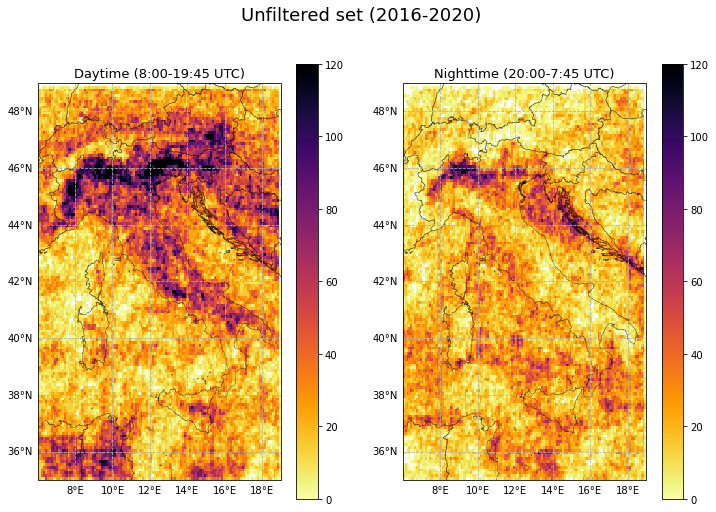

In [39]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12,8), subplot_kw={'projection': ccrs.PlateCarree()})

allOT_countOnGrid_day.plot(column='N_OT', ax=ax1, cmap='inferno_r', kind='geo', vmin=0, vmax=120, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Daytime (8:00-19:45 UTC)', fontsize=13);

allOT_countOnGrid_night.plot(column='N_OT', ax=ax2, cmap='inferno_r', kind='geo', vmin=0, vmax=120, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Nighttime (20:00-7:45 UTC)', fontsize=13);

fig.suptitle('Unfiltered set (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/DayNight_N_OTs_UNFILT_2016-2020.pdf",dpi=150, bbox_inches='tight')

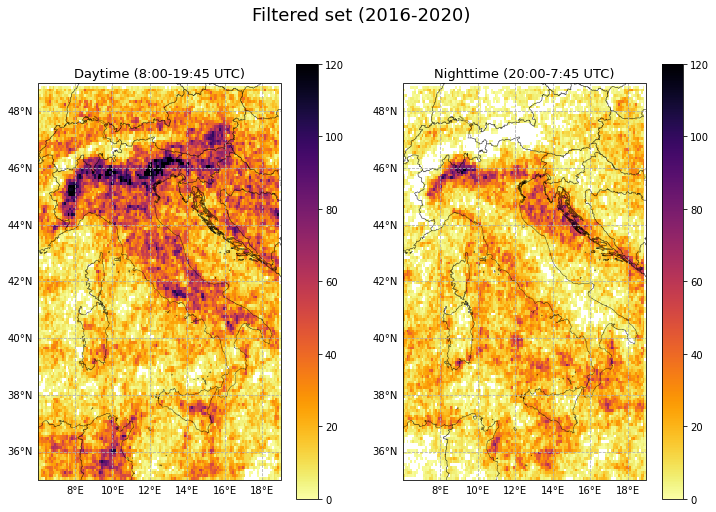

In [42]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12,8), subplot_kw={'projection': ccrs.PlateCarree()})

filtOT_countOnGrid_day.plot(column='N_OT', ax=ax1, cmap='inferno_r', kind='geo', vmin=0, vmax=120, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Daytime (8:00-19:45 UTC)', fontsize=13);

filtOT_countOnGrid_night.plot(column='N_OT', ax=ax2, cmap='inferno_r', kind='geo', vmin=0, vmax=120, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Nighttime (20:00-7:45 UTC)', fontsize=13);

fig.suptitle('Filtered set (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/DayNight_N_OTs_FILT_2016-2020.pdf",dpi=150, bbox_inches='tight')

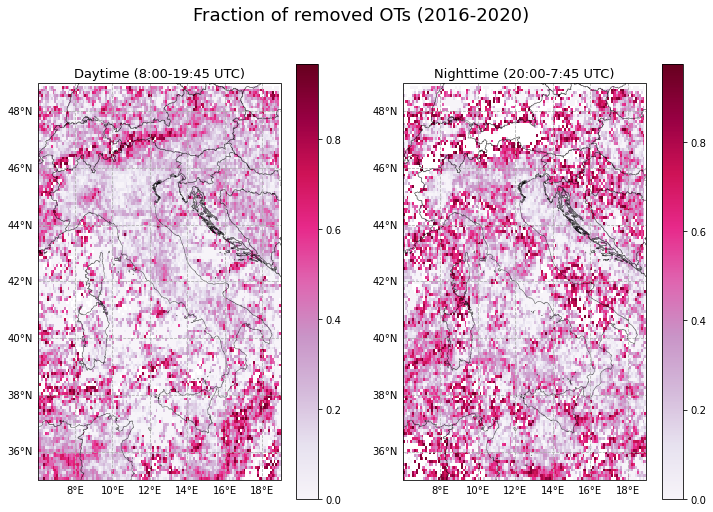

In [44]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12,8), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_day.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Daytime (8:00-19:45 UTC)', fontsize=13);

perc_filtOT_countOnGrid_night.plot(column='perc_OT', ax=ax2, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Nighttime (20:00-7:45 UTC)', fontsize=13);

fig.suptitle('Fraction of removed OTs (2016-2020)', fontsize=18);

#pl.savefig(plt_fold + f"/DayNight_percOTs_fullFILT_2016-2020.pdf",dpi=150, bbox_inches='tight')

### 3.1.4) Land-sea separation

In [10]:
#all_OTset_2016_2020 = all_OTset_2016_2020.reset_index(drop=True)
filt_OTset_2016_2020_FULL = filt_OTset_2016_2020_FULL.reset_index(drop=True)

In [11]:
#SELECT ONLY OTs OVER LAND
all_OTset_2016_2020_land = gpd.clip(all_OTset_2016_2020, sfg_land).sort_index()
filt_OTset_2016_2020_FULL_land = gpd.clip(filt_OTset_2016_2020_FULL, sfg_land).sort_index()

In [12]:
#SELECT ONLY OTs OVER SEA
all_OTset_2016_2020_sea = all_OTset_2016_2020.drop(index=all_OTset_2016_2020_land.index)
filt_OTset_2016_2020_FULL_sea = filt_OTset_2016_2020_FULL.drop(index=filt_OTset_2016_2020_FULL_land.index)

In [21]:
all_OTset_2016_2020

,lon,lat,time,otpmax,geometry,dtmin,irbmin
0,14.088715,45.876858,2016-04-01 19:00:00+00:00,0.65,POINT (14.08871 45.87686),-0.369995,208.699997
1,14.088715,45.841145,2016-04-01 19:00:00+00:00,0.65,POINT (14.08871 45.84114),-0.360001,208.699997
2,12.072000,42.004002,2016-04-01 19:00:00+00:00,0.62,POINT (12.07200 42.00400),-0.059998,209.330002
3,11.929143,41.968288,2016-04-01 19:00:00+00:00,0.62,POINT (11.92914 41.96829),-0.080002,209.389999
4,12.000571,41.967285,2016-04-01 19:00:00+00:00,0.62,POINT (12.00057 41.96729),-0.610001,208.819992
...,...,...,...,...,...,...,...
991037,17.981571,42.692570,2020-09-29 00:00:00+00:00,0.62,POINT (17.98157 42.69257),-2.610001,220.659988
991038,18.017284,42.692570,2020-09-29 00:00:00+00:00,0.62,POINT (18.01728 42.69257),-2.610001,220.649994
991039,18.162144,42.696571,2020-09-29 00:00:00+00:00,0.50,POINT (18.16214 42.69657),-1.639999,221.599991
991040,18.199856,42.699570,2020-09-29 00:00:00+00:00,0.50,POINT (18.19986 42.69957),-1.100006,222.129990


In [14]:
#add columns of 1s to be summed in the spatial join with grid:
#all_OTset_2016_2020['N_OT'] = 1
filt_OTset_2016_2020_FULL['N_OT'] = 1

#all_OTset_2016_2020_land['N_OT'] = 1
filt_OTset_2016_2020_FULL_land['N_OT'] = 1

#all_OTset_2016_2020_sea['N_OT'] = 1
filt_OTset_2016_2020_FULL_sea['N_OT'] = 1

#sum the hourly number of OTs for each dataset:
#hsum_all_OTs_2016_2020 = all_OTset_2016_2020.groupby(by=all_OTset_2016_2020.time.dt.hour).N_OT.sum()
#hsum_all_OTs_2016_2020_land = all_OTset_2016_2020_land.groupby(by=all_OTset_2016_2020_land.time.dt.hour).N_OT.sum()
#hsum_all_OTs_2016_2020_sea = all_OTset_2016_2020_sea.groupby(by=all_OTset_2016_2020_sea.time.dt.hour).N_OT.sum()

#hsum_filt_OTs_2016_2020 = filt_OTset_2016_2020_FULL.groupby(by=filt_OTset_2016_2020_FULL.time.dt.hour).N_OT.sum()
hsum_filt_OTs_2016_2020_land = filt_OTset_2016_2020_FULL_land.groupby(by=filt_OTset_2016_2020_FULL_land.time.dt.hour).N_OT.sum()
hsum_filt_OTs_2016_2020_sea = filt_OTset_2016_2020_FULL_sea.groupby(by=filt_OTset_2016_2020_FULL_sea.time.dt.hour).N_OT.sum()

In [25]:
#calculate the hourly fraction over the whole day of land/sea OTs:
land_dhfrac_all_OTs_2016_2020 = hsum_all_OTs_2016_2020_land/sum(hsum_all_OTs_2016_2020)
sea_dhfrac_all_OTs_2016_2020 = hsum_all_OTs_2016_2020_sea/sum(hsum_all_OTs_2016_2020)

land_dhfrac_filt_OTs_2016_2020 = hsum_filt_OTs_2016_2020_land/sum(hsum_filt_OTs_2016_2020)
sea_dhfrac_filt_OTs_2016_2020 = hsum_filt_OTs_2016_2020_sea/sum(hsum_filt_OTs_2016_2020)

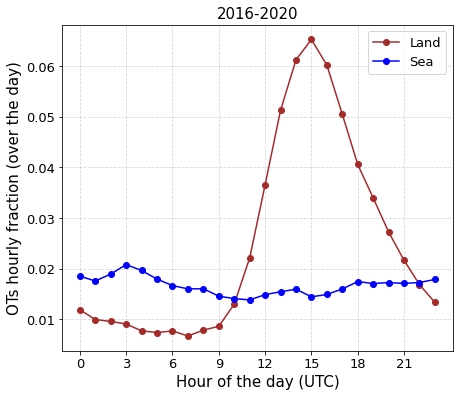

In [26]:
fig, ax = plt.subplots(figsize = (7,6))

ax.plot(land_dhfrac_filt_OTs_2016_2020, marker='o', #fillstyle='none', 
        color='brown', label='Land')
ax.plot(sea_dhfrac_filt_OTs_2016_2020, marker='o', #fillstyle='none',
        color='blue', label='Sea')

ax.set_xticks(np.arange(0, 24, 3))
ax.set_xlabel('Hour of the day (UTC)', fontsize=15)
ax.set_ylabel('OTs hourly fraction (over the day)', fontsize=15)
ax.tick_params(axis='both', which='major', labelsize=13)
plt.grid(ls='--', alpha=0.5)
plt.legend(loc='best', fontsize=13)
plt.title('2016-2020', fontsize=15)

#pl.savefig(plt_fold + f"/land-sea_OTs_filt-nonfilt_dh_2016-2020.pdf",dpi=120, bbox_inches='tight')

### 3.1.5) Histograms of hourly and monthly distributions, also with land-sea separation

#### - Hourly distributions

In [27]:
#Group by hour datasets and calculated fraction of OTs for every hour:
hourSum_nOT_all = all_OTset_2016_2020.groupby(all_OTset_2016_2020['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_fullFilt = filt_OTset_2016_2020_FULL.groupby(filt_OTset_2016_2020_FULL['time'].dt.hour)['N_OT'].agg(['sum'])

#Fraction of OT filtered by each dataset for every hour
perc_filtOT_hour_fullFilt = 1 - (hourSum_nOT_fullFilt['sum']/hourSum_nOT_all['sum'])

In [28]:
filt_OTset_2016_2020_FULL_land

,lon,lat,time,otpmax,geometry,dtmin,irbmin,N_OT
3,7.207142,35.429855,2016-04-06 12:00:00+00:00,0.71,POINT (7.20714 35.42986),-0.339996,215.699997,1
4,6.708143,35.391144,2016-04-06 12:00:00+00:00,0.59,POINT (6.70814 35.39114),-2.029999,214.699997,1
5,6.744858,35.393143,2016-04-06 12:00:00+00:00,0.59,POINT (6.74486 35.39314),-1.240005,215.449997,1
6,6.709143,35.356426,2016-04-06 12:00:00+00:00,0.59,POINT (6.70914 35.35643),-1.710007,215.119995,1
7,6.744858,35.356426,2016-04-06 12:00:00+00:00,0.65,POINT (6.74486 35.35643),-1.559998,215.229996,1
...,...,...,...,...,...,...,...,...
723134,18.198856,42.734287,2020-09-29 00:00:00+00:00,0.50,POINT (18.19886 42.73429),-1.339996,221.860001,1
723135,18.236572,42.736286,2020-09-29 00:00:00+00:00,0.50,POINT (18.23657 42.73629),-0.830002,222.360001,1
723139,18.162144,42.696571,2020-09-29 00:00:00+00:00,0.50,POINT (18.16214 42.69657),-1.639999,221.599991,1
723140,18.199856,42.699570,2020-09-29 00:00:00+00:00,0.50,POINT (18.19986 42.69957),-1.100006,222.129990,1


In [29]:
#ONLY OVER LAND

#Group by hour datasets and calculated fraction of OTs for every hour:
hourSum_nOT_all_land = all_OTset_2016_2020_land.groupby(all_OTset_2016_2020_land['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_fullFilt_land = filt_OTset_2016_2020_FULL_land.groupby(filt_OTset_2016_2020_FULL_land['time'].dt.hour)['N_OT'].agg(['sum'])

#Fraction of OT filtered by each dataset for every hour
perc_filtOT_hour_fullFilt_land = 1 - (hourSum_nOT_fullFilt_land['sum']/hourSum_nOT_all_land['sum'])

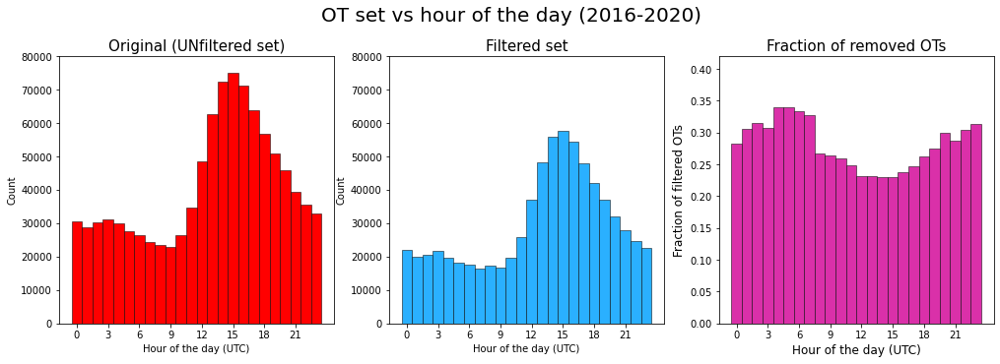

In [59]:
#Histogram of OTs distribution dep. on the hour of the day: CONCAT YEARS TOGETHER
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(17,5))

ax1.hist(all_OTset_2016_2020['time'].dt.hour, bins=np.arange(25)-0.5,
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(0, 24, 3))
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax1.set_title('Original (UNfiltered set)', fontsize=15);
ax1.set_ylim([0,80000])

ax2.hist(filt_OTset_2016_2020_FULL['time'].dt.hour, bins=np.arange(25)-0.5,
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(0, 24, 3))
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Hour of the day (UTC)', fontsize=10)
ax2.set_title('Filtered set', fontsize=15);
ax2.set_ylim([0,80000])

ax3.bar(np.arange(24), height=perc_filtOT_hour_fullFilt.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(0, 24, 3))
ax3.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax3.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax3.set_title('Fraction of removed OTs', fontsize=15);
ax3.set_ylim([0,0.42])

fig.suptitle('OT set vs hour of the day (2016-2020)', fontsize=20, y=1.02);

#pl.savefig(plt_fold + f"/hist_OTvsHour_2016-2020_PercRemoval.pdf",dpi=200, bbox_inches='tight')

#### - Monthly distributions

In [60]:
#Group by hour datasets and calculated fraction of OTs for every hour:
monthSum_nOT_all = all_OTset_2016_2020.groupby(all_OTset_2016_2020['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_fullFilt = filt_OTset_2016_2020_FULL.groupby(filt_OTset_2016_2020_FULL['time'].dt.month)['N_OT'].agg(['sum'])

#Fraction of OT filtered by each dataset for every hour
perc_filtOT_month_fullFilt = 1 - (monthSum_nOT_fullFilt['sum']/monthSum_nOT_all['sum'])

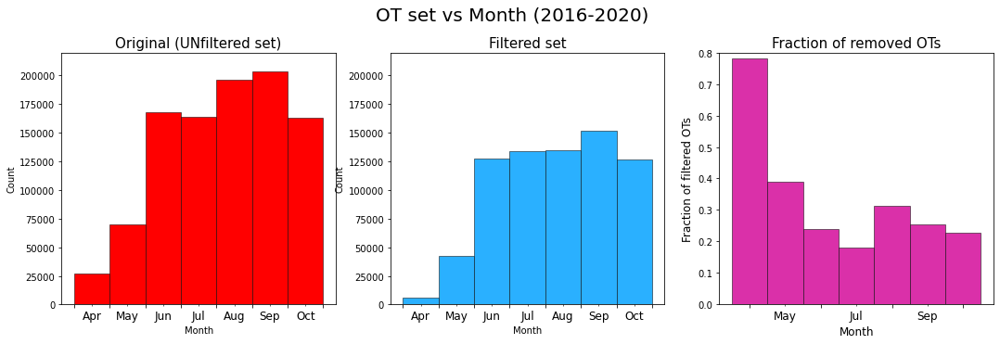

In [61]:
#Histogram of OTs distribution dep. on the MONTH:
fig, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(18,5))

ax1.hist(all_OTset_2016_2020['time'].dt.month, bins=np.arange(4,12,1),
         facecolor = 'red', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=8)
ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax1.set_ylabel('Count', fontsize=10)
ax1.set_xlabel('Month', fontsize=10)
ax1.set_title('Original (UNfiltered set)', fontsize=15);
ax1.set_ylim([0,220000])

ax2.hist(filt_OTset_2016_2020_FULL['time'].dt.month, bins=np.arange(4,12,1),
         facecolor = '#2ab0ff', edgecolor='black', linewidth=0.5)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax2.set_ylabel('Count', fontsize=10)
ax2.set_xlabel('Month', fontsize=10)
ax2.set_title('Filtered set', fontsize=15);
ax2.set_ylim([0,220000])

ax3.bar(np.arange(7), height=perc_filtOT_month_fullFilt.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=7)
ax3.set_xticks(np.arange(0,7), minor=True)
ax3.set_xticklabels('')
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=12)
ax3.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax3.set_xlabel('Month', fontsize=12)
ax3.set_title('Fraction of removed OTs', fontsize=15);
ax3.set_ylim([0,0.8])

fig.suptitle('OT set vs Month (2016-2020)', fontsize=20, y=1.02);

#pl.savefig(plt_fold + f"/hist_OTvsMonth_2016-2020_PercRemoval.jpg",dpi=200, bbox_inches='tight')

#### - Land/sea separation of monthly distributions

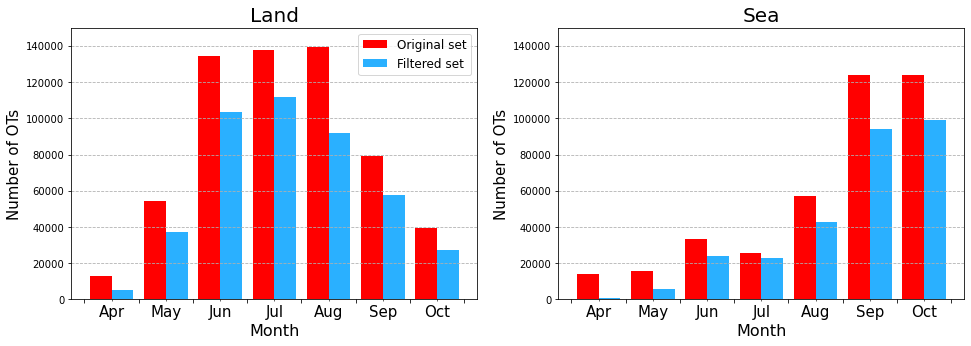

In [30]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16,5))

ax1.hist([all_OTset_2016_2020_land['time'].dt.month, 
         filt_OTset_2016_2020_FULL_land['time'].dt.month], 
         bins=np.arange(4,12,1), label=['Original set', 'Filtered set'],
        color=['red','#2ab0ff',])

ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=15)
ax1.set_ylabel('Number of OTs', fontsize=15)
#ax1.set_yticklabels([0,20000,40000,60000], fontsize=13)
ax1.set_xlabel('Month', fontsize=16)
ax1.set_ylim(0,150100)
ax1.legend(loc='upper right', fontsize=12)
ax1.grid(axis='y', ls='--')
ax1.set_title('Land', fontsize=20)


ax2.hist([all_OTset_2016_2020_sea['time'].dt.month, 
         filt_OTset_2016_2020_FULL_sea['time'].dt.month], 
         bins=np.arange(4,12,1), label=['Original set', 'Filtered set'],
        color=['red','#2ab0ff',])

ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=15)
ax2.set_ylabel('Number of OTs', fontsize=15)
#ax2.set_yticklabels([0,20000,40000,60000], fontsize=13)
ax2.set_xlabel('Month', fontsize=16)
ax2.set_ylim(0,150100)

#plt.legend(loc='upper right', fontsize=12)
ax2.grid(axis='y', ls='--')
ax2.set_title('Sea', fontsize=20)

#pl.savefig(plt_fold + f"/hist_OTvsMonth_2016-2020_LAND_SEA_allSets.pdf",dpi=200, bbox_inches='tight')

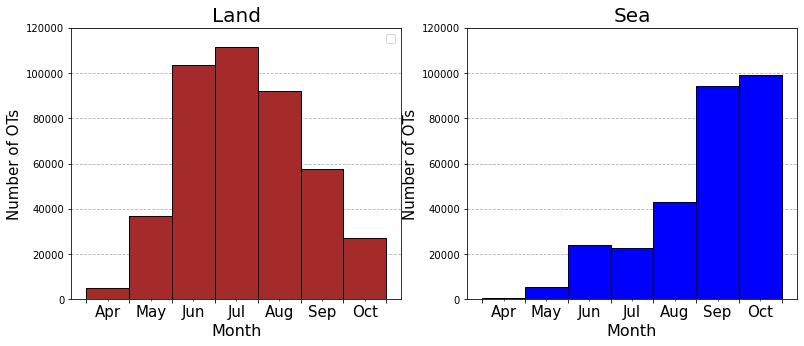

In [23]:
#ONLY FILTERED DATASET

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13,5))

ax1.hist(filt_OTset_2016_2020_FULL_land['time'].dt.month, 
         bins=np.arange(4,12,1), #label=['Original set', 'Filtered set'],
        color='brown',edgecolor='black', linewidth=1,width=1, zorder=2)


ax1.set_xticklabels('')
ax1.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=15)
ax1.set_ylabel('Number of OTs', fontsize=15)
#ax1.set_yticklabels([0,20000,40000,60000], fontsize=13)
ax1.set_xlabel('Month', fontsize=16)
ax1.set_ylim(0,120100)
ax1.legend(loc='upper right', fontsize=12)
ax1.grid(axis='y', ls='--')
ax1.set_title('Land', fontsize=20)


ax2.hist(filt_OTset_2016_2020_FULL_sea['time'].dt.month, 
         bins=np.arange(4,12,1), 
        color='blue',edgecolor='black', linewidth=1,width=1, zorder=2)

ax2.set_xticklabels('')
ax2.set_xticks([4.5,5.5,6.5,7.5,8.5,9.5,10.5], minor=True)
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], minor=True, fontsize=15)
ax2.set_ylabel('Number of OTs', fontsize=15)
#ax2.set_yticklabels([0,20000,40000,60000], fontsize=13)
ax2.set_xlabel('Month', fontsize=16)
ax2.set_ylim(0,120100)

#plt.legend(loc='upper right', fontsize=12)
ax2.grid(axis='y', ls='--')
ax2.set_title('Sea', fontsize=20)

#pl.savefig(plt_fold + f"/hist_OTvsMonth_2016-2020_LAND_SEA_allSets_onlyFiltered.pdf",dpi=200, bbox_inches='tight')

## 3.2) FULL vs SINGLE parameters filters

In [11]:
filt_OTset_2016_2020_K = pd.concat([OT_gdf_2016_dict['filt_OTset_2016_K'],
                                    OT_gdf_2017_dict['filt_OTset_2017_K'],
                                    OT_gdf_2018_dict['filt_OTset_2018_K'],
                                    OT_gdf_2019_dict['filt_OTset_2019_K'],
                                    OT_gdf_2020_dict['filt_OTset_2020_K']])

filt_OTset_2016_2020_LI = pd.concat([OT_gdf_2016_dict['filt_OTset_2016_LI'],
                                     OT_gdf_2017_dict['filt_OTset_2017_LI'],
                                     OT_gdf_2018_dict['filt_OTset_2018_LI'],
                                     OT_gdf_2019_dict['filt_OTset_2019_LI'],
                                     OT_gdf_2020_dict['filt_OTset_2020_LI']])

filt_OTset_2016_2020_CAPE = pd.concat([OT_gdf_2016_dict['filt_OTset_2016_CAPE'],
                                       OT_gdf_2017_dict['filt_OTset_2017_CAPE'],
                                       OT_gdf_2018_dict['filt_OTset_2018_CAPE'],
                                       OT_gdf_2019_dict['filt_OTset_2019_CAPE'],
                                       OT_gdf_2020_dict['filt_OTset_2020_CAPE']])

filt_OTset_2016_2020_DLS = pd.concat([OT_gdf_2016_dict['filt_OTset_2016_DLS'],
                                      OT_gdf_2017_dict['filt_OTset_2017_DLS'],
                                      OT_gdf_2018_dict['filt_OTset_2018_DLS'],
                                      OT_gdf_2019_dict['filt_OTset_2019_DLS'],
                                      OT_gdf_2020_dict['filt_OTset_2020_DLS']])

filt_OTset_2016_2020_H0 = pd.concat([OT_gdf_2016_dict['filt_OTset_2016_H0'],
                                     OT_gdf_2017_dict['filt_OTset_2017_H0'],
                                     OT_gdf_2018_dict['filt_OTset_2018_H0'],
                                     OT_gdf_2019_dict['filt_OTset_2019_H0'],
                                     OT_gdf_2020_dict['filt_OTset_2020_H0']])

In [46]:
filt_OTset_2016_2020_K_land = gpd.clip(filt_OTset_2016_2020_K, sfg_land).sort_index()

In [47]:
filt_OTset_2016_2020_LI_land = gpd.clip(filt_OTset_2016_2020_LI, sfg_land).sort_index()
filt_OTset_2016_2020_CAPE_land = gpd.clip(filt_OTset_2016_2020_CAPE, sfg_land).sort_index()
filt_OTset_2016_2020_DLS_land = gpd.clip(filt_OTset_2016_2020_DLS, sfg_land).sort_index()
filt_OTset_2016_2020_H0_land = gpd.clip(filt_OTset_2016_2020_H0, sfg_land).sort_index()

### 3.2.1) - Spatial distributions of percentage of filtered OTs per single filter

In [14]:
#add columns of 1s to be summed in the spatial join with grid:
filt_OTset_2016_2020_K['N_OT'] = 1
filt_OTset_2016_2020_LI['N_OT'] = 1
filt_OTset_2016_2020_DLS['N_OT'] = 1
filt_OTset_2016_2020_H0['N_OT'] = 1
filt_OTset_2016_2020_CAPE['N_OT'] = 1

points_filtOT_K = filt_OTset_2016_2020_K
points_filtOT_LI = filt_OTset_2016_2020_LI
points_filtOT_DLS = filt_OTset_2016_2020_DLS
points_filtOT_H0 = filt_OTset_2016_2020_H0
points_filtOT_CAPE = filt_OTset_2016_2020_CAPE

#spatial join between points and grid
pointInPolys_filtOT_K = sjoin(points_filtOT_K, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_LI = sjoin(points_filtOT_LI, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_DLS = sjoin(points_filtOT_DLS, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_H0 = sjoin(points_filtOT_H0, grid, how='left').drop(['index_right'],axis=1)
pointInPolys_filtOT_CAPE = sjoin(points_filtOT_CAPE, grid, how='left').drop(['index_right'],axis=1)

#sum points in each grid cell
pointSumByPoly_filtOT_K = pointInPolys_filtOT_K.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_LI = pointInPolys_filtOT_LI.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_DLS = pointInPolys_filtOT_DLS.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_H0 = pointInPolys_filtOT_H0.groupby('FID')['N_OT'].agg(['sum'])
pointSumByPoly_filtOT_CAPE = pointInPolys_filtOT_CAPE.groupby('FID')['N_OT'].agg(['sum'])

#create grid with associated number of OTs for each grid:
filtOT_countOnGrid_K = sfg_sp.copy()
filtOT_countOnGrid_LI = sfg_sp.copy()
filtOT_countOnGrid_DLS = sfg_sp.copy()
filtOT_countOnGrid_H0 = sfg_sp.copy()
filtOT_countOnGrid_CAPE = sfg_sp.copy()

filtOT_countOnGrid_K['N_OT'] = pointSumByPoly_filtOT_K['sum']
filtOT_countOnGrid_LI['N_OT'] = pointSumByPoly_filtOT_LI['sum']
filtOT_countOnGrid_DLS['N_OT'] = pointSumByPoly_filtOT_DLS['sum']
filtOT_countOnGrid_H0['N_OT'] = pointSumByPoly_filtOT_H0['sum']
filtOT_countOnGrid_CAPE['N_OT'] = pointSumByPoly_filtOT_CAPE['sum']

In [27]:
#Calc percentage of filtered OTs per box
#K index
perc_filtOT_countOnGrid_K = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_K['FID'] = allOT_countOnGrid['FID']
perc_filtOT_countOnGrid_K['geometry'] = allOT_countOnGrid['geometry']
perc_filtOT_countOnGrid_K['perc_OT'] = 1 - (filtOT_countOnGrid_K['N_OT']/allOT_countOnGrid['N_OT'])

#LI index
perc_filtOT_countOnGrid_LI = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_LI['FID'] = allOT_countOnGrid['FID']
perc_filtOT_countOnGrid_LI['geometry'] = allOT_countOnGrid['geometry']
perc_filtOT_countOnGrid_LI['perc_OT'] = 1 - (filtOT_countOnGrid_LI['N_OT']/allOT_countOnGrid['N_OT'])

#DLS
perc_filtOT_countOnGrid_DLS = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_DLS['FID'] = allOT_countOnGrid['FID']
perc_filtOT_countOnGrid_DLS['geometry'] = allOT_countOnGrid['geometry']
perc_filtOT_countOnGrid_DLS['perc_OT'] = 1 - (filtOT_countOnGrid_DLS['N_OT']/allOT_countOnGrid['N_OT'])

#H0
perc_filtOT_countOnGrid_H0 = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_H0['FID'] = allOT_countOnGrid['FID']
perc_filtOT_countOnGrid_H0['geometry'] = allOT_countOnGrid['geometry']
perc_filtOT_countOnGrid_H0['perc_OT'] = 1 - (filtOT_countOnGrid_H0['N_OT']/allOT_countOnGrid['N_OT'])

#CAPE
perc_filtOT_countOnGrid_CAPE = gpd.GeoDataFrame(columns=['FID','geometry','perc_OT'])
perc_filtOT_countOnGrid_CAPE['FID'] = allOT_countOnGrid['FID']
perc_filtOT_countOnGrid_CAPE['geometry'] = allOT_countOnGrid['geometry']
perc_filtOT_countOnGrid_CAPE['perc_OT'] = 1 - (filtOT_countOnGrid_CAPE['N_OT']/allOT_countOnGrid['N_OT'])

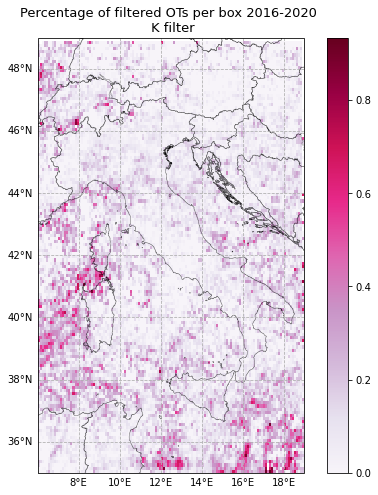

In [29]:
fig, ax1 = plt.subplots(1, 1, figsize=(8,8), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_K.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Percentage of filtered OTs per box 2016-2020 \n K filter', fontsize=13);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/percOT_K_2016-2020.jpg",dpi=200, bbox_inches='tight')

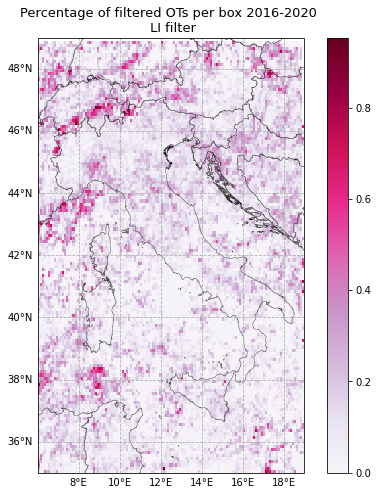

In [31]:
fig, ax1 = plt.subplots(1, 1, figsize=(8,8), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_LI.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Percentage of filtered OTs per box 2016-2020 \n LI filter', fontsize=13);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/percOT_LI_2016-2020.jpg",dpi=200, bbox_inches='tight')

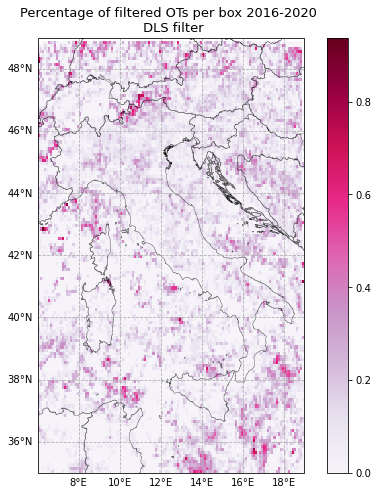

In [33]:
fig, ax1 = plt.subplots(1, 1, figsize=(8,8), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_DLS.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Percentage of filtered OTs per box 2016-2020 \n DLS filter', fontsize=13);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/percOT_DLS_2016-2020.pdf",dpi=200, bbox_inches='tight')

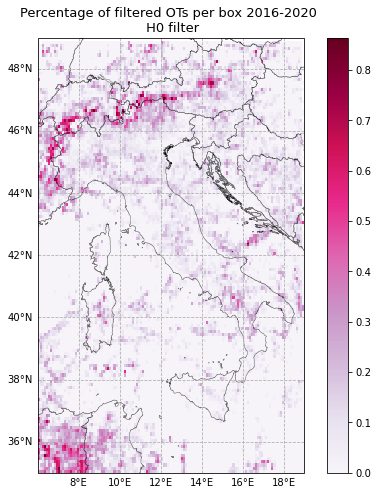

In [35]:
fig, ax1 = plt.subplots(1, 1, figsize=(8,8), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_H0.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Percentage of filtered OTs per box 2016-2020 \n H0 filter', fontsize=13);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/percOT_H0_2016-2020.pdf",dpi=200, bbox_inches='tight')

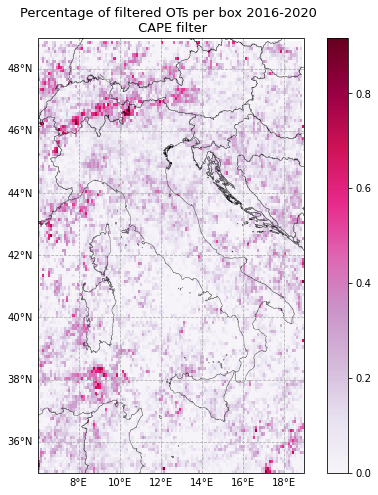

In [37]:
fig, ax1 = plt.subplots(1, 1, figsize=(8,8), subplot_kw={'projection': ccrs.PlateCarree()})

perc_filtOT_countOnGrid_CAPE.plot(column='perc_OT', ax=ax1, cmap='PuRd', kind='geo', zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Percentage of filtered OTs per box 2016-2020 \n CAPE filter', fontsize=13);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/percOT_CAPE_2016-2020.pdf",dpi=200, bbox_inches='tight')

### 3.2.2) - Temporal distributions (histograms) of singular filters on monthly and hourly basis

#### - Monthly

In [38]:
#Group by hour datasets and calculated fraction of OTs for every month:
monthSum_nOT_all = all_OTset_2016_2020.groupby(all_OTset_2016_2020['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_fullFilt = filt_OTset_2016_2020_FULL.groupby(filt_OTset_2016_2020_FULL['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_K = filt_OTset_2016_2020_K.groupby(filt_OTset_2016_2020_K['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_LI = filt_OTset_2016_2020_LI.groupby(filt_OTset_2016_2020_LI['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_DLS = filt_OTset_2016_2020_DLS.groupby(filt_OTset_2016_2020_DLS['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_H0 = filt_OTset_2016_2020_H0.groupby(filt_OTset_2016_2020_H0['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_CAPE = filt_OTset_2016_2020_CAPE.groupby(filt_OTset_2016_2020_CAPE['time'].dt.month)['N_OT'].agg(['sum'])

#Fraction of OT filtered by each dataset for every month
perc_filtOT_month_fullFilt = 1 - (monthSum_nOT_fullFilt['sum']/monthSum_nOT_all['sum'])
perc_filtOT_month_K = 1 - (monthSum_nOT_K['sum']/monthSum_nOT_all['sum'])
perc_filtOT_month_LI = 1 - (monthSum_nOT_LI['sum']/monthSum_nOT_all['sum'])
perc_filtOT_month_DLS = 1 - (monthSum_nOT_DLS['sum']/monthSum_nOT_all['sum'])
perc_filtOT_month_H0 = 1 - (monthSum_nOT_H0['sum']/monthSum_nOT_all['sum'])
perc_filtOT_month_CAPE = 1 - (monthSum_nOT_CAPE['sum']/monthSum_nOT_all['sum'])

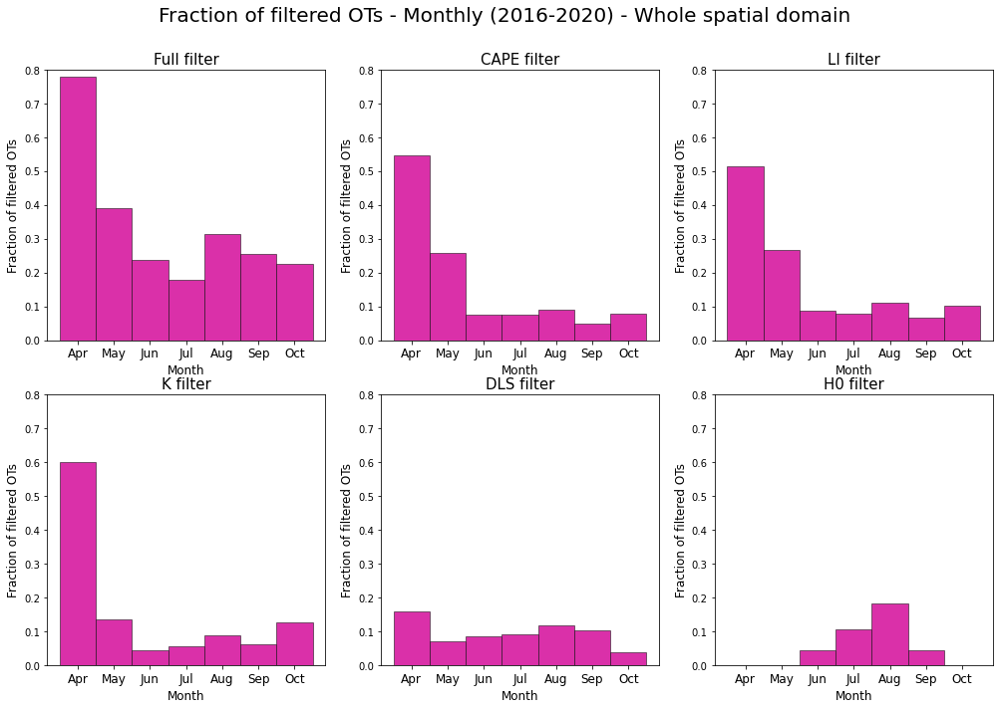

In [40]:
#Histogram of OTs distribution dep. on the hour of the day:
fig, ((ax1, ax2, ax3),(ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(17,11))

ax1.bar(np.arange(4,11,1), height=perc_filtOT_month_fullFilt.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(4, 11, 1))
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax1.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax1.set_xlabel('Month', fontsize=12)
ax1.set_title('Full filter', fontsize=15);
ax1.set_ylim([0,0.8])

ax2.bar(np.arange(4,11,1), height=perc_filtOT_month_CAPE.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(4, 11, 1))
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax2.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax2.set_xlabel('Month', fontsize=12)
ax2.set_title('CAPE filter', fontsize=15);
ax2.set_ylim([0,0.8])

ax3.bar(np.arange(4,11,1), height=perc_filtOT_month_LI.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(4, 11, 1))
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax3.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax3.set_xlabel('Month', fontsize=12)
ax3.set_title('LI filter', fontsize=15);
ax3.set_ylim([0,0.8])

ax4.bar(np.arange(4,11,1), height=perc_filtOT_month_K.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticks(np.arange(4, 11, 1))
ax4.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax4.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax4.set_xlabel('Month', fontsize=12)
ax4.set_title('K filter', fontsize=15);
ax4.set_ylim([0,0.8])

ax5.bar(np.arange(4,11,1), height=perc_filtOT_month_DLS.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax5.set_xticks(np.arange(4, 11, 1))
ax5.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax5.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax5.set_xlabel('Month', fontsize=12)
ax5.set_title('DLS filter', fontsize=15);
ax5.set_ylim([0,0.8])

ax6.bar(np.arange(4,11,1), height=perc_filtOT_month_H0.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax6.set_xticks(np.arange(4, 11, 1))
ax6.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax6.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax6.set_xlabel('Month', fontsize=12)
ax6.set_title('H0 filter', fontsize=15);
ax6.set_ylim([0,0.8])

fig.suptitle('Fraction of filtered OTs - Monthly (2016-2020) - Whole spatial domain', fontsize=20, y=0.96);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/MonthlyFilt_2016-2020_WholeDomain.pdf", 
#           dpi=200, bbox_inches='tight')

In [48]:
all_OTset_2016_2020_land['N_OT'] = 1
filt_OTset_2016_2020_FULL_land['N_OT'] = 1

In [49]:
#ONLY OVER LAND
#Group by hour datasets and calculated fraction of OTs for every month:
monthSum_nOT_all_land = all_OTset_2016_2020_land.groupby(all_OTset_2016_2020_land['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_fullFilt_land = filt_OTset_2016_2020_FULL_land.groupby(filt_OTset_2016_2020_FULL_land['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_K_land = filt_OTset_2016_2020_K_land.groupby(filt_OTset_2016_2020_K_land['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_LI_land = filt_OTset_2016_2020_LI_land.groupby(filt_OTset_2016_2020_LI_land['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_DLS_land = filt_OTset_2016_2020_DLS_land.groupby(filt_OTset_2016_2020_DLS_land['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_H0_land = filt_OTset_2016_2020_H0_land.groupby(filt_OTset_2016_2020_H0_land['time'].dt.month)['N_OT'].agg(['sum'])
monthSum_nOT_CAPE_land = filt_OTset_2016_2020_CAPE_land.groupby(filt_OTset_2016_2020_CAPE_land['time'].dt.month)['N_OT'].agg(['sum'])

#Fraction of OT filtered by each dataset for every month
perc_filtOT_month_fullFilt_land = 1 - (monthSum_nOT_fullFilt_land['sum']/monthSum_nOT_all_land['sum'])
perc_filtOT_month_K_land = 1 - (monthSum_nOT_K_land['sum']/monthSum_nOT_all_land['sum'])
perc_filtOT_month_LI_land = 1 - (monthSum_nOT_LI_land['sum']/monthSum_nOT_all_land['sum'])
perc_filtOT_month_DLS_land = 1 - (monthSum_nOT_DLS_land['sum']/monthSum_nOT_all_land['sum'])
perc_filtOT_month_H0_land = 1 - (monthSum_nOT_H0_land['sum']/monthSum_nOT_all_land['sum'])
perc_filtOT_month_CAPE_land = 1 - (monthSum_nOT_CAPE_land['sum']/monthSum_nOT_all_land['sum'])

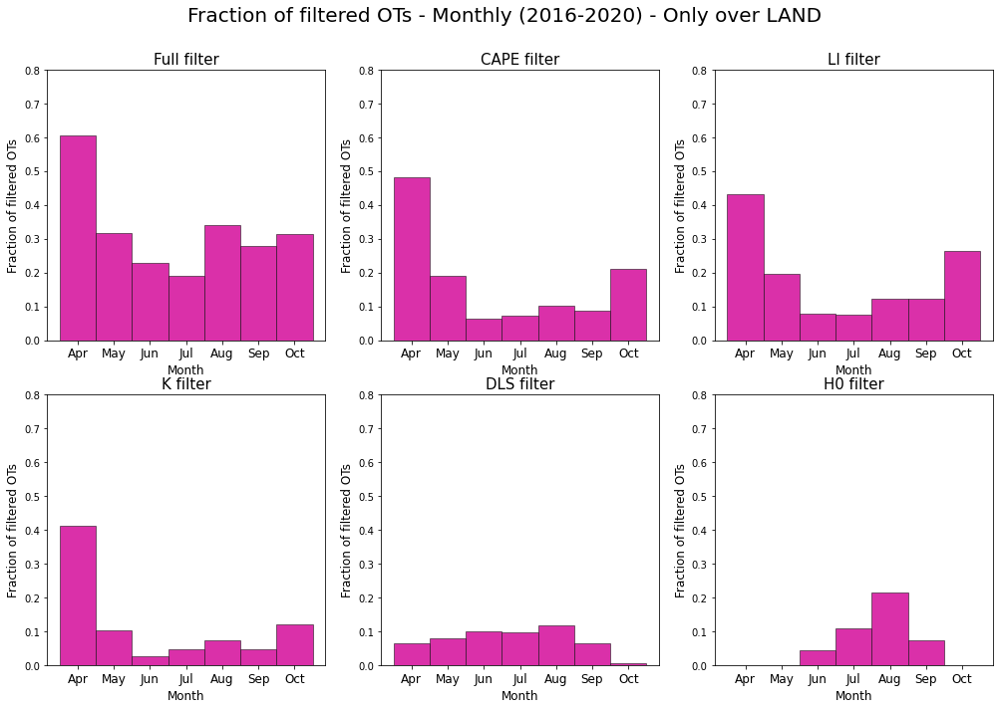

In [53]:
#Histogram of OTs distribution dep. on the hour of the day:
fig, ((ax1, ax2, ax3),(ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(17,11))

ax1.bar(np.arange(4,11,1), height=perc_filtOT_month_fullFilt_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(4, 11, 1))
ax1.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax1.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax1.set_xlabel('Month', fontsize=12)
ax1.set_title('Full filter', fontsize=15);
ax1.set_ylim([0,0.8])

ax2.bar(np.arange(4,11,1), height=perc_filtOT_month_CAPE_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(4, 11, 1))
ax2.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax2.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax2.set_xlabel('Month', fontsize=12)
ax2.set_title('CAPE filter', fontsize=15);
ax2.set_ylim([0,0.8])

ax3.bar(np.arange(4,11,1), height=perc_filtOT_month_LI_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(4, 11, 1))
ax3.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax3.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax3.set_xlabel('Month', fontsize=12)
ax3.set_title('LI filter', fontsize=15);
ax3.set_ylim([0,0.8])

ax4.bar(np.arange(4,11,1), height=perc_filtOT_month_K_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticks(np.arange(4, 11, 1))
ax4.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax4.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax4.set_xlabel('Month', fontsize=12)
ax4.set_title('K filter', fontsize=15);
ax4.set_ylim([0,0.8])

ax5.bar(np.arange(4,11,1), height=perc_filtOT_month_DLS_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax5.set_xticks(np.arange(4, 11, 1))
ax5.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax5.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax5.set_xlabel('Month', fontsize=12)
ax5.set_title('DLS filter', fontsize=15);
ax5.set_ylim([0,0.8])

ax6.bar(np.arange(4,11,1), height=perc_filtOT_month_H0_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5, align='center', width=1)
pl.locator_params(axis='x', nbins=24)
ax6.set_xticks(np.arange(4, 11, 1))
ax6.set_xticklabels(['Apr','May','Jun','Jul','Aug','Sep','Oct'], fontsize=12)
ax6.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax6.set_xlabel('Month', fontsize=12)
ax6.set_title('H0 filter', fontsize=15);
ax6.set_ylim([0,0.8])

fig.suptitle('Fraction of filtered OTs - Monthly (2016-2020) - Only over LAND', fontsize=20, y=0.96);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/MonthlyFilt_2016-2020_LAND.jpg", 
#           dpi=200, bbox_inches='tight')

#### - Hourly

In [55]:
#Group by hour datasets and calculated fraction of OTs for every hour:
hourSum_nOT_all = all_OTset_2016_2020.groupby(all_OTset_2016_2020['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_fullFilt = filt_OTset_2016_2020_FULL.groupby(filt_OTset_2016_2020_FULL['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_K = filt_OTset_2016_2020_K.groupby(filt_OTset_2016_2020_K['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_LI = filt_OTset_2016_2020_LI.groupby(filt_OTset_2016_2020_LI['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_DLS = filt_OTset_2016_2020_DLS.groupby(filt_OTset_2016_2020_DLS['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_H0 = filt_OTset_2016_2020_H0.groupby(filt_OTset_2016_2020_H0['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_CAPE = filt_OTset_2016_2020_CAPE.groupby(filt_OTset_2016_2020_CAPE['time'].dt.hour)['N_OT'].agg(['sum'])

#Fraction of OT filtered by each dataset for every hour
perc_filtOT_hour_fullFilt = 1 - (hourSum_nOT_fullFilt['sum']/hourSum_nOT_all['sum'])
perc_filtOT_hour_K = 1 - (hourSum_nOT_K['sum']/hourSum_nOT_all['sum'])
perc_filtOT_hour_LI = 1 - (hourSum_nOT_LI['sum']/hourSum_nOT_all['sum'])
perc_filtOT_hour_DLS = 1 - (hourSum_nOT_DLS['sum']/hourSum_nOT_all['sum'])
perc_filtOT_hour_H0 = 1 - (hourSum_nOT_H0['sum']/hourSum_nOT_all['sum'])
perc_filtOT_hour_CAPE = 1 - (hourSum_nOT_CAPE['sum']/hourSum_nOT_all['sum'])

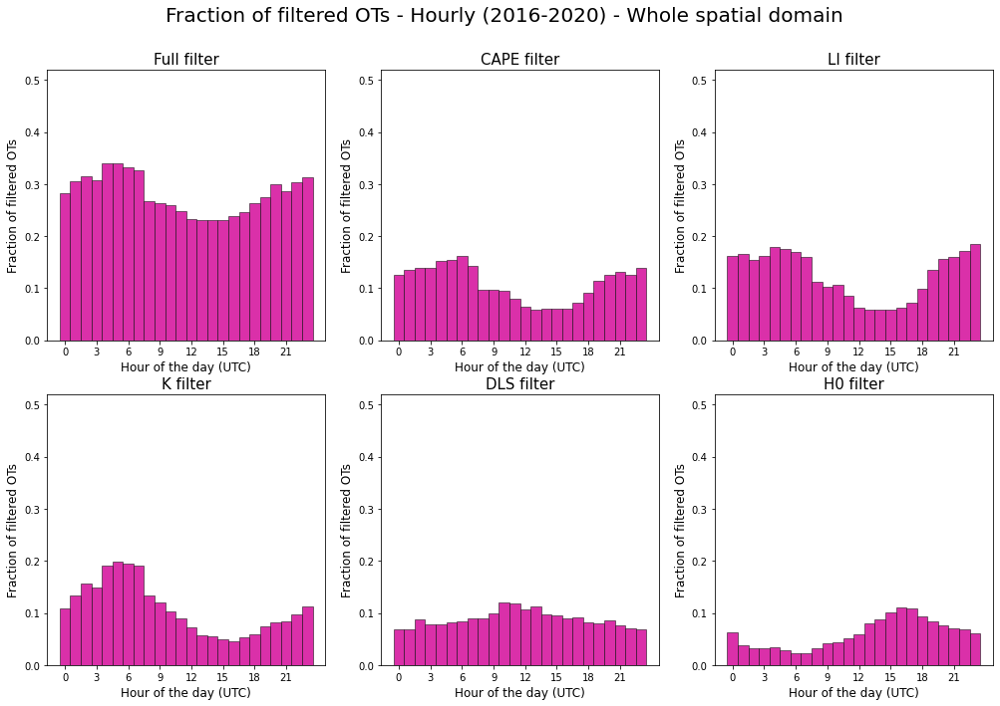

In [57]:
#Histogram of OTs distribution dep. on the hour of the day:
fig, ((ax1, ax2, ax3),(ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(17,11))

ax1.bar(np.arange(24), height=perc_filtOT_hour_fullFilt.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(0, 24, 3))
ax1.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax1.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax1.set_title('Full filter', fontsize=15);
ax1.set_ylim([0,0.52])

ax2.bar(np.arange(24), height=perc_filtOT_hour_CAPE.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(0, 24, 3))
ax2.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax2.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax2.set_title('CAPE filter', fontsize=15);
ax2.set_ylim([0,0.52])

ax3.bar(np.arange(24), height=perc_filtOT_hour_LI.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(0, 24, 3))
ax3.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax3.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax3.set_title('LI filter', fontsize=15);
ax3.set_ylim([0,0.52])

ax4.bar(np.arange(24), height=perc_filtOT_hour_K.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticks(np.arange(0, 24, 3))
ax4.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax4.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax4.set_title('K filter', fontsize=15);
ax4.set_ylim([0,0.52])

ax5.bar(np.arange(24), height=perc_filtOT_hour_DLS.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax5.set_xticks(np.arange(0, 24, 3))
ax5.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax5.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax5.set_title('DLS filter', fontsize=15);
ax5.set_ylim([0,0.52])

ax6.bar(np.arange(24), height=perc_filtOT_hour_H0.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax6.set_xticks(np.arange(0, 24, 3))
ax6.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax6.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax6.set_title('H0 filter', fontsize=15);
ax6.set_ylim([0,0.52])

fig.suptitle('Fraction of filtered OTs - Hourly (2016-2020) - Whole spatial domain', fontsize=20, y=0.96);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/HourlyFilt_2016-2020_WholeDomain.pdf", 
#          dpi=200, bbox_inches='tight')

In [58]:
#Group by hour datasets and calculated fraction of OTs for every hour:
hourSum_nOT_all_land = all_OTset_2016_2020_land.groupby(all_OTset_2016_2020_land['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_fullFilt_land = filt_OTset_2016_2020_FULL_land.groupby(filt_OTset_2016_2020_FULL_land['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_K_land = filt_OTset_2016_2020_K_land.groupby(filt_OTset_2016_2020_K_land['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_LI_land = filt_OTset_2016_2020_LI_land.groupby(filt_OTset_2016_2020_LI_land['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_DLS_land = filt_OTset_2016_2020_DLS_land.groupby(filt_OTset_2016_2020_DLS_land['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_H0_land = filt_OTset_2016_2020_H0_land.groupby(filt_OTset_2016_2020_H0_land['time'].dt.hour)['N_OT'].agg(['sum'])
hourSum_nOT_CAPE_land = filt_OTset_2016_2020_CAPE_land.groupby(filt_OTset_2016_2020_CAPE_land['time'].dt.hour)['N_OT'].agg(['sum'])

#Fraction of OT filtered by each dataset for every hour
perc_filtOT_hour_fullFilt_land = 1 - (hourSum_nOT_fullFilt_land['sum']/hourSum_nOT_all_land['sum'])
perc_filtOT_hour_K_land = 1 - (hourSum_nOT_K_land['sum']/hourSum_nOT_all_land['sum'])
perc_filtOT_hour_LI_land = 1 - (hourSum_nOT_LI_land['sum']/hourSum_nOT_all_land['sum'])
perc_filtOT_hour_DLS_land = 1 - (hourSum_nOT_DLS_land['sum']/hourSum_nOT_all_land['sum'])
perc_filtOT_hour_H0_land = 1 - (hourSum_nOT_H0_land['sum']/hourSum_nOT_all_land['sum'])
perc_filtOT_hour_CAPE_land = 1 - (hourSum_nOT_CAPE_land['sum']/hourSum_nOT_all_land['sum'])

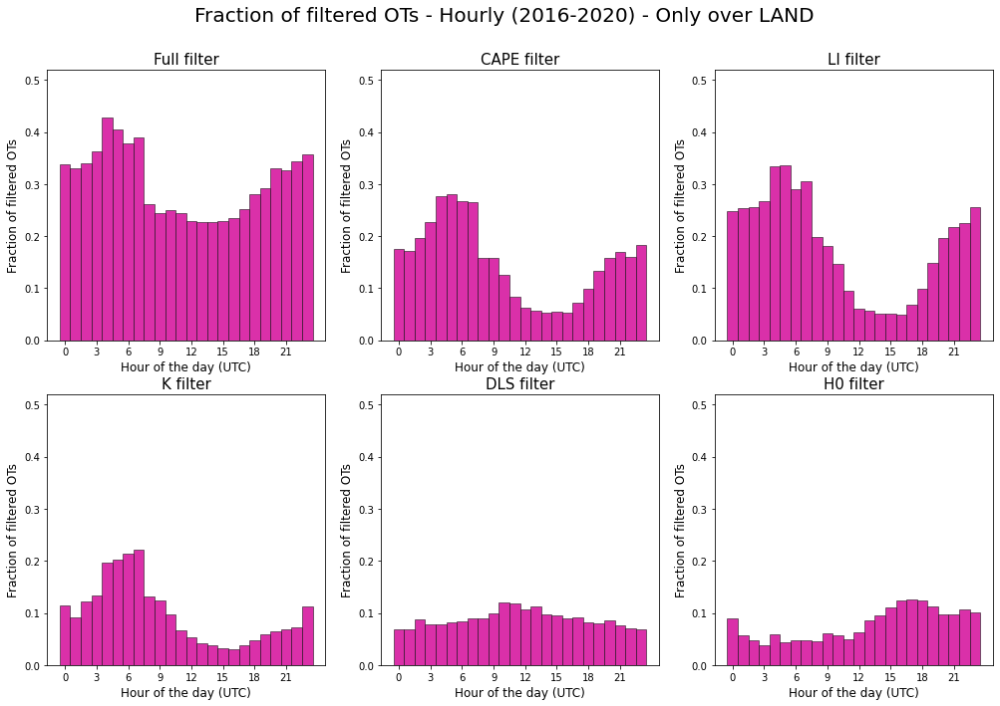

In [60]:
#Histogram of OTs distribution dep. on the hour of the day:
fig, ((ax1, ax2, ax3),(ax4, ax5, ax6)) = plt.subplots(2, 3, figsize=(17,11))

ax1.bar(np.arange(24), height=perc_filtOT_hour_fullFilt_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax1.set_xticks(np.arange(0, 24, 3))
ax1.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax1.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax1.set_title('Full filter', fontsize=15);
ax1.set_ylim([0,0.52])

ax2.bar(np.arange(24), height=perc_filtOT_hour_CAPE_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax2.set_xticks(np.arange(0, 24, 3))
ax2.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax2.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax2.set_title('CAPE filter', fontsize=15);
ax2.set_ylim([0,0.52])

ax3.bar(np.arange(24), height=perc_filtOT_hour_LI_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax3.set_xticks(np.arange(0, 24, 3))
ax3.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax3.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax3.set_title('LI filter', fontsize=15);
ax3.set_ylim([0,0.52])

ax4.bar(np.arange(24), height=perc_filtOT_hour_K_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax4.set_xticks(np.arange(0, 24, 3))
ax4.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax4.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax4.set_title('K filter', fontsize=15);
ax4.set_ylim([0,0.52])

ax5.bar(np.arange(24), height=perc_filtOT_hour_DLS.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax5.set_xticks(np.arange(0, 24, 3))
ax5.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax5.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax5.set_title('DLS filter', fontsize=15);
ax5.set_ylim([0,0.52])

ax6.bar(np.arange(24), height=perc_filtOT_hour_H0_land.values, facecolor = '#DA30A9', 
        edgecolor='black', linewidth=0.5,width=1)
pl.locator_params(axis='x', nbins=24)
ax6.set_xticks(np.arange(0, 24, 3))
ax6.set_ylabel('Fraction of filtered OTs', fontsize=12)
ax6.set_xlabel('Hour of the day (UTC)', fontsize=12)
ax6.set_title('H0 filter', fontsize=15);
ax6.set_ylim([0,0.52])

fig.suptitle('Fraction of filtered OTs - Hourly (2016-2020) - Only over LAND', fontsize=20, y=0.96);

#pl.savefig(plt_fold + f"/OTfilter_percentageFilt/HourlyFilt_2016-2020_LAND.jpg", 
#           dpi=200, bbox_inches='tight')

## 3.3) - Hail frequency maps

Geographical estimates of hail frequency based on daily frequency of the developed hail proxy (hailing-OTs).

Separate between all seasons and Apr-May, JJA, Sep-Oct

**Hail frequency** definition: from Punge & Kunz (2016): 

  -  "..counting the number of hail events per year at a certain location (much smaller than the entire hailstreak)" is the most straightforward definition
  - "Due to the small extent of hailstreaks, point hail frequencies often show large spatial variability. For this reason, the total number of hailstorms for a larger reference area in terms of counts per area and year is often used"
  - "For practical reasons, hail frequency is often quantified in terms of hail days per year for a certain region instead of counting the number of all individual storms. In this definition, a **hail day** is considered a day when hail occurred anywhere within the reference area"
  
=> So we could estimate for each box of the gridded SPHERA domain the number of filteredOT-based hail days (i.e. the number of days in which at least 1 hailing-OT falls within the box) and divide by the total number of days considered Apr-Oct 2016-2020. We can try the same process with the ESWD reports instead of OTs (clearly much lower number) to see if there is spatial correlation between the two

In [11]:
filt_OTset_2016_2020_FULL['N_OT'] = 1
points_filtOT = filt_OTset_2016_2020_FULL

#spatial join between points and grid
pointInPolys_filtOT = sjoin(points_filtOT, grid, how='left').drop(['index_right'],axis=1)

In [12]:
pointInPolys_filtOT_sorted = pointInPolys_filtOT.sort_values(by='FID')

##### - Full 5-year period (2016-2020) Apr-Oct:

In [13]:
hail_days_filtOT = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
hail_days_filtOT['FID']= grid['FID']
hail_days_filtOT['geometry']= grid['geometry']
hail_days_filtOT['N_hailDays'] = hail_days_filtOT['N_hailDays'].astype(float)

In [14]:
#Extract the hail days for each grid cell (FID): 
pointInPolys_filtOT_sorted = pointInPolys_filtOT.sort_values(by='FID')

for fid in np.arange(0,18200,1):

    hail_days_filtOT['N_hailDays'][hail_days_filtOT['FID'] == fid]=len(pointInPolys_filtOT_sorted[pointInPolys_filtOT_sorted['FID']==fid]['time'].dt.date.unique())

In [15]:
hail_days_filtOT['freq_hailDays'] = hail_days_filtOT['N_hailDays']/5 #years

In [16]:
hail_days_filtOT.sort_values(by='freq_hailDays').iloc[-1]

FID                                                          13947
geometry         POLYGON ((9.699999999999999 45.7, 9.6999999999...
N_hailDays                                                    48.0
freq_hailDays                                                  9.6
Name: 13947, dtype: object

In [17]:
max(hail_days_filtOT['freq_hailDays'])

9.6

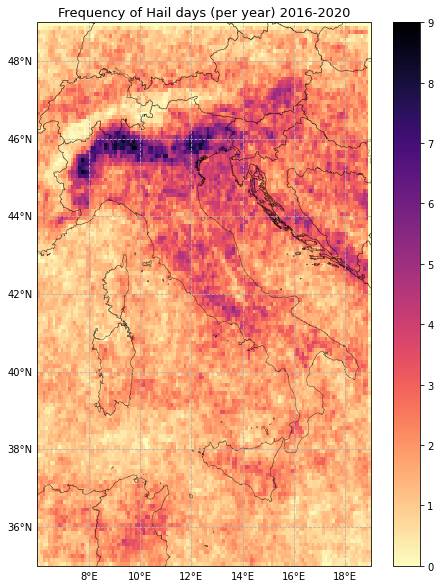

In [17]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT.plot(column='freq_hailDays', ax=ax, cmap='magma_r', kind='geo', zorder=1,vmin=0, vmax=9,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_2016-2020_10km_2.jpg", dpi=200, bbox_inches='tight')

### To obtain smoothed field with a Gaussian filter:

Vedi: 

- https://stackoverflow.com/questions/33825531/meshgrid-of-z-values-that-match-x-and-y-meshgrid-values
- https://stackoverflow.com/questions/53306627/contourf-plots-whitespace-over-finite-data-past-answers-do-not-correct
- https://stackoverflow.com/questions/24032282/create-contour-plot-from-pandas-groupby-dataframe

Trovato soluzione qui: https://stackoverflow.com/questions/69551830/overlay-contour-plot-over-the-map
In pratica: ricampionare spazio lat,lon senza che ci siano buchi, e proiettare la variabile Z (freq hail days) sopra con griddata interpolando (con vari metodi possibili: nearest,linear,cubic)
TUTTAVIA questo metodo non produce un campo smussato ma un campo interpolato che però rimane simile all'originale su griglia regolare lat lon

In [25]:
hail_days_filtOT['lon'] = hail_days_filtOT.geometry.centroid.x
hail_days_filtOT['lat'] = hail_days_filtOT.geometry.centroid.y

In [26]:
import plotly.graph_objects as go
from scipy.interpolate import griddata
import scipy.ndimage
from scipy.ndimage.filters import gaussian_filter

In [27]:
df = hail_days_filtOT

In [28]:
x = np.array(df.lon)
y = np.array(df.lat)
z = np.array(df.freq_hailDays)
xi = np.linspace(x.min(), x.max(), 150)
yi = np.linspace(y.min(), y.max(), 150)


In [57]:
X,Y = np.meshgrid(xi,yi)
Z = griddata((x,y),z,(X,Y), method='nearest')


In [61]:
#To smooth the data even more after the interpolation use a gaussian filter:
Z = gaussian_filter(Z, 0.3)

In [62]:
Z

array([[0.57536765, 0.71223647, 0.74461252, ..., 0.53501782, 0.48974546,
        0.41078696],
       [0.68313504, 0.86430473, 1.16129595, ..., 0.78847838, 0.76441869,
        0.7210908 ],
       [0.73026154, 1.03523378, 1.49490827, ..., 0.95382714, 0.99839288,
        0.98617424],
       ...,
       [0.64854074, 0.47144463, 0.4207437 , ..., 1.40313118, 0.96607196,
        0.33070511],
       [0.25050832, 0.20398153, 0.22203837, ..., 0.83524459, 0.59010982,
        0.20350241],
       [0.02540021, 0.03017974, 0.05198868, ..., 0.21098698, 0.15728995,
        0.05432202]])

In [80]:
#DEFINE FUNCTION TO SMOOTH:
def smooth_field_Gaussian(hail_days_filtOT):
    
    #extract center lat/lon values for each polygon in the geometry
    hail_days_filtOT['lon'] = hail_days_filtOT.geometry.centroid.x
    hail_days_filtOT['lat'] = hail_days_filtOT.geometry.centroid.y
    
    df = hail_days_filtOT
    
    #distribute lat/lon values over a grid and a 3rd dimension as the variable to smooth (freq hail days)
    x = np.array(df.lon)
    y = np.array(df.lat)
    z = np.array(df.N_hailDays_AVG)   #df.freq_hailDays for entire dataset, df.N_hailDays_AVG for seasonal sets
    xi = np.linspace(x.min(), x.max(), 150)
    yi = np.linspace(y.min(), y.max(), 150)

    X,Y = np.meshgrid(xi,yi)
    #interpolate z data with nearest neighbour method
    Z = griddata((x,y),z,(X,Y), method='nearest')
    
    #To smooth the data even more after the interpolation use a gaussian filter:
    Z = gaussian_filter(Z, 0.8)
    
    return X,Y,Z

In [75]:
X,Y,Z = smooth_field_Gaussian(hail_days_filtOT)

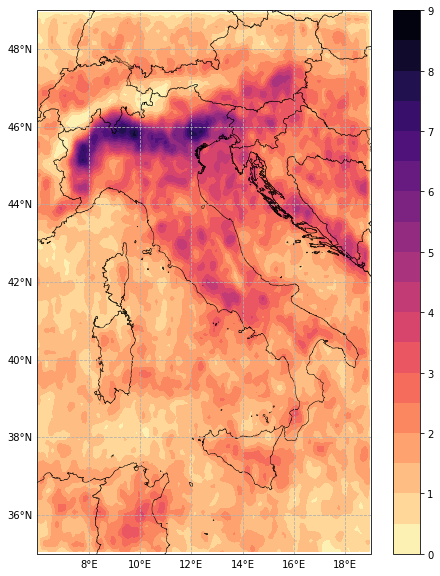

In [76]:
map_crs = ccrs.PlateCarree()

fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(X, Y, Z, transform=map_crs, 
                  levels=np.arange(0,9.5,0.5), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)

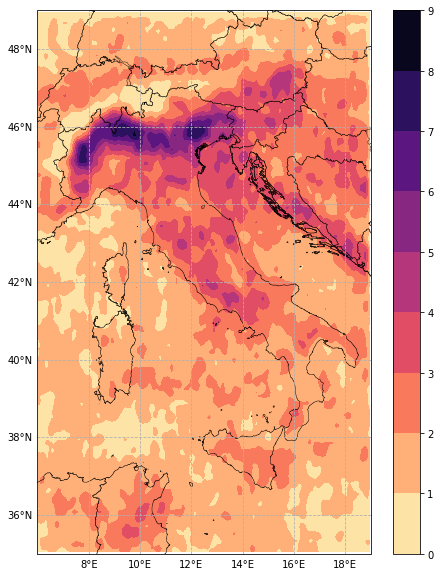

In [180]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(X, Y, Z, transform=map_crs, 
                  levels=np.arange(0,10,1), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
#pl.savefig(plt_fold + f"/hailFreq/hailFreq_2016-2020_10km_SMOOTHED6.pdf", dpi=200, bbox_inches='tight')

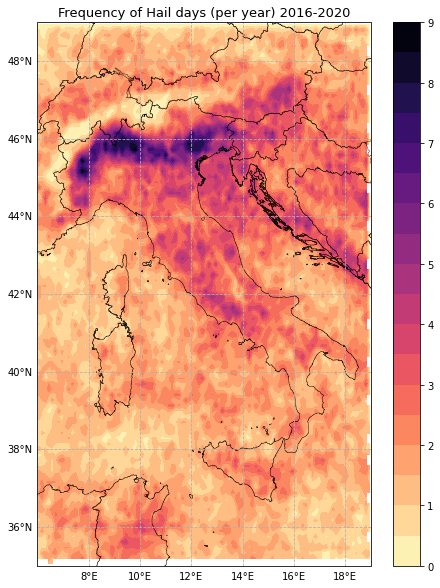

In [79]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(X, Y, Z, transform=map_crs, 
                  levels=np.arange(0,9.5,0.5), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)

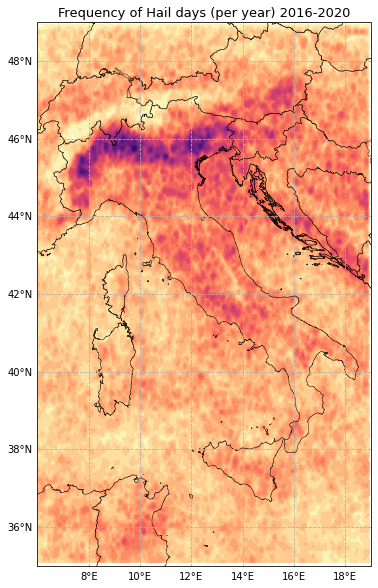

In [65]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

ax.contourf(X, Y, Z, transform=map_crs, 
                  levels=np.arange(0,12,0.5), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);


In [ ]:
from collections import Counter

##### - Separately for each year and then average the results:

In [120]:
hail_days_filtOT_2016 = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
hail_days_filtOT_2016['FID']= grid['FID']
hail_days_filtOT_2016['geometry']= grid['geometry']
hail_days_filtOT_2016['N_hailDays'] = hail_days_filtOT_2016['N_hailDays'].astype(float)

hail_days_filtOT_2017 = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
hail_days_filtOT_2017['FID']= grid['FID']
hail_days_filtOT_2017['geometry']= grid['geometry']
hail_days_filtOT_2017['N_hailDays'] = hail_days_filtOT_2017['N_hailDays'].astype(float)

hail_days_filtOT_2018 = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
hail_days_filtOT_2018['FID']= grid['FID']
hail_days_filtOT_2018['geometry']= grid['geometry']
hail_days_filtOT_2018['N_hailDays'] = hail_days_filtOT_2018['N_hailDays'].astype(float)

hail_days_filtOT_2019 = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
hail_days_filtOT_2019['FID']= grid['FID']
hail_days_filtOT_2019['geometry']= grid['geometry']
hail_days_filtOT_2019['N_hailDays'] = hail_days_filtOT_2019['N_hailDays'].astype(float)

hail_days_filtOT_2020 = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
hail_days_filtOT_2020['FID']= grid['FID']
hail_days_filtOT_2020['geometry']= grid['geometry']
hail_days_filtOT_2020['N_hailDays'] = hail_days_filtOT_2020['N_hailDays'].astype(float)

In [121]:
pointInPolys_filtOT_sorted_2016 = pointInPolys_filtOT_sorted[pointInPolys_filtOT_sorted.time.dt.year == 2016]
pointInPolys_filtOT_sorted_2017 = pointInPolys_filtOT_sorted[pointInPolys_filtOT_sorted.time.dt.year == 2017]
pointInPolys_filtOT_sorted_2018 = pointInPolys_filtOT_sorted[pointInPolys_filtOT_sorted.time.dt.year == 2018]
pointInPolys_filtOT_sorted_2019 = pointInPolys_filtOT_sorted[pointInPolys_filtOT_sorted.time.dt.year == 2019]
pointInPolys_filtOT_sorted_2020 = pointInPolys_filtOT_sorted[pointInPolys_filtOT_sorted.time.dt.year == 2020]

In [122]:
#Extract the hail days for each grid cell (FID): 
FIDS = pointInPolys_filtOT_sorted_2016['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_2016['FID'].unique())]

for fid in FIDS:

    hail_days_filtOT_2016['N_hailDays'][hail_days_filtOT_2016['FID'] == fid]=len(pointInPolys_filtOT_sorted_2016[pointInPolys_filtOT_sorted_2016['FID']==fid]['time'].dt.date.unique())
    

In [123]:
#Extract the hail days for each grid cell (FID): 
FIDS = pointInPolys_filtOT_sorted_2017['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_2017['FID'].unique())]

for fid in FIDS:

    hail_days_filtOT_2017['N_hailDays'][hail_days_filtOT_2017['FID'] == fid]=len(pointInPolys_filtOT_sorted_2017[pointInPolys_filtOT_sorted_2017['FID']==fid]['time'].dt.date.unique())
    

In [124]:
#Extract the hail days for each grid cell (FID): 
FIDS = pointInPolys_filtOT_sorted_2018['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_2018['FID'].unique())]

for fid in FIDS:

    hail_days_filtOT_2018['N_hailDays'][hail_days_filtOT_2018['FID'] == fid]=len(pointInPolys_filtOT_sorted_2018[pointInPolys_filtOT_sorted_2018['FID']==fid]['time'].dt.date.unique())
    

In [125]:
#Extract the hail days for each grid cell (FID): 
FIDS = pointInPolys_filtOT_sorted_2019['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_2019['FID'].unique())]

for fid in FIDS:

    hail_days_filtOT_2019['N_hailDays'][hail_days_filtOT_2019['FID'] == fid]=len(pointInPolys_filtOT_sorted_2019[pointInPolys_filtOT_sorted_2019['FID']==fid]['time'].dt.date.unique())
    

In [126]:
#Extract the hail days for each grid cell (FID): 
FIDS = pointInPolys_filtOT_sorted_2020['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_2020['FID'].unique())]

for fid in FIDS:

    hail_days_filtOT_2020['N_hailDays'][hail_days_filtOT_2020['FID'] == fid]=len(pointInPolys_filtOT_sorted_2020[pointInPolys_filtOT_sorted_2020['FID']==fid]['time'].dt.date.unique())
    

In [351]:
max(hail_days_filtOT_2016['N_hailDays'])

14.0

In [407]:
max(hail_days_filtOT_2017['N_hailDays'])

17.0

In [414]:
max(hail_days_filtOT_2018['N_hailDays'])

12.0

In [415]:
max(hail_days_filtOT_2019['N_hailDays'])

12.0

In [416]:
max(hail_days_filtOT_2020['N_hailDays'])

12.0

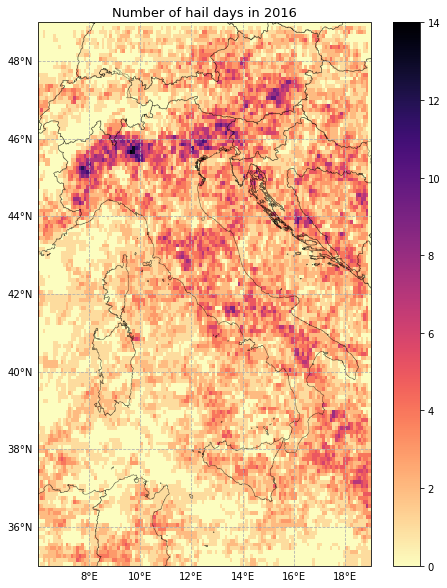

In [353]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016.plot(column='N_hailDays', ax=ax, cmap='magma_r', kind='geo', zorder=1, 
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Number of hail days in 2016', fontsize=13);

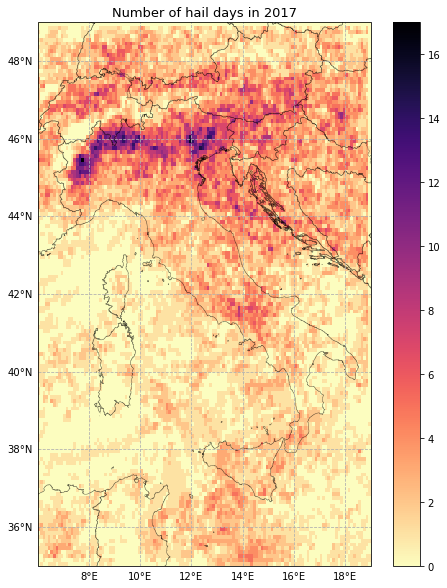

In [410]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2017.plot(column='N_hailDays', ax=ax, cmap='magma_r', kind='geo', zorder=1,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Number of hail days in 2017', fontsize=13);

#pl.savefig(plt_fold + f"/hailFreq/hailDays_2017_10km.jpg", dpi=200, bbox_inches='tight')

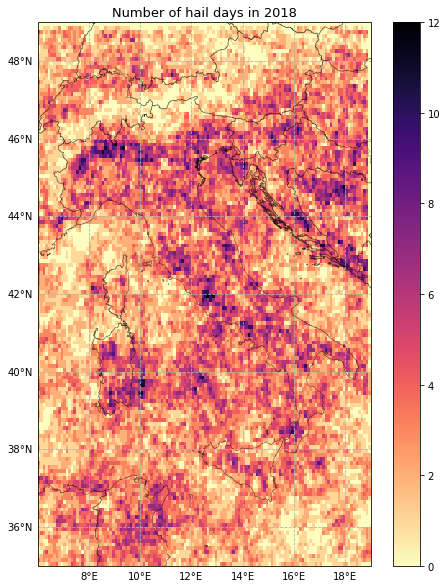

In [417]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2018.plot(column='N_hailDays', ax=ax, cmap='magma_r', kind='geo', zorder=1,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Number of hail days in 2018', fontsize=13);

#pl.savefig(plt_fold + f"/hailFreq/hailDays_2018_10km.jpg", dpi=200, bbox_inches='tight')

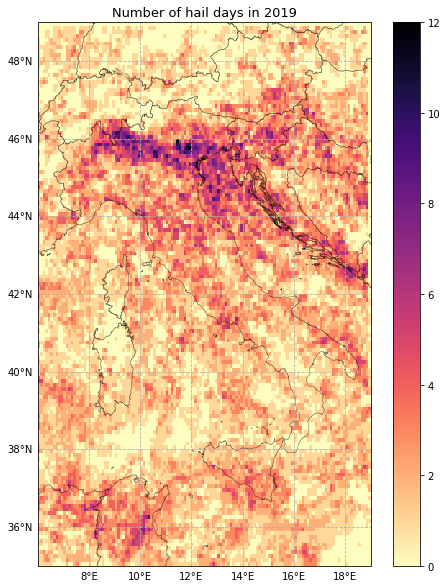

In [418]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2019.plot(column='N_hailDays', ax=ax, cmap='magma_r', kind='geo', zorder=1,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Number of hail days in 2019', fontsize=13);

#pl.savefig(plt_fold + f"/hailFreq/hailDays_2019_10km.jpg", dpi=200, bbox_inches='tight')

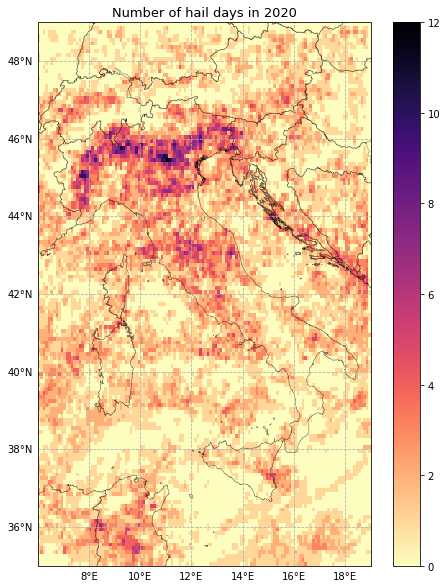

In [419]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2020.plot(column='N_hailDays', ax=ax, cmap='magma_r', kind='geo', zorder=1,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Number of hail days in 2020', fontsize=13);

#pl.savefig(plt_fold + f"/hailFreq/hailDays_2020_10km.jpg", dpi=200, bbox_inches='tight')

#### - Average of the 5 years:

In [127]:
hail_days_filtOT_2016_2020_AVG = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays_2016','N_hailDays_2017',
                                                          'N_hailDays_2018','N_hailDays_2019','N_hailDays_2020',
                                                          'N_hailDays_AVG'])
hail_days_filtOT_2016_2020_AVG['FID']= grid['FID']
hail_days_filtOT_2016_2020_AVG['geometry']= grid['geometry']
hail_days_filtOT_2016_2020_AVG['N_hailDays_2016'] = hail_days_filtOT_2016['N_hailDays']
hail_days_filtOT_2016_2020_AVG['N_hailDays_2017'] = hail_days_filtOT_2017['N_hailDays']
hail_days_filtOT_2016_2020_AVG['N_hailDays_2018'] = hail_days_filtOT_2018['N_hailDays']
hail_days_filtOT_2016_2020_AVG['N_hailDays_2019'] = hail_days_filtOT_2019['N_hailDays']
hail_days_filtOT_2016_2020_AVG['N_hailDays_2020'] = hail_days_filtOT_2020['N_hailDays']

hail_days_filtOT_2016_2020_AVG = hail_days_filtOT_2016_2020_AVG.fillna(0)

hail_days_filtOT_2016_2020_AVG['N_hailDays_AVG'] = hail_days_filtOT_2016_2020_AVG[['N_hailDays_2016',
                                                                                  'N_hailDays_2017',
                                                                                  'N_hailDays_2018',
                                                                                  'N_hailDays_2019',
                                                                                  'N_hailDays_2020']].mean(axis=1)

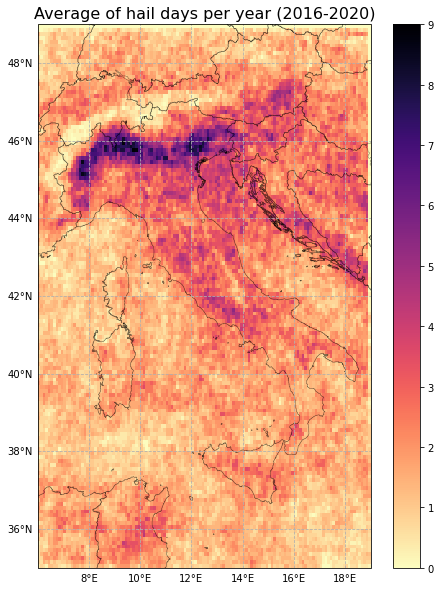

In [129]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_AVG.plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=9, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days per year (2016-2020)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km.jpg", dpi=200, bbox_inches='tight')

### - Monthly hail frequencies:

In [64]:
template = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
template['FID']= grid['FID']
template['geometry']= grid['geometry']
template['N_hailDays'] = template['N_hailDays'].astype(float)

In [65]:
template

,FID,geometry,N_hailDays
0,0,"POLYGON ((6.00000 35.00000, 6.00000 35.10000, ...",NaN
1,1,"POLYGON ((6.10000 35.00000, 6.10000 35.10000, ...",NaN
2,2,"POLYGON ((6.20000 35.00000, 6.20000 35.10000, ...",NaN
3,3,"POLYGON ((6.30000 35.00000, 6.30000 35.10000, ...",NaN
4,4,"POLYGON ((6.40000 35.00000, 6.40000 35.10000, ...",NaN
...,...,...,...
18195,18195,"POLYGON ((18.50000 48.90000, 18.50000 49.00000...",NaN
18196,18196,"POLYGON ((18.60000 48.90000, 18.60000 49.00000...",NaN
18197,18197,"POLYGON ((18.70000 48.90000, 18.70000 49.00000...",NaN
18198,18198,"POLYGON ((18.80000 48.90000, 18.80000 49.00000...",NaN


In [66]:
hail_days_filtOT_MONTHLY = dict()
pointInPolys_filtOT_sorted_MONTHLY = dict()

for month in [4,5,6,7,8,9,10]:
    hail_days_filtOT_MONTHLY[month] = dict()
    pointInPolys_filtOT_sorted_MONTHLY[month] = dict()
    
    for year in [2016,2017,2018,2019,2020]:
    
        hail_days_filtOT_MONTHLY[month][year] = template.copy()  #IMPORTANT .copy() OTHERWISE ALL COPIES OF 2016!!
        pointInPolys_filtOT_sorted_MONTHLY[month][year] = pointInPolys_filtOT_sorted[
                                                          (pointInPolys_filtOT_sorted.time.dt.year == year) & 
                                                          (pointInPolys_filtOT_sorted.time.dt.month == month)]

In [67]:
for month in [4,5,6,7,8,9,10]:
    print(f'Month {month}')
    
    for year in [2016,2017,2018,2019,2020]:
        print(f'Year {year}')
        
        #Extract the hail days for each grid cell (FID): 
        #select only FIDS with non null number of values
        FIDS = pointInPolys_filtOT_sorted_MONTHLY[month][year]['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_MONTHLY[month][year]['FID'].unique())]
        print(f'Fids {FIDS}')
        
        for fid in FIDS:
            
            N_hailDays_xFID = len(pointInPolys_filtOT_sorted_MONTHLY[month][year][pointInPolys_filtOT_sorted_MONTHLY[month][year][
                              'FID']==fid]['time'].dt.date.unique())
            
            hail_days_filtOT_MONTHLY[month][year]['N_hailDays'][hail_days_filtOT_MONTHLY[month][year]['FID'] 
                                                                == fid] = N_hailDays_xFID


Month 4
Year 2016
Fids [2.0000e+00 4.0000e+00 5.0000e+00 6.0000e+00 7.0000e+00 8.0000e+00
 9.0000e+00 1.3200e+02 1.3400e+02 1.3500e+02 1.3600e+02 1.3700e+02
 1.3800e+02 2.6200e+02 2.6300e+02 3.9100e+02 3.9200e+02 3.9300e+02
 3.9400e+02 3.9700e+02 5.2000e+02 5.2100e+02 5.2200e+02 5.2300e+02
 5.2400e+02 5.2500e+02 5.2600e+02 5.2700e+02 5.2800e+02 5.3200e+02
 6.5400e+02 6.5500e+02 6.5600e+02 6.5700e+02 6.6100e+02 7.8200e+02
 7.8400e+02 7.8900e+02 9.1000e+02 9.1100e+02 9.1200e+02 1.0430e+03
 1.0440e+03 1.3190e+03 1.4330e+03 1.4340e+03 1.4360e+03 1.4370e+03
 1.4470e+03 1.4490e+03 1.5610e+03 1.5620e+03 1.5630e+03 1.5640e+03
 1.5650e+03 1.5660e+03 1.5670e+03 1.6940e+03 2.0850e+03 2.2100e+03
 2.2110e+03 2.2120e+03 2.2130e+03 2.2140e+03 2.2150e+03 2.2160e+03
 2.3410e+03 2.3420e+03 7.5320e+03 8.7860e+03 8.7870e+03 8.8030e+03
 8.9170e+03 8.9330e+03 8.9340e+03 8.9350e+03 8.9360e+03 9.0650e+03
 9.0660e+03 9.1650e+03 9.1660e+03 9.2960e+03 9.5530e+03 9.5540e+03
 9.5550e+03 1.0510e+04 1.0511e+04 1.051

Year 2019
Fids [  147.   148.   149.   150.   151.   158.   277.   278.   279.   281.
   283.   284.   288.   411.   412.   413.   414.   419.   420.   543.
   544.   545.   546.   547.   548.   549.   550.   562.   563.   564.
   666.   667.   668.   670.   674.   675.   676.   677.   678.   679.
   681.   682.   683.   684.   685.   809.   812.   813.   814.   815.
   816.   817.   818.   935.   937.   938.   939.   941.   945.   946.
   948.  1062.  1063.  1064.  1065.  1066.  1067.  1068.  1069.  1071.
  1072.  1192.  1194.  1195.  1196.  1197.  1198.  1313.  1314.  1315.
  1316.  1317.  1321.  1322.  1323.  1325.  1326.  1446.  1447.  1453.
  1454.  1571.  1578.  1579.  1692.  1694.  1695.  1696.  1697.  1705.
  1706.  1825.  1826.  1836.  1837.  1838.  1839.  1840.  1841.  1842.
  1966.  1967.  1968.  1970.  1971.  1972.  1973.  2087.  2088.  2097.
  2098.  2099.  2100.  2101.  2102.  2103.  2104.  2218.  2219.  2220.
  2227.  2228.  2229.  2231.  2232.  2234.  2235.  2237.  2349

Year 2020
Fids [   47.    48.   177.   178.   307.   308.   437.   795.  1071.  1072.
  1074.  1204.  1205.  1262.  1263.  1300.  1391.  1392.  1393.  1521.
  1522.  1724.  1854.  1856.  3218.  3219.  3220.  3221.  3348.  3349.
  3350.  4404.  4414.  4415.  4416.  4419.  4420.  4421.  4536.  4544.
  4545.  4548.  4549.  4667.  4670.  4677.  4678.  4679.  4800.  4806.
  4807.  4808.  4809.  4934.  4935.  4937.  5086.  5202.  5216.  5323.
  5324.  5325.  5326.  5333.  5353.  5354.  5355.  5453.  5454.  5455.
  5456.  5457.  5484.  5485.  5486.  5573.  5583.  5584.  5585.  5586.
  5615.  5700.  5701.  5702.  5703.  5705.  5706.  5713.  5714.  5715.
  5716.  5829.  5830.  5831.  5832.  5833.  5843.  5844.  5845.  5846.
  5959.  5973.  5974.  5975.  5976.  5991.  6121.  6122.  6241.  6289.
  6290.  6370.  6371.  6378.  6379.  6419.  6485.  6486.  6509.  6510.
  6616.  6617.  6618.  6622.  6623.  6625.  6626.  6627.  6628.  6629.
  6632.  6638.  6752.  6753.  6755.  6756.  6757.  6758.  6759

In [68]:
#Monthly average of the 5 years together
hail_days_filtOT_2016_2020_MONTHLY_AVG = dict()

for month in [4,5,6,7,8,9,10]:
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month] = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays_2016',
                                                                              'N_hailDays_2017','N_hailDays_2018',
                                                                              'N_hailDays_2019','N_hailDays_2020',
                                                                              'N_hailDays_AVG'])
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['FID']= grid['FID']
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['geometry']= grid['geometry']
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['N_hailDays_2016'] = hail_days_filtOT_MONTHLY[month][2016]['N_hailDays']
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['N_hailDays_2017'] = hail_days_filtOT_MONTHLY[month][2017]['N_hailDays']
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['N_hailDays_2018'] = hail_days_filtOT_MONTHLY[month][2018]['N_hailDays']
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['N_hailDays_2019'] = hail_days_filtOT_MONTHLY[month][2019]['N_hailDays']
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['N_hailDays_2020'] = hail_days_filtOT_MONTHLY[month][2020]['N_hailDays']
    
    hail_days_filtOT_2016_2020_MONTHLY_AVG[month] = hail_days_filtOT_2016_2020_MONTHLY_AVG[month].fillna(0)
    
    if month != 10:
        hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['N_hailDays_AVG'] = hail_days_filtOT_2016_2020_MONTHLY_AVG[month][[
                                                                                      'N_hailDays_2016',
                                                                                      'N_hailDays_2017',
                                                                                      'N_hailDays_2018',
                                                                                      'N_hailDays_2019',
                                                                                      'N_hailDays_2020']].mean(axis=1)
    #caso particolare ottobre: nel 2020 nessun dato -> fare media sui 4 anni non 5!
    else:
        hail_days_filtOT_2016_2020_MONTHLY_AVG[month]['N_hailDays_AVG'] = hail_days_filtOT_2016_2020_MONTHLY_AVG[month][[
                                                                                      'N_hailDays_2016',
                                                                                      'N_hailDays_2017',
                                                                                      'N_hailDays_2018',
                                                                                      'N_hailDays_2019']].mean(axis=1)
    

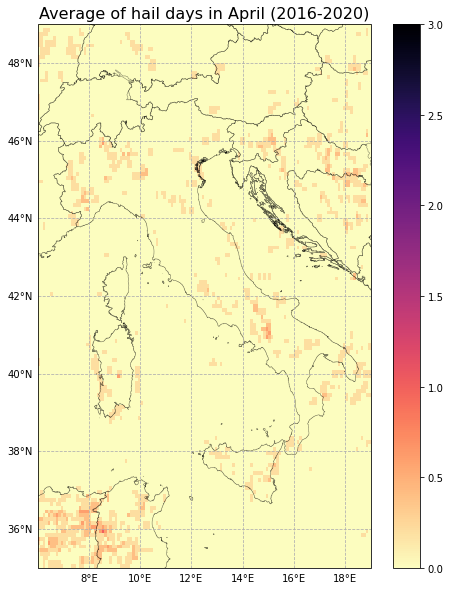

In [113]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_MONTHLY_AVG[4].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in April (2016-2020)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_04_Apr.pdf", dpi=200, bbox_inches='tight')

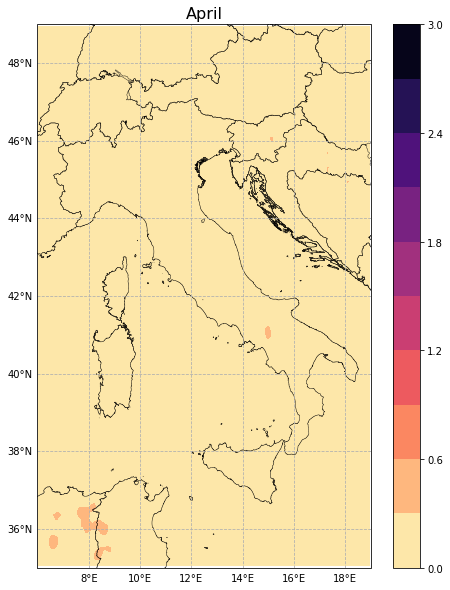

In [105]:
#SMOOTHED FIELD:
Xapr,Yapr,Zapr = smooth_field_Gaussian(hail_days_filtOT_2016_2020_MONTHLY_AVG[4])

map_crs = ccrs.PlateCarree()
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(Xapr, Yapr, Zapr, transform=map_crs, 
                  levels=np.arange(0,3.2,0.3), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
ax.set_title('April', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/monthly/SMOOTH_hailFreq_AVG_2016-2020_10km_04_Apr.pdf", dpi=200, bbox_inches='tight')

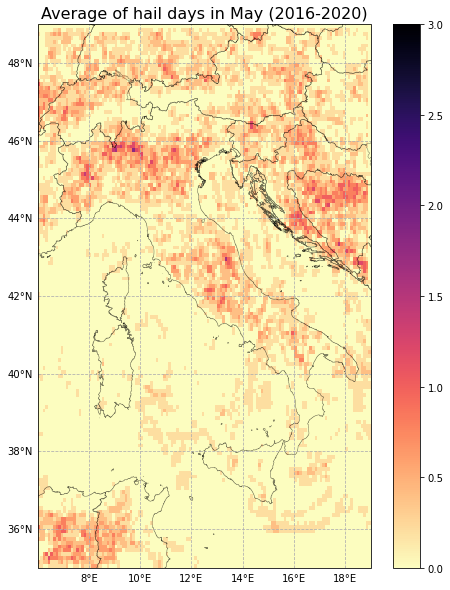

In [114]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_MONTHLY_AVG[5].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in May (2016-2020)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_05_May.pdf", dpi=200, bbox_inches='tight')

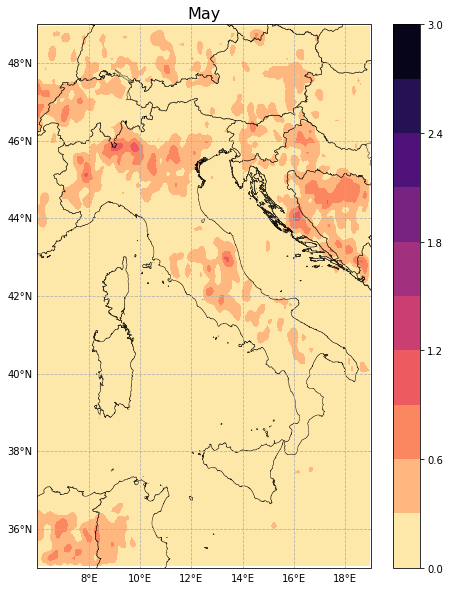

In [104]:
#SMOOTHED FIELD:
Xmay,Ymay,Zmay = smooth_field_Gaussian(hail_days_filtOT_2016_2020_MONTHLY_AVG[5])

map_crs = ccrs.PlateCarree()
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(Xmay, Ymay, Zmay, transform=map_crs, 
                  levels=np.arange(0,3.2,0.3), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
ax.set_title('May', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/monthly/SMOOTH_hailFreq_AVG_2016-2020_10km_05_May.pdf", dpi=200, bbox_inches='tight')

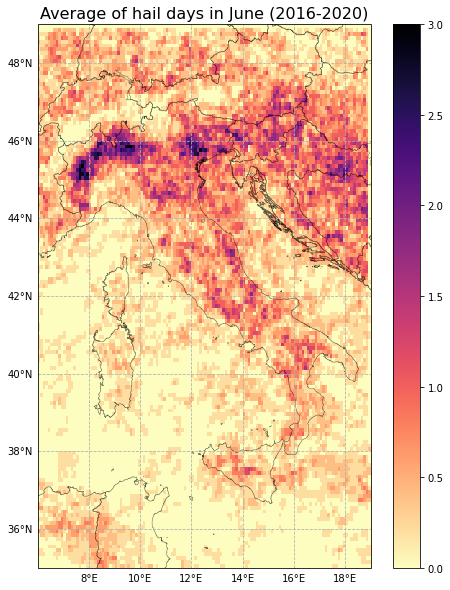

In [115]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_MONTHLY_AVG[6].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in June (2016-2020)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_06_Jun.pdf", dpi=200, bbox_inches='tight')

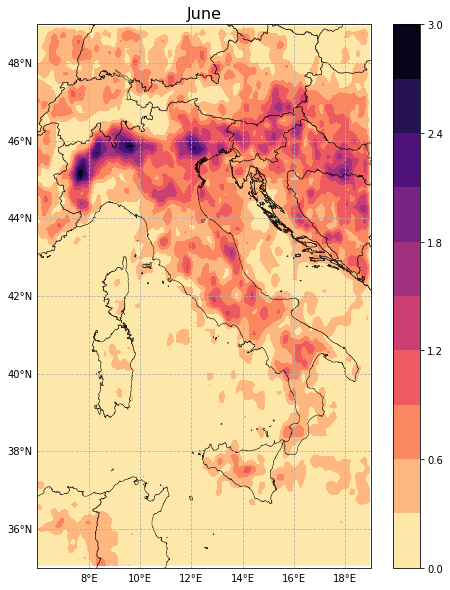

In [103]:
#SMOOTHED FIELD:
Xjun,Yjun,Zjun = smooth_field_Gaussian(hail_days_filtOT_2016_2020_MONTHLY_AVG[6])

map_crs = ccrs.PlateCarree()
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(Xjun, Yjun, Zjun, transform=map_crs, 
                  levels=np.arange(0,3.2,0.3), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
ax.set_title('June', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/monthly/SMOOTH_hailFreq_AVG_2016-2020_10km_06_Jun.pdf", dpi=200, bbox_inches='tight')

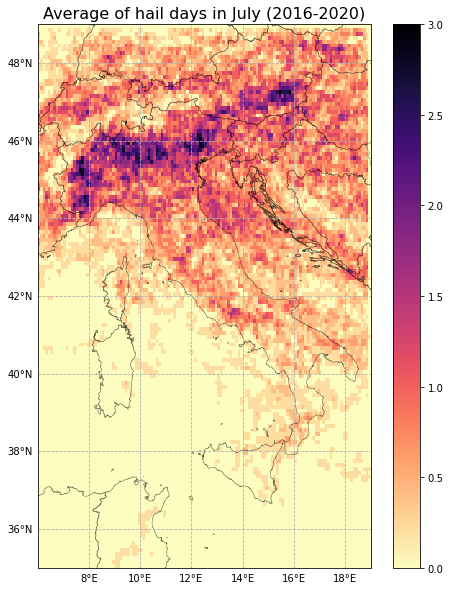

In [116]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_MONTHLY_AVG[7].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in July (2016-2020)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_07_Jul.pdf", dpi=200, bbox_inches='tight')

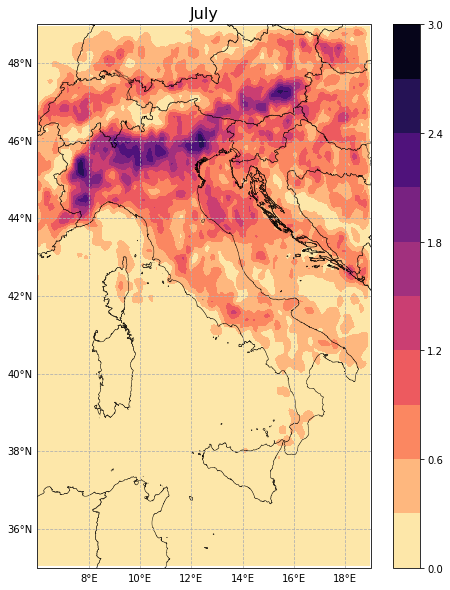

In [102]:
#SMOOTHED FIELD:
Xjul,Yjul,Zjul = smooth_field_Gaussian(hail_days_filtOT_2016_2020_MONTHLY_AVG[7])

map_crs = ccrs.PlateCarree()
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(Xjul, Yjul, Zjul, transform=map_crs, 
                  levels=np.arange(0,3.2,0.3), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
ax.set_title('July', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/monthly/SMOOTH_hailFreq_AVG_2016-2020_10km_07_Jul.pdf", dpi=200, bbox_inches='tight')

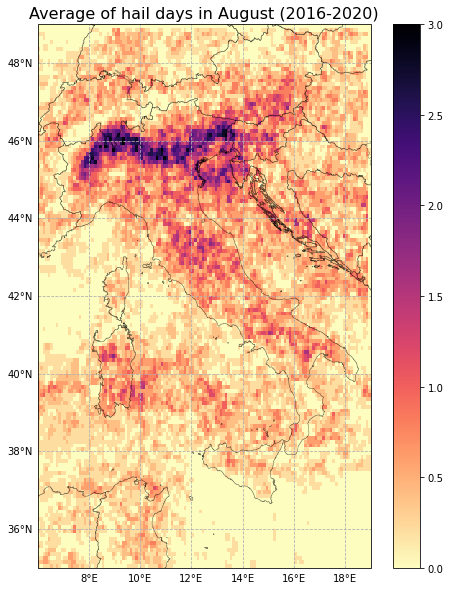

In [117]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_MONTHLY_AVG[8].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in August (2016-2020)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_08_Aug.pdf", dpi=200, bbox_inches='tight')

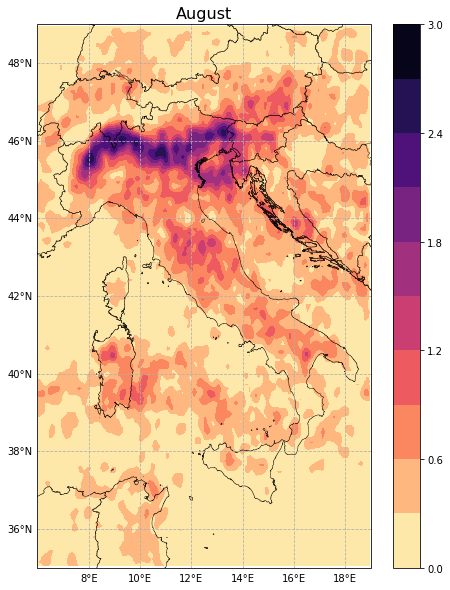

In [101]:
#SMOOTHED FIELD:
Xaug,Yaug,Zaug = smooth_field_Gaussian(hail_days_filtOT_2016_2020_MONTHLY_AVG[8])

map_crs = ccrs.PlateCarree()
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(Xaug, Yaug, Zaug, transform=map_crs, 
                  levels=np.arange(0,3.2,0.3), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
ax.set_title('August', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/monthly/SMOOTH_hailFreq_AVG_2016-2020_10km_08_Aug.pdf", dpi=200, bbox_inches='tight')

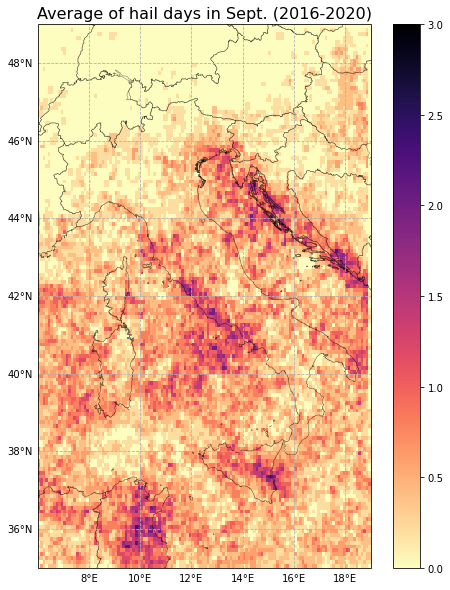

In [118]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_MONTHLY_AVG[9].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in Sept. (2016-2020)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_09_Sep.pdf", dpi=200, bbox_inches='tight')

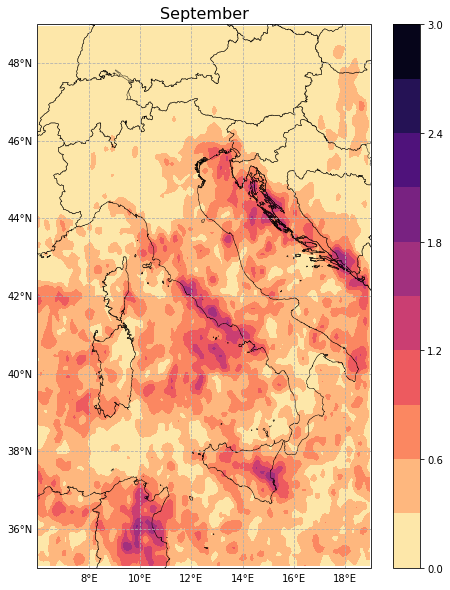

In [106]:
#SMOOTHED FIELD:
Xsep,Ysep,Zsep = smooth_field_Gaussian(hail_days_filtOT_2016_2020_MONTHLY_AVG[9])

map_crs = ccrs.PlateCarree()
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(Xsep, Ysep, Zsep, transform=map_crs, 
                  levels=np.arange(0,3.2,0.3), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
ax.set_title('September', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/monthly/SMOOTH_hailFreq_AVG_2016-2020_10km_09_Sep.pdf", dpi=200, bbox_inches='tight')

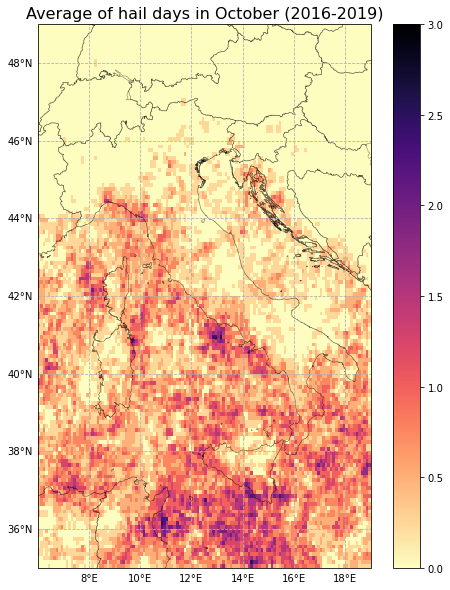

In [119]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_MONTHLY_AVG[10].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in October (2016-2019)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2019_10km_10_Oct.pdf", dpi=200, bbox_inches='tight')

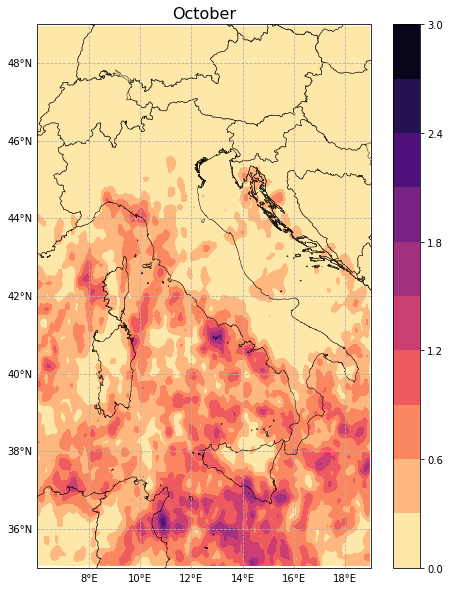

In [107]:
#SMOOTHED FIELD:
Xoct,Yoct,Zoct = smooth_field_Gaussian(hail_days_filtOT_2016_2020_MONTHLY_AVG[10])

map_crs = ccrs.PlateCarree()
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

aa = ax.contourf(Xoct, Yoct, Zoct, transform=map_crs, 
                  levels=np.arange(0,3.2,0.3), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.8, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
#ax.set_title('Frequency of Hail days (per year) 2016-2020', fontsize=13);
plt.colorbar(aa)
ax.set_title('October', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/monthly/SMOOTH_hailFreq_AVG_2016-2020_10km_10_Oct.pdf", dpi=200, bbox_inches='tight')

##### - Day/night separation

In [108]:
hail_days_filtOT_DAY = dict()
pointInPolys_filtOT_sorted_DAY = dict()

for year in [2016,2017,2018,2019,2020]:

    hail_days_filtOT_DAY[year] = template.copy()  #IMPORTANT .copy() OTHERWISE ALL COPIES OF 2016!!
    pointInPolys_filtOT_sorted_DAY[year] = pointInPolys_filtOT_sorted[
                                                      (pointInPolys_filtOT_sorted.time.dt.year == year) & 
                                                      (pointInPolys_filtOT_sorted.time.dt.hour >= 8) &
                                                      (pointInPolys_filtOT_sorted.time.dt.hour < 20)]

In [109]:
hail_days_filtOT_NIGHT = dict()
pointInPolys_filtOT_sorted_NIGHT_1 = dict()
pointInPolys_filtOT_sorted_NIGHT_2 = dict()
pointInPolys_filtOT_sorted_NIGHT = dict()


for year in [2016,2017,2018,2019,2020]:

    hail_days_filtOT_NIGHT[year] = template.copy()  #IMPORTANT .copy() OTHERWISE ALL COPIES OF 2016!!
    pointInPolys_filtOT_sorted_NIGHT_1[year] = pointInPolys_filtOT_sorted[
                                                      (pointInPolys_filtOT_sorted.time.dt.year == year) & 
                                                      (pointInPolys_filtOT_sorted.time.dt.hour < 8)]
    pointInPolys_filtOT_sorted_NIGHT_2[year] = pointInPolys_filtOT_sorted[
                                                      (pointInPolys_filtOT_sorted.time.dt.year == year) & 
                                                      (pointInPolys_filtOT_sorted.time.dt.hour >= 20)]
    pointInPolys_filtOT_sorted_NIGHT[year] = pd.concat([pointInPolys_filtOT_sorted_NIGHT_1[year],
                                                        pointInPolys_filtOT_sorted_NIGHT_2[year]])

In [110]:
for year in [2016,2017,2018,2019,2020]:
    print(f'Year {year}')
    
    #Extract the hail days for each grid cell (FID): 
    #select only FIDS with non null number of values
    FIDS = pointInPolys_filtOT_sorted_DAY[year]['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_DAY[year]['FID'].unique())]
    print(f'Fids {FIDS}')

    for fid in FIDS:

        N_hailDays_xFID = len(pointInPolys_filtOT_sorted_DAY[year][pointInPolys_filtOT_sorted_DAY[year][
                          'FID']==fid]['time'].dt.date.unique())

        hail_days_filtOT_DAY[year]['N_hailDays'][hail_days_filtOT_DAY[year]['FID'] 
                                                            == fid] = N_hailDays_xFID

Year 2016
Fids [1.0000e+00 2.0000e+00 4.0000e+00 ... 1.8063e+04 1.8066e+04 1.8067e+04]
Year 2017
Fids [1.0000e+00 4.0000e+00 5.0000e+00 ... 1.8063e+04 1.8064e+04 1.8068e+04]
Year 2018
Fids [1.0000e+00 2.0000e+00 4.0000e+00 ... 1.8058e+04 1.8064e+04 1.8066e+04]
Year 2019
Fids [0.0000e+00 1.0000e+00 2.0000e+00 ... 1.8061e+04 1.8062e+04 1.8067e+04]
Year 2020
Fids [1.2000e+01 1.3000e+01 1.6000e+01 ... 1.8064e+04 1.8067e+04 1.8068e+04]


In [111]:
for year in [2016,2017,2018,2019,2020]:
    print(f'Year {year}')
    
    #Extract the hail days for each grid cell (FID): 
    #select only FIDS with non null number of values
    FIDS = pointInPolys_filtOT_sorted_NIGHT[year]['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_NIGHT[year]['FID'].unique())]
    print(f'Fids {FIDS}')

    for fid in FIDS:

        N_hailDays_xFID = len(pointInPolys_filtOT_sorted_NIGHT[year][pointInPolys_filtOT_sorted_NIGHT[year][
                          'FID']==fid]['time'].dt.date.unique())

        hail_days_filtOT_NIGHT[year]['N_hailDays'][hail_days_filtOT_NIGHT[year]['FID'] 
                                                            == fid] = N_hailDays_xFID

Year 2016
Fids [   55.    56.    60. ... 18060. 18064. 18065.]
Year 2017
Fids [   19.    27.    55. ... 18045. 18064. 18065.]
Year 2018
Fids [1.3000e+01 1.4000e+01 1.5000e+01 ... 1.8060e+04 1.8063e+04 1.8064e+04]
Year 2019
Fids [1.4000e+01 1.5000e+01 1.6000e+01 ... 1.8037e+04 1.8044e+04 1.8045e+04]
Year 2020
Fids [   83.    84.   102. ... 18037. 18058. 18059.]


In [112]:
for year in [2016,2017,2018,2019,2020]:
    hail_days_filtOT_DAY[year] = hail_days_filtOT_DAY[year].fillna(0)
    hail_days_filtOT_NIGHT[year] = hail_days_filtOT_NIGHT[year].fillna(0)

In [113]:
#Day/night average of the 5 years together
hail_days_filtOT_2016_2020_DAY_AVG = dict()
hail_days_filtOT_2016_2020_NIGHT_AVG = dict()

hail_days_filtOT_2016_2020_DAY_AVG = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays_2016',
                                                                              'N_hailDays_2017','N_hailDays_2018',
                                                                              'N_hailDays_2019','N_hailDays_2020',
                                                                              'N_hailDays_AVG'])
hail_days_filtOT_2016_2020_NIGHT_AVG = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays_2016',
                                                                              'N_hailDays_2017','N_hailDays_2018',
                                                                              'N_hailDays_2019','N_hailDays_2020',
                                                                              'N_hailDays_AVG'])
hail_days_filtOT_2016_2020_DAY_AVG['FID']= grid['FID']
hail_days_filtOT_2016_2020_NIGHT_AVG['FID']= grid['FID']

hail_days_filtOT_2016_2020_DAY_AVG['geometry']= grid['geometry']
hail_days_filtOT_2016_2020_NIGHT_AVG['geometry']= grid['geometry']

hail_days_filtOT_2016_2020_DAY_AVG['N_hailDays_2016'] = hail_days_filtOT_DAY[2016]['N_hailDays']
hail_days_filtOT_2016_2020_DAY_AVG['N_hailDays_2017'] = hail_days_filtOT_DAY[2017]['N_hailDays']
hail_days_filtOT_2016_2020_DAY_AVG['N_hailDays_2018'] = hail_days_filtOT_DAY[2018]['N_hailDays']
hail_days_filtOT_2016_2020_DAY_AVG['N_hailDays_2019'] = hail_days_filtOT_DAY[2019]['N_hailDays']
hail_days_filtOT_2016_2020_DAY_AVG['N_hailDays_2020'] = hail_days_filtOT_DAY[2020]['N_hailDays']

hail_days_filtOT_2016_2020_NIGHT_AVG['N_hailDays_2016'] = hail_days_filtOT_NIGHT[2016]['N_hailDays']
hail_days_filtOT_2016_2020_NIGHT_AVG['N_hailDays_2017'] = hail_days_filtOT_NIGHT[2017]['N_hailDays']
hail_days_filtOT_2016_2020_NIGHT_AVG['N_hailDays_2018'] = hail_days_filtOT_NIGHT[2018]['N_hailDays']
hail_days_filtOT_2016_2020_NIGHT_AVG['N_hailDays_2019'] = hail_days_filtOT_NIGHT[2019]['N_hailDays']
hail_days_filtOT_2016_2020_NIGHT_AVG['N_hailDays_2020'] = hail_days_filtOT_NIGHT[2020]['N_hailDays']

hail_days_filtOT_2016_2020_DAY_AVG = hail_days_filtOT_2016_2020_DAY_AVG.fillna(0)
hail_days_filtOT_2016_2020_NIGHT_AVG = hail_days_filtOT_2016_2020_NIGHT_AVG.fillna(0)


hail_days_filtOT_2016_2020_DAY_AVG['N_hailDays_AVG'] = hail_days_filtOT_2016_2020_DAY_AVG[[
                                                                                      'N_hailDays_2016',
                                                                                      'N_hailDays_2017',
                                                                                      'N_hailDays_2018',
                                                                                      'N_hailDays_2019',
                                                                                      'N_hailDays_2020']].mean(axis=1)
hail_days_filtOT_2016_2020_NIGHT_AVG['N_hailDays_AVG'] = hail_days_filtOT_2016_2020_NIGHT_AVG[[
                                                                                      'N_hailDays_2016',
                                                                                      'N_hailDays_2017',
                                                                                      'N_hailDays_2018',
                                                                                      'N_hailDays_2019',
                                                                                      'N_hailDays_2020']].mean(axis=1)

In [44]:
hail_days_filtOT_2016_2020_DAY_AVG

,FID,geometry,N_hailDays_2016,N_hailDays_2017,N_hailDays_2018,N_hailDays_2019,N_hailDays_2020,N_hailDays_AVG
0,0,"POLYGON ((6.00000 35.00000, 6.00000 35.10000, ...",0.0,0.0,0.0,1.0,0.0,0.2
1,1,"POLYGON ((6.10000 35.00000, 6.10000 35.10000, ...",1.0,1.0,1.0,1.0,0.0,0.8
2,2,"POLYGON ((6.20000 35.00000, 6.20000 35.10000, ...",1.0,0.0,1.0,1.0,0.0,0.6
3,3,"POLYGON ((6.30000 35.00000, 6.30000 35.10000, ...",0.0,0.0,0.0,1.0,0.0,0.2
4,4,"POLYGON ((6.40000 35.00000, 6.40000 35.10000, ...",2.0,1.0,2.0,1.0,0.0,1.2
...,...,...,...,...,...,...,...,...
18195,18195,"POLYGON ((18.50000 48.90000, 18.50000 49.00000...",0.0,0.0,0.0,0.0,0.0,0.0
18196,18196,"POLYGON ((18.60000 48.90000, 18.60000 49.00000...",0.0,0.0,0.0,0.0,0.0,0.0
18197,18197,"POLYGON ((18.70000 48.90000, 18.70000 49.00000...",0.0,0.0,0.0,0.0,0.0,0.0
18198,18198,"POLYGON ((18.80000 48.90000, 18.80000 49.00000...",0.0,0.0,0.0,0.0,0.0,0.0


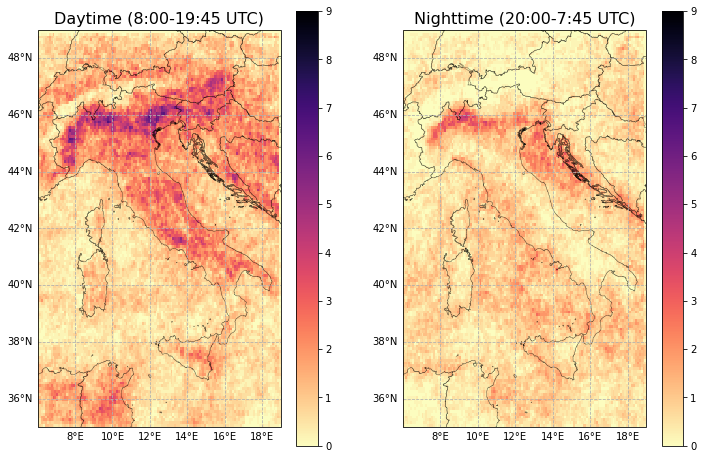

In [47]:
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12,8), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_DAY_AVG.plot(column='N_hailDays_AVG', ax=ax1, cmap='magma_r', kind='geo', 
                                        vmin=0, vmax=9, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Daytime (8:00-19:45 UTC)', fontsize=16);

hail_days_filtOT_2016_2020_NIGHT_AVG.plot(column='N_hailDays_AVG', ax=ax2, cmap='magma_r', kind='geo', 
                                          vmin=0, vmax=9, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Nighttime (20:00-7:45 UTC)', fontsize=16);

#pl.savefig(plt_fold + f"/hailFreq/hailFreq_DayNight_AVG_2016-2020_10km_3.pdf",dpi=150, bbox_inches='tight')

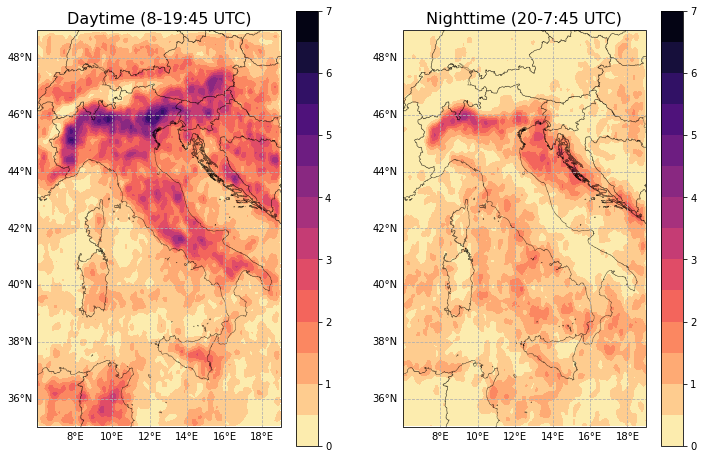

In [119]:
#SMOOTHED FIELDS:
map_crs = ccrs.PlateCarree()
fig, (ax1,ax2) = plt.subplots(1, 2, figsize=(12,8), subplot_kw={'projection': ccrs.PlateCarree()})

Xday,Yday,Zday = smooth_field_Gaussian(hail_days_filtOT_2016_2020_DAY_AVG)

aa = ax1.contourf(Xday, Yday, Zday, transform=map_crs, 
                  levels=np.arange(0,7.5,0.5), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax1, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax1.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax1.set_xlim(x_lim)
ax1.set_ylim(y_lim)
ax1.set_title('Daytime (8-19:45 UTC)', fontsize=16);
plt.colorbar(aa)

Xnig,Ynig,Znig = smooth_field_Gaussian(hail_days_filtOT_2016_2020_NIGHT_AVG)

bb = ax2.contourf(Xnig, Ynig, Znig, transform=map_crs, 
                  levels=np.arange(0,7.5,0.5), cmap='magma_r', lw=1.5, corner_mask=False)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax2, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax2.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax2.set_xlim(x_lim)
ax2.set_ylim(y_lim)
ax2.set_title('Nighttime (20-7:45 UTC)', fontsize=16);
plt.colorbar(bb)

#pl.savefig(plt_fold + f"/hailFreq/SMOOTH_hailFreq_DayNight_AVG_2016-2020_10km_3.pdf",dpi=150, bbox_inches='tight')

### - Seasonal hail maps

Aggregate two or three months together for obtaining seasonal maps

In [9]:
template = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
template['FID']= grid['FID']
template['geometry']= grid['geometry']
template['N_hailDays'] = template['N_hailDays'].astype(float)

In [13]:
hail_days_filtOT_YEARLY = dict()
pointInPolys_filtOT_sorted_YEARLY = dict()

for year in [2016,2017,2018,2019,2020]:

    hail_days_filtOT_YEARLY[year] = dict()
    pointInPolys_filtOT_sorted_YEARLY[year] = dict()
    
    for month in [4,5,6,7,8,9,10]:
        
        hail_days_filtOT_YEARLY[year][month] = template.copy()
        pointInPolys_filtOT_sorted_YEARLY[year][month] = pointInPolys_filtOT_sorted[
                                                          (pointInPolys_filtOT_sorted.time.dt.year == year) & 
                                                          (pointInPolys_filtOT_sorted.time.dt.month == month)]


In [14]:
for year in [2016,2017,2018,2019,2020]:
    print(f'Year {year}')
    
    for month in [4,5,6,7,8,9,10]:
        print(f'Month {month}')
        
        #Extract the hail days for each grid cell (FID): 
        #select only FIDS with non null number of values
        FIDS = pointInPolys_filtOT_sorted_YEARLY[year][month]['FID'].unique()[~np.isnan(pointInPolys_filtOT_sorted_YEARLY[year][month]['FID'].unique())]
        print(f'Fids {FIDS}')
    
        for fid in FIDS:
            
            N_hailDays_xFID = len(pointInPolys_filtOT_sorted_YEARLY[year][month][pointInPolys_filtOT_sorted_YEARLY[year][month][
                              'FID']==fid]['time'].dt.date.unique())
            
            hail_days_filtOT_YEARLY[year][month]['N_hailDays'][hail_days_filtOT_YEARLY[year][month]['FID'] 
                                                                == fid] = N_hailDays_xFID
    

Year 2016
Month 4
Fids [2.0000e+00 4.0000e+00 5.0000e+00 6.0000e+00 7.0000e+00 8.0000e+00
 9.0000e+00 1.3200e+02 1.3400e+02 1.3500e+02 1.3600e+02 1.3700e+02
 1.3800e+02 2.6200e+02 2.6300e+02 3.9100e+02 3.9200e+02 3.9300e+02
 3.9400e+02 3.9700e+02 5.2000e+02 5.2100e+02 5.2200e+02 5.2300e+02
 5.2400e+02 5.2500e+02 5.2600e+02 5.2700e+02 5.2800e+02 5.3200e+02
 6.5400e+02 6.5500e+02 6.5600e+02 6.5700e+02 6.6100e+02 7.8200e+02
 7.8400e+02 7.8900e+02 9.1000e+02 9.1100e+02 9.1200e+02 1.0430e+03
 1.0440e+03 1.3190e+03 1.4330e+03 1.4340e+03 1.4360e+03 1.4370e+03
 1.4470e+03 1.4490e+03 1.5610e+03 1.5620e+03 1.5630e+03 1.5640e+03
 1.5650e+03 1.5660e+03 1.5670e+03 1.6940e+03 2.0850e+03 2.2100e+03
 2.2110e+03 2.2120e+03 2.2130e+03 2.2140e+03 2.2150e+03 2.2160e+03
 2.3410e+03 2.3420e+03 7.5320e+03 8.7860e+03 8.7870e+03 8.8030e+03
 8.9170e+03 8.9330e+03 8.9340e+03 8.9350e+03 8.9360e+03 9.0650e+03
 9.0660e+03 9.1650e+03 9.1660e+03 9.2960e+03 9.5530e+03 9.5540e+03
 9.5550e+03 1.0510e+04 1.0511e+04 1.051

Month 5
Fids [0.0000e+00 4.0000e+00 5.0000e+00 ... 1.8057e+04 1.8058e+04 1.8064e+04]
Month 6
Fids [   23.    24.    25. ... 18054. 18056. 18058.]
Month 7
Fids [ 2688.  2689.  2818. ... 18063. 18064. 18066.]
Month 8
Fids [4.0000e+00 5.0000e+00 6.0000e+00 ... 1.8054e+04 1.8055e+04 1.8056e+04]
Month 9
Fids [1.0000e+00 2.0000e+00 6.0000e+00 ... 1.8054e+04 1.8055e+04 1.8060e+04]
Month 10
Fids [1.3000e+01 1.4000e+01 2.1000e+01 ... 1.5657e+04 1.6792e+04 1.6922e+04]
Year 2019
Month 4
Fids [  147.   148.   149.   150.   151.   158.   277.   278.   279.   281.
   283.   284.   288.   411.   412.   413.   414.   419.   420.   543.
   544.   545.   546.   547.   548.   549.   550.   562.   563.   564.
   666.   667.   668.   670.   674.   675.   676.   677.   678.   679.
   681.   682.   683.   684.   685.   809.   812.   813.   814.   815.
   816.   817.   818.   935.   937.   938.   939.   941.   945.   946.
   948.  1062.  1063.  1064.  1065.  1066.  1067.  1068.  1069.  1071.
  1072.  1192.  1

Month 6
Fids [  933.  1062.  1063. ... 18053. 18060. 18067.]
Month 7
Fids [   30.    31.   159. ... 18051. 18061. 18067.]
Month 8
Fids [0.0000e+00 2.0000e+00 3.0000e+00 ... 1.8059e+04 1.8060e+04 1.8062e+04]
Month 9
Fids [4.0000e+00 5.0000e+00 1.4000e+01 ... 1.7154e+04 1.7283e+04 1.7284e+04]
Month 10
Fids [1.1000e+01 1.4000e+01 1.5000e+01 ... 1.4783e+04 1.4784e+04 1.4914e+04]
Year 2020
Month 4
Fids [  297.   298.   427.   428.   557.   558.   559.   560.   561.   687.
   688.   689.   813.  1058.  1059.  1060.  1061.  1166.  1167.  1179.
  1180.  1188.  1189.  1190.  1192.  1193.  1194.  1195.  1196.  1204.
  1205.  1298.  1308.  1309.  1310.  1320.  1321.  1322.  1323.  1324.
  1325.  1326.  1328.  1329.  1330.  1332.  1335.  1339.  1439.  1440.
  1441.  1450.  1451.  1452.  1453.  1459.  1460.  1462.  1463.  1567.
  1568.  1569.  1570.  1571.  1573.  1574.  1575.  1576.  1590.  1598.
  1599.  1696.  1697.  1698.  1699.  1700.  1701.  1702.  1703.  1707.
  1708.  1709.  1710.  1720.  1

In [15]:
for year in [2016,2017,2018,2019,2020]:
    for month in [4,5,6,7,8,9,10]:
        hail_days_filtOT_YEARLY[year][month] = hail_days_filtOT_YEARLY[year][month].fillna(0)

In [16]:
hail_days_filtOT_YEARLY_seasonal = dict()

for year in [2016,2017,2018,2019,2020]:
    
    hail_days_filtOT_YEARLY_seasonal[year] = dict()
    
    hail_days_filtOT_YEARLY_seasonal[year]['spring'] = template.copy()
    hail_days_filtOT_YEARLY_seasonal[year]['summer'] = template.copy()
    hail_days_filtOT_YEARLY_seasonal[year]['fall'] = template.copy()

    hail_days_filtOT_YEARLY_seasonal[year]['spring']['N_hailDays'] = hail_days_filtOT_YEARLY[year][4]['N_hailDays']+ hail_days_filtOT_YEARLY[year][5]['N_hailDays']
    
    hail_days_filtOT_YEARLY_seasonal[year]['summer']['N_hailDays'] = hail_days_filtOT_YEARLY[year][6]['N_hailDays']+ hail_days_filtOT_YEARLY[year][7]['N_hailDays'] + hail_days_filtOT_YEARLY[year][8]['N_hailDays']
        
    hail_days_filtOT_YEARLY_seasonal[year]['fall']['N_hailDays'] = hail_days_filtOT_YEARLY[year][9]['N_hailDays'] 
    + hail_days_filtOT_YEARLY[year][10]['N_hailDays']

In [17]:
#Seasonal average of the 5 years together
hail_days_filtOT_2016_2020_SEASONAL_AVG = dict()

for season in ['spring','summer','fall']:
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season] = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays_2016',
                                                                              'N_hailDays_2017','N_hailDays_2018',
                                                                              'N_hailDays_2019','N_hailDays_2020',
                                                                              'N_hailDays_AVG'])
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['FID']= grid['FID']
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['geometry']= grid['geometry']
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['N_hailDays_2016'] = hail_days_filtOT_YEARLY_seasonal[2016][season]['N_hailDays']
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['N_hailDays_2017'] = hail_days_filtOT_YEARLY_seasonal[2017][season]['N_hailDays']
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['N_hailDays_2018'] = hail_days_filtOT_YEARLY_seasonal[2018][season]['N_hailDays']
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['N_hailDays_2019'] = hail_days_filtOT_YEARLY_seasonal[2019][season]['N_hailDays']
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['N_hailDays_2020'] = hail_days_filtOT_YEARLY_seasonal[2020][season]['N_hailDays']
    
    hail_days_filtOT_2016_2020_SEASONAL_AVG[season]['N_hailDays_AVG'] = hail_days_filtOT_2016_2020_SEASONAL_AVG[season][[
                                                                                      'N_hailDays_2016',
                                                                                      'N_hailDays_2017',
                                                                                      'N_hailDays_2018',
                                                                                      'N_hailDays_2019',
                                                                                      'N_hailDays_2020']].mean(axis=1)

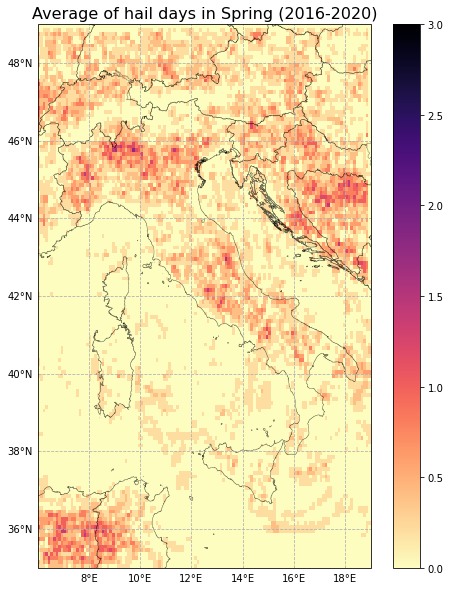

In [140]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_SEASONAL_AVG['spring'].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', 
                                                       kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in Spring (2016-2020)', fontsize=16);

pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_Spring.pdf", dpi=200, bbox_inches='tight')

In [158]:
hail_days_filtOT_2016_2020_SEASONAL_AVG['spring']['N_hailDays_AVG'].sort_values()

9099     0.0
8736     0.0
8737     0.0
8738     0.0
8739     0.0
        ... 
12861    1.4
12203    1.4
10343    1.6
13940    1.6
13947    1.8
Name: N_hailDays_AVG, Length: 18200, dtype: float64

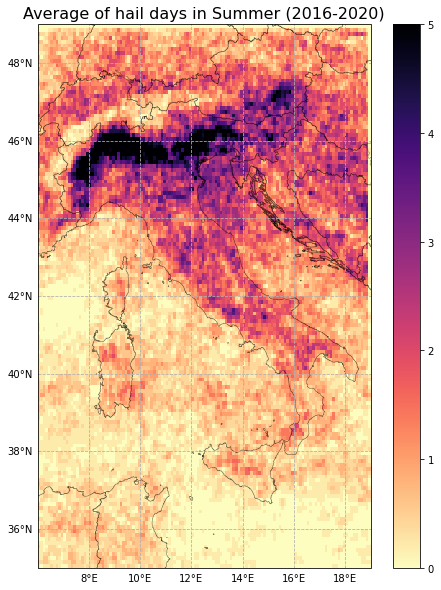

In [142]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_SEASONAL_AVG['summer'].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', 
                                                       kind='geo', zorder=1, vmin=0, 
                                    vmax=5, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in Summer (2016-2020)', fontsize=16);

pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_Summer.pdf", dpi=200, bbox_inches='tight')

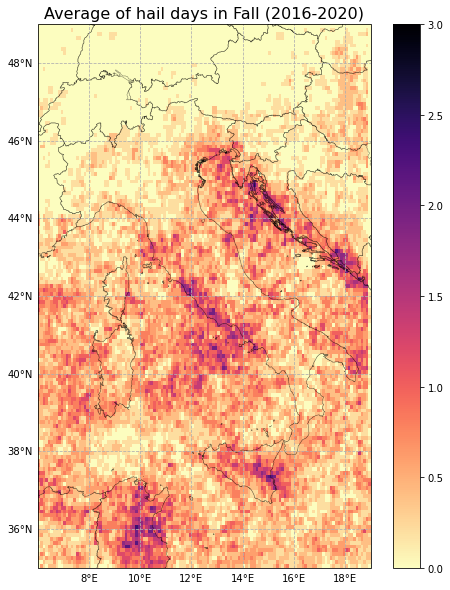

In [143]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_SEASONAL_AVG['fall'].plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', 
                                                       kind='geo', zorder=1, vmin=0, 
                                    vmax=3, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of hail days in Fall (2016-2020)', fontsize=16);

pl.savefig(plt_fold + f"/hailFreq/hailFreq_AVG_2016-2020_10km_Fall.pdf", dpi=200, bbox_inches='tight')

#### - Seasonal maps for 3 levels of hail hazard:

- <0.5 hail days per season: low hazard
- ">0.5 & < 3 hail days per season: medium hazard
- ">3 hail days per season: high hazard

In [18]:
from matplotlib.colors import ListedColormap

In [19]:
cmap = ListedColormap(["#F2F1E4","#CE9758","#7D0112"])
    
    #"blue", "orange", "red"])

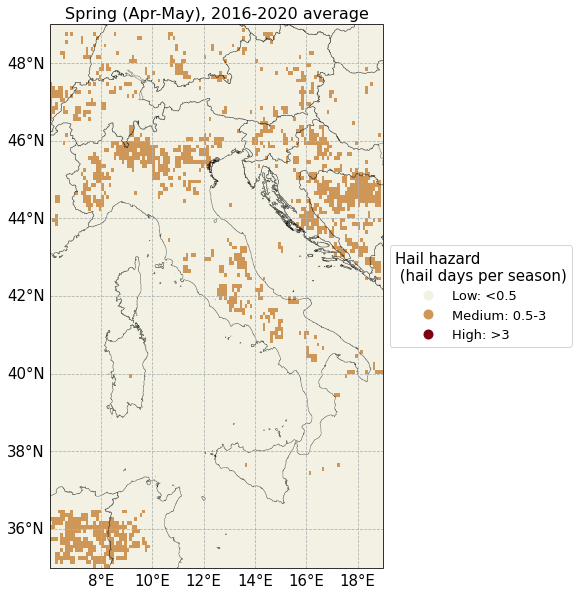

In [20]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_SEASONAL_AVG['spring'].plot(ax=ax, column='N_hailDays_AVG', cmap=cmap, 
                                                       scheme='User_Defined', zorder=1, 
                                                       classification_kwds={'bins':[0.5, 3.0, np.inf]},
                                                       legend=True,
                                                      legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5),
                                                                  'labels' : ['Low: <0.5',
                                                                              'Medium: 0.5-3',
                                                                              'High: >3'],
                                                                   'title' : 'Hail hazard \n (hail days per season)',
                                                                  'fontsize':13, 'title_fontsize':15})
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
gls.xlabel_style = {'size': 15}
gls.ylabel_style = {'size': 15}
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Spring (Apr-May), 2016-2020 average', fontsize=16);

pl.savefig(plt_fold + f"/hailFreq/seasonal/hailFreq_AVG_2016-2020_10km_Spring.jpg", dpi=200, bbox_inches='tight')

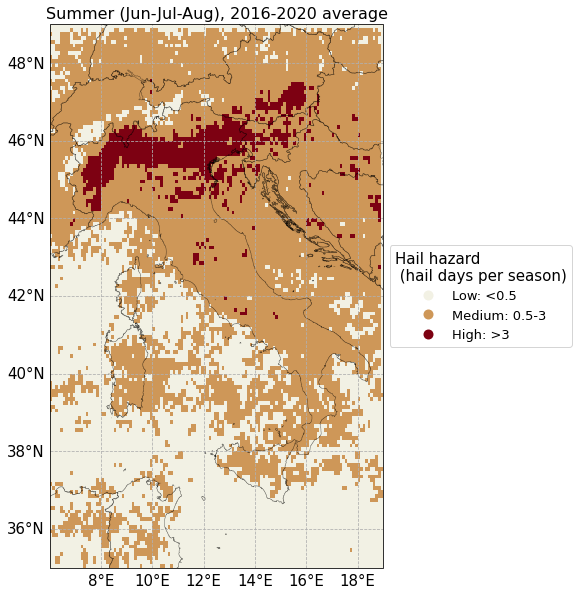

In [21]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_SEASONAL_AVG['summer'].plot(ax=ax, column='N_hailDays_AVG', cmap=cmap, 
                                                       scheme='User_Defined', zorder=1, 
                                                       classification_kwds={'bins':[0.5, 3.0, np.inf]},
                                                       legend=True,
                                                      legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5),
                                                                  'labels' : ['Low: <0.5',
                                                                              'Medium: 0.5-3',
                                                                              'High: >3'],
                                                                   'title' : 'Hail hazard \n (hail days per season)',
                                                                  'fontsize':13, 'title_fontsize':15})
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
gls.xlabel_style = {'size': 15}
gls.ylabel_style = {'size': 15}
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Summer (Jun-Jul-Aug), 2016-2020 average', fontsize=16);

pl.savefig(plt_fold + f"/hailFreq/seasonal/hailFreq_AVG_2016-2020_10km_Summer.jpg", dpi=200, bbox_inches='tight')

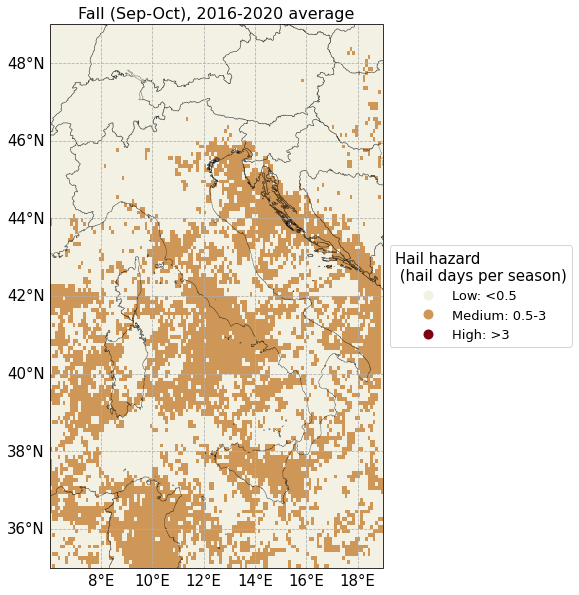

In [22]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

hail_days_filtOT_2016_2020_SEASONAL_AVG['fall'].plot(ax=ax, column='N_hailDays_AVG', cmap=cmap, 
                                                       scheme='User_Defined', zorder=1, 
                                                       classification_kwds={'bins':[0.5, 3.0, np.inf]},
                                                       legend=True,
                                                      legend_kwds={'loc': 'center left', 'bbox_to_anchor':(1,0.5),
                                                                  'labels' : ['Low: <0.5',
                                                                              'Medium: 0.5-3',
                                                                              'High: >3'],
                                                                   'title' : 'Hail hazard \n (hail days per season)',
                                                                  'fontsize':13, 'title_fontsize':15})
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
gls.xlabel_style = {'size': 15}
gls.ylabel_style = {'size': 15}
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Fall (Sep-Oct), 2016-2020 average', fontsize=16);

pl.savefig(plt_fold + f"/hailFreq/seasonal/hailFreq_AVG_2016-2020_10km_Fall.jpg", dpi=200, bbox_inches='tight')

In [23]:
#Hail hazard categorization in 3 classes:
hail_hazard_2016_2020_spring = template.copy()
hail_hazard_2016_2020_spring['N_hailDays'] = hail_days_filtOT_2016_2020_SEASONAL_AVG['spring']['N_hailDays_AVG']
hail_hazard_2016_2020_spring['hailHaz_cat'] = pd.Series()

hail_hazard_2016_2020_spring.loc[hail_hazard_2016_2020_spring['N_hailDays'] < 0.5, 'hailHaz_cat'] = 1
hail_hazard_2016_2020_spring.loc[(hail_hazard_2016_2020_spring['N_hailDays'] >= 0.5) & 
                                 (hail_hazard_2016_2020_spring['N_hailDays'] <= 3),'hailHaz_cat'] = 2
hail_hazard_2016_2020_spring.loc[hail_hazard_2016_2020_spring['N_hailDays'] > 3, 'hailHaz_cat'] = 3

hail_hazard_2016_2020_summer = template.copy()
hail_hazard_2016_2020_summer['N_hailDays'] = hail_days_filtOT_2016_2020_SEASONAL_AVG['summer']['N_hailDays_AVG']
hail_hazard_2016_2020_summer['hailHaz_cat'] = pd.Series()

hail_hazard_2016_2020_summer.loc[hail_hazard_2016_2020_summer['N_hailDays'] < 0.5, 'hailHaz_cat'] = 1
hail_hazard_2016_2020_summer.loc[(hail_hazard_2016_2020_summer['N_hailDays'] >= 0.5) & 
                                 (hail_hazard_2016_2020_summer['N_hailDays'] <= 3),'hailHaz_cat'] = 2
hail_hazard_2016_2020_summer.loc[hail_hazard_2016_2020_summer['N_hailDays'] > 3, 'hailHaz_cat'] = 3

hail_hazard_2016_2020_fall = template.copy()
hail_hazard_2016_2020_fall['N_hailDays'] = hail_days_filtOT_2016_2020_SEASONAL_AVG['fall']['N_hailDays_AVG']
hail_hazard_2016_2020_fall['hailHaz_cat'] = pd.Series()

hail_hazard_2016_2020_fall.loc[hail_hazard_2016_2020_fall['N_hailDays'] < 0.5, 'hailHaz_cat'] = 1
hail_hazard_2016_2020_fall.loc[(hail_hazard_2016_2020_fall['N_hailDays'] >= 0.5) & 
                                 (hail_hazard_2016_2020_fall['N_hailDays'] <= 3),'hailHaz_cat'] = 2
hail_hazard_2016_2020_fall.loc[hail_hazard_2016_2020_fall['N_hailDays'] > 3, 'hailHaz_cat'] = 3

In [24]:
hail_hazard_2016_2020_summer

,FID,geometry,N_hailDays,hailHaz_cat
0,0,"POLYGON ((6.00000 35.00000, 6.00000 35.10000, ...",0.2,1.0
1,1,"POLYGON ((6.10000 35.00000, 6.10000 35.10000, ...",0.0,1.0
2,2,"POLYGON ((6.20000 35.00000, 6.20000 35.10000, ...",0.2,1.0
3,3,"POLYGON ((6.30000 35.00000, 6.30000 35.10000, ...",0.2,1.0
4,4,"POLYGON ((6.40000 35.00000, 6.40000 35.10000, ...",0.2,1.0
...,...,...,...,...
18195,18195,"POLYGON ((18.50000 48.90000, 18.50000 49.00000...",0.0,1.0
18196,18196,"POLYGON ((18.60000 48.90000, 18.60000 49.00000...",0.0,1.0
18197,18197,"POLYGON ((18.70000 48.90000, 18.70000 49.00000...",0.0,1.0
18198,18198,"POLYGON ((18.80000 48.90000, 18.80000 49.00000...",0.0,1.0


#### - Write external netCdf files

In [25]:
import xarray as xr

In [58]:
#Extract from geometry lat/lon coordinates (centroids of grid)
hail_hazard_2016_2020_spring['lon'] = hail_hazard_2016_2020_spring.centroid.x  
hail_hazard_2016_2020_spring['lat'] = hail_hazard_2016_2020_spring.centroid.y

hail_hazard_2016_2020_summer['lon'] = hail_hazard_2016_2020_summer.centroid.x  
hail_hazard_2016_2020_summer['lat'] = hail_hazard_2016_2020_summer.centroid.y

hail_hazard_2016_2020_fall['lon'] = hail_hazard_2016_2020_fall.centroid.x  
hail_hazard_2016_2020_fall['lat'] = hail_hazard_2016_2020_fall.centroid.y

In [59]:
"""
IMPORTATNTISSIMO!!!!!
Round to two digits after point lat/lon values because some of them are something like: 6.0499999999 intead of 6.05
Skipping this point would cause errors in the correct definition of the grid afterward!!!
"""
hail_hazard_2016_2020_spring = hail_hazard_2016_2020_spring.round({'lon': 2, 'lat': 2})
hail_hazard_2016_2020_summer = hail_hazard_2016_2020_summer.round({'lon': 2, 'lat': 2})
hail_hazard_2016_2020_fall = hail_hazard_2016_2020_fall.round({'lon': 2, 'lat': 2})

In [62]:
#drop geometry and define lat/lon as multi index in the dataframe
hail_hazard_2016_2020_spring_multiIndex = hail_hazard_2016_2020_spring.drop(columns='geometry').set_index([
    'lat', 'lon'])

hail_hazard_2016_2020_summer_multiIndex = hail_hazard_2016_2020_summer.drop(columns='geometry').set_index([
    'lat', 'lon'])

hail_hazard_2016_2020_fall_multiIndex = hail_hazard_2016_2020_fall.drop(columns='geometry').set_index([
    'lat', 'lon'])

In [66]:
#convert dataframe to xarray
xr_hail_hazard_2016_2020_spring = hail_hazard_2016_2020_spring_multiIndex.to_xarray()

xr_hail_hazard_2016_2020_summer = hail_hazard_2016_2020_summer_multiIndex.to_xarray()

xr_hail_hazard_2016_2020_fall = hail_hazard_2016_2020_fall_multiIndex.to_xarray()

In [67]:
xr_hail_hazard_2016_2020_spring['lat'].attrs={'units':'degrees', 'long_name':'Latitude'}
xr_hail_hazard_2016_2020_spring['lon'].attrs={'units':'degrees', 'long_name':'Longitude'}

xr_hail_hazard_2016_2020_summer['lat'].attrs={'units':'degrees', 'long_name':'Latitude'}
xr_hail_hazard_2016_2020_summer['lon'].attrs={'units':'degrees', 'long_name':'Longitude'}

xr_hail_hazard_2016_2020_fall['lat'].attrs={'units':'degrees', 'long_name':'Latitude'}
xr_hail_hazard_2016_2020_fall['lon'].attrs={'units':'degrees', 'long_name':'Longitude'}

In [71]:
#Write xarray to external netCdf files
xr_hail_hazard_2016_2020_spring.to_netcdf(plt_fold+'/hailFreq/hail_hazard_2016_2020_spring.nc') 
xr_hail_hazard_2016_2020_summer.to_netcdf(plt_fold+'/hailFreq/hail_hazard_2016_2020_summer.nc') 
xr_hail_hazard_2016_2020_fall.to_netcdf(plt_fold+'/hailFreq/hail_hazard_2016_2020_fall.nc') 

### - ESWD reports distribution on the same grid

In [10]:
#Read ESWD data:
df_eswd_1 = pd.read_csv(fold + 'hail4_punge/ESWD/ESWD_HAIL_19790101-20200531_v1_6.csv')
df_eswd_2 = pd.read_csv(fold + 'hail4_punge/ESWD/ESWD_HAIL_20200601-20201031_v1_6.csv')

#Select data of interest
eswd_df_1 = pd.DataFrame()
eswd_df_1['datetime'] = pd.to_datetime(df_eswd_1['TIME_EVENT'])
eswd_df_1[['lat','lon','size','QC_level','Time_accuracy','Max_hailst_weight','Thickness_hail_layer','Total_damage',
          'N_injured','N_killed','Impacts']] = df_eswd_1[['LATITUDE','LONGITUDE','MAX_HAIL_DIAMETER','QC_LEVEL',
                                                          'TIME_ACCURACY','MAX_HAILSTONE_WEIGHT',
                                                          'THICKNESS_HAIL_LAYER','TOTAL_DAMAGE','NO_INJURED',
                                                         'NO_KILLED','IMPACTS']]
eswd_df_1 = eswd_df_1.sort_values(by='datetime').reset_index(drop=True)

#remove June 2020 data because they are already present in df_eswd_2
eswd_df_1 = eswd_df_1.drop(eswd_df_1[(eswd_df_1.datetime.dt.year==2020)&(eswd_df_1.datetime.dt.month==6)].index)

eswd_df_2 = pd.DataFrame()
eswd_df_2['datetime'] = pd.to_datetime(df_eswd_2['TIME_EVENT'])
eswd_df_2[['lat','lon','size','QC_level','Time_accuracy','Max_hailst_weight','Thickness_hail_layer','Total_damage',
          'N_injured','N_killed','Impacts']] = df_eswd_2[['LATITUDE','LONGITUDE','MAX_HAIL_DIAMETER','QC_LEVEL',
                                                          'TIME_ACCURACY','MAX_HAILSTONE_WEIGHT',
                                                          'THICKNESS_HAIL_LAYER','TOTAL_DAMAGE','NO_INJURED',
                                                         'NO_KILLED','IMPACTS']]
eswd_df_2 = eswd_df_2.sort_values(by='datetime').reset_index(drop=True)

#concat the two datasets:
eswd_df = pd.concat([eswd_df_1,eswd_df_2])

#Retain only reports in the selected period and space domain
eswd_df_years = eswd_df.datetime.apply(lambda x: x.year)
eswd_df_months = eswd_df.datetime.apply(lambda x: x.month)
eswd_df_days = eswd_df.datetime.apply(lambda x: x.day)
eswd_df_hours = eswd_df.datetime.apply(lambda x: x.hour)

eswd_df_sel = eswd_df.loc[(eswd_df_years >= 2016) & (eswd_df_years <= 2020) & (eswd_df_months >= 4)   #(eswd_df_years >= 1995) &
                         & (eswd_df_months <= 10)]
eswd_df_sel = eswd_df_sel.loc[(eswd_df_sel.lat >= latmin) & (eswd_df_sel.lat <= latmax)]
eswd_ev_sel = eswd_df_sel.loc[(eswd_df_sel.lon >= lonmin) & (eswd_df_sel.lon <= lonmax)].reset_index(drop=True)

#Convert to geodataframe:
eswd = gpd.GeoDataFrame(eswd_ev_sel, geometry=gpd.points_from_xy(eswd_ev_sel.lon, eswd_ev_sel.lat))

#remove data too close to sphera border/upper-right corner of the domain (2016-2018):
tbRemoved = [128,316,327,328,330,
             507,632,883,884,
             929,
            1676,1678,
            2229,2232]
eswd = eswd.drop(tbRemoved)

#Remove ESWD data when SPHERA data is missing (problems in the production of SPHERA)
dates2020_tbRemoved = pd.Series(['2020-06-22','2020-06-23','2020-06-24','2020-06-25','2020-07-14','2020-07-15',
                                 '2020-07-18','2020-07-23','2020-07-24','2020-07-25','2020-07-31','2020-08-01',
                                 '2020-08-02','2020-08-03','2020-08-04','2020-08-05','2020-08-06','2020-08-07',
                                 '2020-08-15'])
eswd_2020_tbRemoved_JJA = eswd[eswd.datetime.dt.strftime('%Y-%m-%d').isin(dates2020_tbRemoved)]

#And remove ESWD data in the month of October 2020 due to problems with the soil of SPHERA
eswd_2020_tbRemoved_Oct = eswd[(eswd.datetime.dt.year==2020) & (eswd.datetime.dt.month==10)]

eswd_2020_tbRemoved = pd.concat([eswd_2020_tbRemoved_JJA,eswd_2020_tbRemoved_Oct])

eswd = eswd.drop(eswd_2020_tbRemoved.index)

#split eswd dataset in the years:
eswd_2016 = eswd[eswd.datetime.dt.year ==2016]
eswd_2017 = eswd[eswd.datetime.dt.year ==2017].reset_index(drop=True)
eswd_2018 = eswd[eswd.datetime.dt.year ==2018].reset_index(drop=True)
eswd_2019 = eswd[eswd.datetime.dt.year ==2019].reset_index(drop=True)
eswd_2020 = eswd[eswd.datetime.dt.year ==2020].reset_index(drop=True)

In [50]:
eswd['N_ESWD'] = 1

#spatial join between points and grid
pointInPolys_ESWD = sjoin(eswd, grid, how='left').drop(['index_right'],axis=1)

#Remove duplicated reports:
pointInPolys_ESWD = pointInPolys_ESWD[~pointInPolys_ESWD.index.duplicated(keep='first')]

#sum points in each grid cell
pointSumByPoly_ESWD = pointInPolys_ESWD.groupby('FID')['N_ESWD'].agg(['sum'])

#create grid with associated number of OTs for each grid:
ESWD_countOnGrid = sfg_sp.copy()
ESWD_countOnGrid['N_ESWD'] = pointSumByPoly_ESWD['sum']

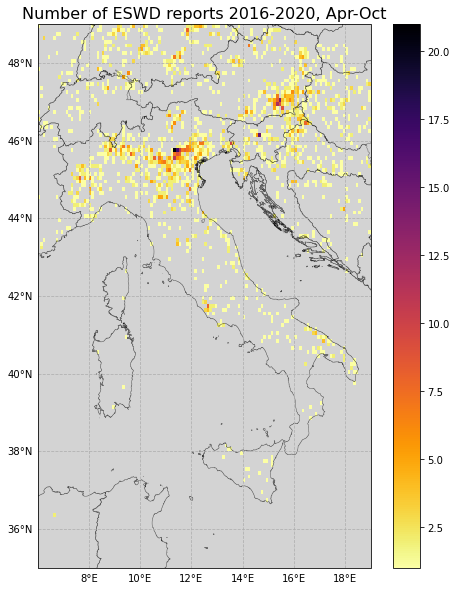

In [55]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

ax.set_facecolor("lightgray")
ESWD_countOnGrid.plot(column='N_ESWD', ax=ax, cmap='inferno_r', kind='geo', zorder=1,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Number of ESWD reports 2016-2020, Apr-Oct', fontsize=16);

#pl.savefig(f"/home/ciccuz/phd/KIT/scripts/plots_2016-2020_FULL/eswd_reports/eswd_NumbReports_2016-2020_10km.jpg", 
#           dpi=200, bbox_inches='tight')

In [56]:
template = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
template['FID']= grid['FID']
template['geometry']= grid['geometry']
template['N_hailDays'] = template['N_hailDays'].astype(float)

In [57]:
pointInPolys_ESWD_sorted = pointInPolys_ESWD.sort_values(by='FID')

In [71]:
eswd_hail_days_ANNUAL = dict()
pointInPolys_ESWD_sorted_ANNUAL = dict()

for year in [2016,2017,2018,2019,2020]:

    eswd_hail_days_ANNUAL[year] = template.copy()  #IMPORTANT .copy() OTHERWISE ALL COPIES OF 2016!!
    pointInPolys_ESWD_sorted_ANNUAL[year] = pointInPolys_ESWD_sorted[
        (pointInPolys_ESWD_sorted.datetime.dt.year == year)]
    
    #Extract the hail days for each grid cell (FID): 
    #select only FIDS with non null number of values
    FIDS = pointInPolys_ESWD_sorted_ANNUAL[year]['FID'].unique()[~np.isnan(pointInPolys_ESWD_sorted_ANNUAL[year]['FID'].unique())]

    for fid in FIDS:
            
        N_hailDays_xFID = len(pointInPolys_ESWD_sorted_ANNUAL[year][pointInPolys_ESWD_sorted_ANNUAL[year][
                          'FID']==fid]['datetime'].dt.date.unique())

        eswd_hail_days_ANNUAL[year]['N_hailDays'][eswd_hail_days_ANNUAL[year]['FID'] 
                                                            == fid] = N_hailDays_xFID

In [74]:
max(eswd_hail_days_ANNUAL[2016]['N_hailDays'])

nan

In [86]:
#Yearly average of the 5 years together
eswd_hail_days_2016_2020_ANNUAL_AVG = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays_2016',
                                                                              'N_hailDays_2017','N_hailDays_2018',
                                                                              'N_hailDays_2019','N_hailDays_2020',
                                                                              'N_hailDays_AVG'])

    
eswd_hail_days_2016_2020_ANNUAL_AVG['FID']= grid['FID']
eswd_hail_days_2016_2020_ANNUAL_AVG['geometry']= grid['geometry']
eswd_hail_days_2016_2020_ANNUAL_AVG['N_hailDays_2016'] = eswd_hail_days_ANNUAL[2016]['N_hailDays']
eswd_hail_days_2016_2020_ANNUAL_AVG['N_hailDays_2017'] = eswd_hail_days_ANNUAL[2017]['N_hailDays']
eswd_hail_days_2016_2020_ANNUAL_AVG['N_hailDays_2018'] = eswd_hail_days_ANNUAL[2018]['N_hailDays']
eswd_hail_days_2016_2020_ANNUAL_AVG['N_hailDays_2019'] = eswd_hail_days_ANNUAL[2019]['N_hailDays']
eswd_hail_days_2016_2020_ANNUAL_AVG['N_hailDays_2020'] = eswd_hail_days_ANNUAL[2020]['N_hailDays']

eswd_hail_days_2016_2020_ANNUAL_AVG = eswd_hail_days_2016_2020_ANNUAL_AVG.fillna(0)
    
eswd_hail_days_2016_2020_ANNUAL_AVG['N_hailDays_AVG'] = eswd_hail_days_2016_2020_ANNUAL_AVG[[
                                                                                  'N_hailDays_2016',
                                                                                  'N_hailDays_2017',
                                                                                  'N_hailDays_2018',
                                                                                  'N_hailDays_2019',
                                                                                  'N_hailDays_2020']].mean(axis=1)

In [87]:
max(eswd_hail_days_2016_2020_ANNUAL_AVG['N_hailDays_AVG'])

2.2

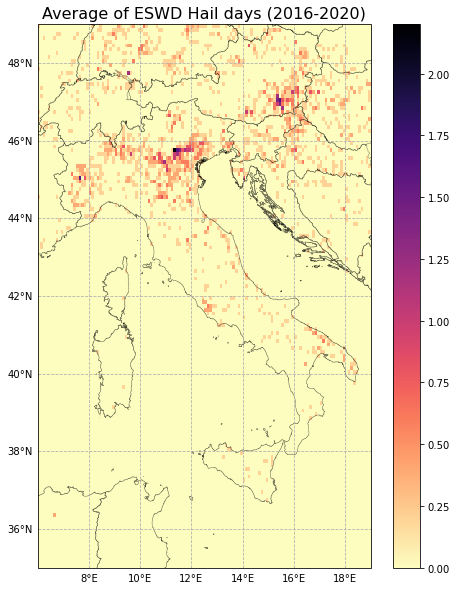

In [131]:
fig, ax = plt.subplots(1, 1, figsize=(8,10), subplot_kw={'projection': ccrs.PlateCarree()})

ax.set_facecolor("lightgray")
eswd_hail_days_2016_2020_ANNUAL_AVG.plot(column='N_hailDays_AVG', ax=ax, cmap='magma_r', kind='geo', zorder=1,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Average of ESWD Hail days (2016-2020)', fontsize=16);

#pl.savefig(f"/home/ciccuz/phd/KIT/scripts/plots_2016-2020_FULL/eswd_reports/eswd_hailFreq_AVG_2016-2020_10km.pdf", 
#           dpi=200, bbox_inches='tight')

### Try with 100km grid instead of 10km:

In Prein & Holland 2018: in EU using a 100x100 km grid they estimate hail days frequency based on the number of ESWD reports during 1979-2015, annual average, obtaining values between 0 and 1.6 hail days per year

In [338]:
#Read SPHERA data (10km grid) and couple box number to coordinate locations:
sfg_sp_100 = gpd.read_file(fold + "data/lampinet/mask/grid_1.shp", encoding='latin-1')
grid_100 = sfg_sp_100

(35.0, 49.0)

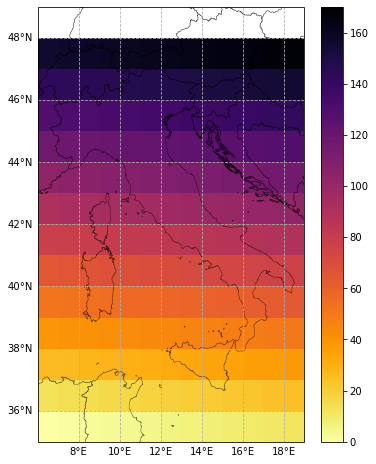

In [340]:
#PLOT OF THE GRID (COLOR DEPENDING ON GRID CELL ID)
fig, ax = plt.subplots(1, 1, figsize=(6,8), subplot_kw={'projection': ccrs.PlateCarree()})

grid_100.plot(column='FID', ax=ax, cmap='inferno_r', kind='geo', vmin=0, vmax=170, zorder=1, legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)

In [342]:
#spatial join between points and grid
pointInPolys_ESWD_100km = sjoin(eswd, grid_100, how='left').drop(['index_right'],axis=1)

#sum points in each grid cell
pointSumByPoly_ESWD_100km = pointInPolys_ESWD_100km.groupby('FID')['N_ESWD'].agg(['sum'])

#create grid with associated number of OTs for each grid:
ESWD_countOnGrid_100km = sfg_sp_100.copy()
ESWD_countOnGrid_100km['N_ESWD'] = pointSumByPoly_ESWD_100km['sum']

In [344]:
eswd_hail_days_100km = gpd.GeoDataFrame(columns=['FID','geometry','N_hailDays'])
eswd_hail_days_100km['FID']= grid_100['FID']
eswd_hail_days_100km['geometry']= grid_100['geometry']
eswd_hail_days_100km['N_hailDays'] = eswd_hail_days_100km['N_hailDays'].astype(float)

In [345]:
pointInPolys_ESWD_sorted_100km = pointInPolys_ESWD_100km.sort_values(by='FID')

In [347]:
#Extract the hail days for each grid cell (FID): 
for fid in np.arange(0,170,1):

    eswd_hail_days_100km['N_hailDays'][eswd_hail_days_100km['FID'] == fid]=len(pointInPolys_ESWD_sorted_100km[pointInPolys_ESWD_sorted_100km['FID']==fid]['datetime'].dt.date.unique())
    

In [354]:
eswd_hail_days_100km['freq_hailDays'] = eswd_hail_days_100km['N_hailDays']/5

In [355]:
max(eswd_hail_days_100km['freq_hailDays'])

11.8

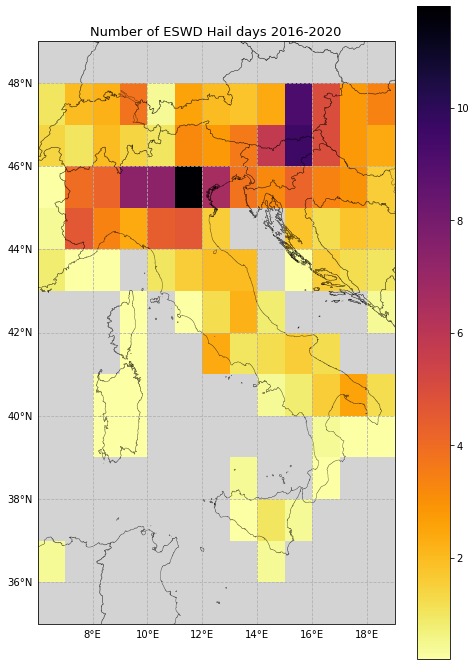

In [356]:
fig, ax = plt.subplots(1, 1, figsize=(8,12), subplot_kw={'projection': ccrs.PlateCarree()})

ax.set_facecolor("lightgray")
eswd_hail_days_100km[eswd_hail_days_100km.N_hailDays!=0].plot(column='freq_hailDays', ax=ax, cmap='inferno_r', kind='geo', zorder=1,
                     legend=True)
#shapefiles    
for shp in sf_geo:
    shp.plot(ax=ax, alpha = 0.5, facecolor = 'none', lw = 0.5, zorder=2)

gls = ax.gridlines(draw_labels=True, dms=True, x_inline=False, y_inline=False, linestyle='--')
gls.top_labels=False   # suppress top labels
gls.right_labels=False # suppress right labels
ax.set_xlim(x_lim)
ax.set_ylim(y_lim)
ax.set_title('Number of ESWD Hail days 2016-2020', fontsize=13);